# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_8_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 4yahvw72
Name: stellar-blaze-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/4yahvw72
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-4yahvw72/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6659,15190,18874,4829,7542,5864
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1685,3775,4738,1184,1902,1455
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [01:01<10:12:34, 61.36s/it]

Epoch 1/600:   0%|          | 1/600 [01:01<10:12:34, 61.36s/it, v_num=72_1, total_loss_train=618, kl_local_train=30.2]

Epoch 2/600:   0%|          | 1/600 [01:01<10:12:34, 61.36s/it, v_num=72_1, total_loss_train=618, kl_local_train=30.2]

Epoch 2/600:   0%|          | 2/600 [01:59<9:54:45, 59.67s/it, v_num=72_1, total_loss_train=618, kl_local_train=30.2] 

Epoch 2/600:   0%|          | 2/600 [01:59<9:54:45, 59.67s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5]

Epoch 3/600:   0%|          | 2/600 [01:59<9:54:45, 59.67s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5]

Epoch 3/600:   0%|          | 3/600 [02:58<9:48:06, 59.11s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5]

Epoch 3/600:   0%|          | 3/600 [02:58<9:48:06, 59.11s/it, v_num=72_1, total_loss_train=456, kl_local_train=62]  

Epoch 4/600:   0%|          | 3/600 [02:58<9:48:06, 59.11s/it, v_num=72_1, total_loss_train=456, kl_local_train=62]

Epoch 4/600:   1%|          | 4/600 [03:56<9:43:45, 58.77s/it, v_num=72_1, total_loss_train=456, kl_local_train=62]

Epoch 4/600:   1%|          | 4/600 [03:56<9:43:45, 58.77s/it, v_num=72_1, total_loss_train=446, kl_local_train=66.7]

Epoch 5/600:   1%|          | 4/600 [03:56<9:43:45, 58.77s/it, v_num=72_1, total_loss_train=446, kl_local_train=66.7]

Epoch 5/600:   1%|          | 5/600 [04:55<9:42:24, 58.73s/it, v_num=72_1, total_loss_train=446, kl_local_train=66.7]

Epoch 5/600:   1%|          | 5/600 [04:55<9:42:24, 58.73s/it, v_num=72_1, total_loss_train=440, kl_local_train=69.4]

Epoch 6/600:   1%|          | 5/600 [04:56<9:42:24, 58.73s/it, v_num=72_1, total_loss_train=440, kl_local_train=69.4]

Epoch 6/600:   1%|          | 6/600 [05:48<9:22:28, 56.82s/it, v_num=72_1, total_loss_train=440, kl_local_train=69.4]

Epoch 6/600:   1%|          | 6/600 [05:48<9:22:28, 56.82s/it, v_num=72_1, total_loss_train=436, kl_local_train=70.2, metric_mi|age_categorical_train=0.0699]

Epoch 7/600:   1%|          | 6/600 [05:48<9:22:28, 56.82s/it, v_num=72_1, total_loss_train=436, kl_local_train=70.2, metric_mi|age_categorical_train=0.0699]

Epoch 7/600:   1%|          | 7/600 [06:40<9:06:02, 55.25s/it, v_num=72_1, total_loss_train=436, kl_local_train=70.2, metric_mi|age_categorical_train=0.0699]

Epoch 7/600:   1%|          | 7/600 [06:40<9:06:02, 55.25s/it, v_num=72_1, total_loss_train=433, kl_local_train=69.5, metric_mi|age_categorical_train=0.0699]

Epoch 8/600:   1%|          | 7/600 [06:40<9:06:02, 55.25s/it, v_num=72_1, total_loss_train=433, kl_local_train=69.5, metric_mi|age_categorical_train=0.0699]

Epoch 8/600:   1%|▏         | 8/600 [07:32<8:54:52, 54.21s/it, v_num=72_1, total_loss_train=433, kl_local_train=69.5, metric_mi|age_categorical_train=0.0699]

Epoch 8/600:   1%|▏         | 8/600 [07:32<8:54:52, 54.21s/it, v_num=72_1, total_loss_train=438, kl_local_train=62.4, metric_mi|age_categorical_train=0.0699]

Epoch 9/600:   1%|▏         | 8/600 [07:32<8:54:52, 54.21s/it, v_num=72_1, total_loss_train=438, kl_local_train=62.4, metric_mi|age_categorical_train=0.0699]

Epoch 9/600:   2%|▏         | 9/600 [08:24<8:47:11, 53.52s/it, v_num=72_1, total_loss_train=438, kl_local_train=62.4, metric_mi|age_categorical_train=0.0699]

Epoch 9/600:   2%|▏         | 9/600 [08:24<8:47:11, 53.52s/it, v_num=72_1, total_loss_train=442, kl_local_train=50, metric_mi|age_categorical_train=0.0699]  

Epoch 10/600:   2%|▏         | 9/600 [08:24<8:47:11, 53.52s/it, v_num=72_1, total_loss_train=442, kl_local_train=50, metric_mi|age_categorical_train=0.0699]

Epoch 10/600:   2%|▏         | 10/600 [09:18<8:48:39, 53.76s/it, v_num=72_1, total_loss_train=442, kl_local_train=50, metric_mi|age_categorical_train=0.0699]

Epoch 10/600:   2%|▏         | 10/600 [09:18<8:48:39, 53.76s/it, v_num=72_1, total_loss_train=445, kl_local_train=44.9, metric_mi|age_categorical_train=0.0699]

Epoch 11/600:   2%|▏         | 10/600 [09:19<8:48:39, 53.76s/it, v_num=72_1, total_loss_train=445, kl_local_train=44.9, metric_mi|age_categorical_train=0.0699]

Epoch 11/600:   2%|▏         | 11/600 [10:13<8:50:32, 54.05s/it, v_num=72_1, total_loss_train=445, kl_local_train=44.9, metric_mi|age_categorical_train=0.0699]

Epoch 11/600:   2%|▏         | 11/600 [10:13<8:50:32, 54.05s/it, v_num=72_1, total_loss_train=449, kl_local_train=43.5, metric_mi|age_categorical_train=0.069] 

Epoch 12/600:   2%|▏         | 11/600 [10:13<8:50:32, 54.05s/it, v_num=72_1, total_loss_train=449, kl_local_train=43.5, metric_mi|age_categorical_train=0.069]

Epoch 12/600:   2%|▏         | 12/600 [11:07<8:48:45, 53.95s/it, v_num=72_1, total_loss_train=449, kl_local_train=43.5, metric_mi|age_categorical_train=0.069]

Epoch 12/600:   2%|▏         | 12/600 [11:07<8:48:45, 53.95s/it, v_num=72_1, total_loss_train=452, kl_local_train=44, metric_mi|age_categorical_train=0.069]  

Epoch 13/600:   2%|▏         | 12/600 [11:07<8:48:45, 53.95s/it, v_num=72_1, total_loss_train=452, kl_local_train=44, metric_mi|age_categorical_train=0.069]

Epoch 13/600:   2%|▏         | 13/600 [12:00<8:45:56, 53.76s/it, v_num=72_1, total_loss_train=452, kl_local_train=44, metric_mi|age_categorical_train=0.069]

Epoch 13/600:   2%|▏         | 13/600 [12:00<8:45:56, 53.76s/it, v_num=72_1, total_loss_train=456, kl_local_train=44.3, metric_mi|age_categorical_train=0.069]

Epoch 14/600:   2%|▏         | 13/600 [12:00<8:45:56, 53.76s/it, v_num=72_1, total_loss_train=456, kl_local_train=44.3, metric_mi|age_categorical_train=0.069]

Epoch 14/600:   2%|▏         | 14/600 [12:53<8:43:12, 53.57s/it, v_num=72_1, total_loss_train=456, kl_local_train=44.3, metric_mi|age_categorical_train=0.069]

Epoch 14/600:   2%|▏         | 14/600 [12:53<8:43:12, 53.57s/it, v_num=72_1, total_loss_train=460, kl_local_train=45.1, metric_mi|age_categorical_train=0.069]

Epoch 15/600:   2%|▏         | 14/600 [12:53<8:43:12, 53.57s/it, v_num=72_1, total_loss_train=460, kl_local_train=45.1, metric_mi|age_categorical_train=0.069]

Epoch 15/600:   2%|▎         | 15/600 [13:47<8:43:29, 53.69s/it, v_num=72_1, total_loss_train=460, kl_local_train=45.1, metric_mi|age_categorical_train=0.069]

Epoch 15/600:   2%|▎         | 15/600 [13:47<8:43:29, 53.69s/it, v_num=72_1, total_loss_train=464, kl_local_train=47.6, metric_mi|age_categorical_train=0.069]

Epoch 16/600:   2%|▎         | 15/600 [13:48<8:43:29, 53.69s/it, v_num=72_1, total_loss_train=464, kl_local_train=47.6, metric_mi|age_categorical_train=0.069]

Epoch 16/600:   3%|▎         | 16/600 [14:42<8:46:10, 54.06s/it, v_num=72_1, total_loss_train=464, kl_local_train=47.6, metric_mi|age_categorical_train=0.069]

Epoch 16/600:   3%|▎         | 16/600 [14:42<8:46:10, 54.06s/it, v_num=72_1, total_loss_train=469, kl_local_train=51.1, metric_mi|age_categorical_train=0.0659]

Epoch 17/600:   3%|▎         | 16/600 [14:42<8:46:10, 54.06s/it, v_num=72_1, total_loss_train=469, kl_local_train=51.1, metric_mi|age_categorical_train=0.0659]

Epoch 17/600:   3%|▎         | 17/600 [15:36<8:44:56, 54.02s/it, v_num=72_1, total_loss_train=469, kl_local_train=51.1, metric_mi|age_categorical_train=0.0659]

Epoch 17/600:   3%|▎         | 17/600 [15:36<8:44:56, 54.02s/it, v_num=72_1, total_loss_train=473, kl_local_train=52.1, metric_mi|age_categorical_train=0.0659]

Epoch 18/600:   3%|▎         | 17/600 [15:36<8:44:56, 54.02s/it, v_num=72_1, total_loss_train=473, kl_local_train=52.1, metric_mi|age_categorical_train=0.0659]

Epoch 18/600:   3%|▎         | 18/600 [16:30<8:44:18, 54.05s/it, v_num=72_1, total_loss_train=473, kl_local_train=52.1, metric_mi|age_categorical_train=0.0659]

Epoch 18/600:   3%|▎         | 18/600 [16:30<8:44:18, 54.05s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5, metric_mi|age_categorical_train=0.0659]

Epoch 19/600:   3%|▎         | 18/600 [16:30<8:44:18, 54.05s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5, metric_mi|age_categorical_train=0.0659]

Epoch 19/600:   3%|▎         | 19/600 [17:24<8:42:16, 53.93s/it, v_num=72_1, total_loss_train=477, kl_local_train=53.5, metric_mi|age_categorical_train=0.0659]

Epoch 19/600:   3%|▎         | 19/600 [17:24<8:42:16, 53.93s/it, v_num=72_1, total_loss_train=481, kl_local_train=56.4, metric_mi|age_categorical_train=0.0659]

Epoch 20/600:   3%|▎         | 19/600 [17:24<8:42:16, 53.93s/it, v_num=72_1, total_loss_train=481, kl_local_train=56.4, metric_mi|age_categorical_train=0.0659]

Epoch 20/600:   3%|▎         | 20/600 [18:18<8:41:34, 53.96s/it, v_num=72_1, total_loss_train=481, kl_local_train=56.4, metric_mi|age_categorical_train=0.0659]

Epoch 20/600:   3%|▎         | 20/600 [18:18<8:41:34, 53.96s/it, v_num=72_1, total_loss_train=485, kl_local_train=60.6, metric_mi|age_categorical_train=0.0659]

Epoch 21/600:   3%|▎         | 20/600 [18:18<8:41:34, 53.96s/it, v_num=72_1, total_loss_train=485, kl_local_train=60.6, metric_mi|age_categorical_train=0.0659]

Epoch 21/600:   4%|▎         | 21/600 [19:12<8:43:12, 54.22s/it, v_num=72_1, total_loss_train=485, kl_local_train=60.6, metric_mi|age_categorical_train=0.0659]

Epoch 21/600:   4%|▎         | 21/600 [19:12<8:43:12, 54.22s/it, v_num=72_1, total_loss_train=489, kl_local_train=65.8, metric_mi|age_categorical_train=0.0681]

Epoch 22/600:   4%|▎         | 21/600 [19:12<8:43:12, 54.22s/it, v_num=72_1, total_loss_train=489, kl_local_train=65.8, metric_mi|age_categorical_train=0.0681]

Epoch 22/600:   4%|▎         | 22/600 [20:06<8:41:39, 54.15s/it, v_num=72_1, total_loss_train=489, kl_local_train=65.8, metric_mi|age_categorical_train=0.0681]

Epoch 22/600:   4%|▎         | 22/600 [20:06<8:41:39, 54.15s/it, v_num=72_1, total_loss_train=493, kl_local_train=76.6, metric_mi|age_categorical_train=0.0681]

Epoch 23/600:   4%|▎         | 22/600 [20:06<8:41:39, 54.15s/it, v_num=72_1, total_loss_train=493, kl_local_train=76.6, metric_mi|age_categorical_train=0.0681]

Epoch 23/600:   4%|▍         | 23/600 [21:00<8:39:15, 54.00s/it, v_num=72_1, total_loss_train=493, kl_local_train=76.6, metric_mi|age_categorical_train=0.0681]

Epoch 23/600:   4%|▍         | 23/600 [21:00<8:39:15, 54.00s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.0681]

Epoch 24/600:   4%|▍         | 23/600 [21:00<8:39:15, 54.00s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.0681]

Epoch 24/600:   4%|▍         | 24/600 [21:54<8:39:22, 54.10s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.0681]

Epoch 24/600:   4%|▍         | 24/600 [21:54<8:39:22, 54.10s/it, v_num=72_1, total_loss_train=494, kl_local_train=120, metric_mi|age_categorical_train=0.0681] 

Epoch 25/600:   4%|▍         | 24/600 [21:54<8:39:22, 54.10s/it, v_num=72_1, total_loss_train=494, kl_local_train=120, metric_mi|age_categorical_train=0.0681]

Epoch 25/600:   4%|▍         | 25/600 [22:49<8:39:37, 54.22s/it, v_num=72_1, total_loss_train=494, kl_local_train=120, metric_mi|age_categorical_train=0.0681]

Epoch 25/600:   4%|▍         | 25/600 [22:49<8:39:37, 54.22s/it, v_num=72_1, total_loss_train=491, kl_local_train=138, metric_mi|age_categorical_train=0.0681]

Epoch 26/600:   4%|▍         | 25/600 [22:50<8:39:37, 54.22s/it, v_num=72_1, total_loss_train=491, kl_local_train=138, metric_mi|age_categorical_train=0.0681]

Epoch 26/600:   4%|▍         | 26/600 [23:44<8:40:21, 54.39s/it, v_num=72_1, total_loss_train=491, kl_local_train=138, metric_mi|age_categorical_train=0.0681]

Epoch 26/600:   4%|▍         | 26/600 [23:44<8:40:21, 54.39s/it, v_num=72_1, total_loss_train=488, kl_local_train=148, metric_mi|age_categorical_train=0.0965]

Epoch 27/600:   4%|▍         | 26/600 [23:44<8:40:21, 54.39s/it, v_num=72_1, total_loss_train=488, kl_local_train=148, metric_mi|age_categorical_train=0.0965]

Epoch 27/600:   4%|▍         | 27/600 [24:37<8:36:46, 54.11s/it, v_num=72_1, total_loss_train=488, kl_local_train=148, metric_mi|age_categorical_train=0.0965]

Epoch 27/600:   4%|▍         | 27/600 [24:37<8:36:46, 54.11s/it, v_num=72_1, total_loss_train=488, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 28/600:   4%|▍         | 27/600 [24:37<8:36:46, 54.11s/it, v_num=72_1, total_loss_train=488, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 28/600:   5%|▍         | 28/600 [25:31<8:35:32, 54.08s/it, v_num=72_1, total_loss_train=488, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 28/600:   5%|▍         | 28/600 [25:31<8:35:32, 54.08s/it, v_num=72_1, total_loss_train=490, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 29/600:   5%|▍         | 28/600 [25:31<8:35:32, 54.08s/it, v_num=72_1, total_loss_train=490, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 29/600:   5%|▍         | 29/600 [26:25<8:33:44, 53.98s/it, v_num=72_1, total_loss_train=490, kl_local_train=145, metric_mi|age_categorical_train=0.0965]

Epoch 29/600:   5%|▍         | 29/600 [26:25<8:33:44, 53.98s/it, v_num=72_1, total_loss_train=490, kl_local_train=142, metric_mi|age_categorical_train=0.0965]

Epoch 30/600:   5%|▍         | 29/600 [26:25<8:33:44, 53.98s/it, v_num=72_1, total_loss_train=490, kl_local_train=142, metric_mi|age_categorical_train=0.0965]

Epoch 30/600:   5%|▌         | 30/600 [27:19<8:33:58, 54.10s/it, v_num=72_1, total_loss_train=490, kl_local_train=142, metric_mi|age_categorical_train=0.0965]

Epoch 30/600:   5%|▌         | 30/600 [27:19<8:33:58, 54.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=140, metric_mi|age_categorical_train=0.0965]

Epoch 31/600:   5%|▌         | 30/600 [27:20<8:33:58, 54.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=140, metric_mi|age_categorical_train=0.0965]

Epoch 31/600:   5%|▌         | 31/600 [28:13<8:32:51, 54.08s/it, v_num=72_1, total_loss_train=492, kl_local_train=140, metric_mi|age_categorical_train=0.0965]

Epoch 31/600:   5%|▌         | 31/600 [28:13<8:32:51, 54.08s/it, v_num=72_1, total_loss_train=493, kl_local_train=137, metric_mi|age_categorical_train=0.123] 

Epoch 32/600:   5%|▌         | 31/600 [28:13<8:32:51, 54.08s/it, v_num=72_1, total_loss_train=493, kl_local_train=137, metric_mi|age_categorical_train=0.123]

Epoch 32/600:   5%|▌         | 32/600 [29:08<8:32:15, 54.11s/it, v_num=72_1, total_loss_train=493, kl_local_train=137, metric_mi|age_categorical_train=0.123]

Epoch 32/600:   5%|▌         | 32/600 [29:08<8:32:15, 54.11s/it, v_num=72_1, total_loss_train=494, kl_local_train=134, metric_mi|age_categorical_train=0.123]

Epoch 33/600:   5%|▌         | 32/600 [29:08<8:32:15, 54.11s/it, v_num=72_1, total_loss_train=494, kl_local_train=134, metric_mi|age_categorical_train=0.123]

Epoch 33/600:   6%|▌         | 33/600 [30:02<8:31:54, 54.17s/it, v_num=72_1, total_loss_train=494, kl_local_train=134, metric_mi|age_categorical_train=0.123]

Epoch 33/600:   6%|▌         | 33/600 [30:02<8:31:54, 54.17s/it, v_num=72_1, total_loss_train=496, kl_local_train=130, metric_mi|age_categorical_train=0.123]

Epoch 34/600:   6%|▌         | 33/600 [30:02<8:31:54, 54.17s/it, v_num=72_1, total_loss_train=496, kl_local_train=130, metric_mi|age_categorical_train=0.123]

Epoch 34/600:   6%|▌         | 34/600 [30:56<8:31:09, 54.19s/it, v_num=72_1, total_loss_train=496, kl_local_train=130, metric_mi|age_categorical_train=0.123]

Epoch 34/600:   6%|▌         | 34/600 [30:56<8:31:09, 54.19s/it, v_num=72_1, total_loss_train=497, kl_local_train=128, metric_mi|age_categorical_train=0.123]

Epoch 35/600:   6%|▌         | 34/600 [30:56<8:31:09, 54.19s/it, v_num=72_1, total_loss_train=497, kl_local_train=128, metric_mi|age_categorical_train=0.123]

Epoch 35/600:   6%|▌         | 35/600 [31:50<8:29:53, 54.15s/it, v_num=72_1, total_loss_train=497, kl_local_train=128, metric_mi|age_categorical_train=0.123]

Epoch 35/600:   6%|▌         | 35/600 [31:50<8:29:53, 54.15s/it, v_num=72_1, total_loss_train=499, kl_local_train=123, metric_mi|age_categorical_train=0.123]

Epoch 36/600:   6%|▌         | 35/600 [31:51<8:29:53, 54.15s/it, v_num=72_1, total_loss_train=499, kl_local_train=123, metric_mi|age_categorical_train=0.123]

Epoch 36/600:   6%|▌         | 36/600 [32:45<8:31:01, 54.36s/it, v_num=72_1, total_loss_train=499, kl_local_train=123, metric_mi|age_categorical_train=0.123]

Epoch 36/600:   6%|▌         | 36/600 [32:45<8:31:01, 54.36s/it, v_num=72_1, total_loss_train=500, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 37/600:   6%|▌         | 36/600 [32:45<8:31:01, 54.36s/it, v_num=72_1, total_loss_train=500, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 37/600:   6%|▌         | 37/600 [33:39<8:28:48, 54.22s/it, v_num=72_1, total_loss_train=500, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 37/600:   6%|▌         | 37/600 [33:39<8:28:48, 54.22s/it, v_num=72_1, total_loss_train=501, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 38/600:   6%|▌         | 37/600 [33:39<8:28:48, 54.22s/it, v_num=72_1, total_loss_train=501, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 38/600:   6%|▋         | 38/600 [34:33<8:27:34, 54.19s/it, v_num=72_1, total_loss_train=501, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 38/600:   6%|▋         | 38/600 [34:33<8:27:34, 54.19s/it, v_num=72_1, total_loss_train=503, kl_local_train=120, metric_mi|age_categorical_train=0.138]

Epoch 39/600:   6%|▋         | 38/600 [34:33<8:27:34, 54.19s/it, v_num=72_1, total_loss_train=503, kl_local_train=120, metric_mi|age_categorical_train=0.138]

Epoch 39/600:   6%|▋         | 39/600 [35:27<8:26:10, 54.14s/it, v_num=72_1, total_loss_train=503, kl_local_train=120, metric_mi|age_categorical_train=0.138]

Epoch 39/600:   6%|▋         | 39/600 [35:27<8:26:10, 54.14s/it, v_num=72_1, total_loss_train=504, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 40/600:   6%|▋         | 39/600 [35:27<8:26:10, 54.14s/it, v_num=72_1, total_loss_train=504, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 40/600:   7%|▋         | 40/600 [36:21<8:24:44, 54.08s/it, v_num=72_1, total_loss_train=504, kl_local_train=118, metric_mi|age_categorical_train=0.138]

Epoch 40/600:   7%|▋         | 40/600 [36:21<8:24:44, 54.08s/it, v_num=72_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 41/600:   7%|▋         | 40/600 [36:22<8:24:44, 54.08s/it, v_num=72_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 41/600:   7%|▋         | 41/600 [37:16<8:25:30, 54.26s/it, v_num=72_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.138]

Epoch 41/600:   7%|▋         | 41/600 [37:16<8:25:30, 54.26s/it, v_num=72_1, total_loss_train=507, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 42/600:   7%|▋         | 41/600 [37:16<8:25:30, 54.26s/it, v_num=72_1, total_loss_train=507, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 42/600:   7%|▋         | 42/600 [38:09<8:22:54, 54.08s/it, v_num=72_1, total_loss_train=507, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 42/600:   7%|▋         | 42/600 [38:09<8:22:54, 54.08s/it, v_num=72_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.156]

Epoch 43/600:   7%|▋         | 42/600 [38:09<8:22:54, 54.08s/it, v_num=72_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.156]

Epoch 43/600:   7%|▋         | 43/600 [39:03<8:22:15, 54.10s/it, v_num=72_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.156]

Epoch 43/600:   7%|▋         | 43/600 [39:03<8:22:15, 54.10s/it, v_num=72_1, total_loss_train=509, kl_local_train=118, metric_mi|age_categorical_train=0.156]

Epoch 44/600:   7%|▋         | 43/600 [39:03<8:22:15, 54.10s/it, v_num=72_1, total_loss_train=509, kl_local_train=118, metric_mi|age_categorical_train=0.156]

Epoch 44/600:   7%|▋         | 44/600 [39:57<8:19:46, 53.93s/it, v_num=72_1, total_loss_train=509, kl_local_train=118, metric_mi|age_categorical_train=0.156]

Epoch 44/600:   7%|▋         | 44/600 [39:57<8:19:46, 53.93s/it, v_num=72_1, total_loss_train=511, kl_local_train=120, metric_mi|age_categorical_train=0.156]

Epoch 45/600:   7%|▋         | 44/600 [39:57<8:19:46, 53.93s/it, v_num=72_1, total_loss_train=511, kl_local_train=120, metric_mi|age_categorical_train=0.156]

Epoch 45/600:   8%|▊         | 45/600 [40:51<8:19:15, 53.97s/it, v_num=72_1, total_loss_train=511, kl_local_train=120, metric_mi|age_categorical_train=0.156]

Epoch 45/600:   8%|▊         | 45/600 [40:51<8:19:15, 53.97s/it, v_num=72_1, total_loss_train=512, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 46/600:   8%|▊         | 45/600 [40:52<8:19:15, 53.97s/it, v_num=72_1, total_loss_train=512, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 46/600:   8%|▊         | 46/600 [41:45<8:18:29, 53.99s/it, v_num=72_1, total_loss_train=512, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 46/600:   8%|▊         | 46/600 [41:45<8:18:29, 53.99s/it, v_num=72_1, total_loss_train=513, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 47/600:   8%|▊         | 46/600 [41:45<8:18:29, 53.99s/it, v_num=72_1, total_loss_train=513, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 47/600:   8%|▊         | 47/600 [42:39<8:16:54, 53.91s/it, v_num=72_1, total_loss_train=513, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 47/600:   8%|▊         | 47/600 [42:39<8:16:54, 53.91s/it, v_num=72_1, total_loss_train=515, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 48/600:   8%|▊         | 47/600 [42:39<8:16:54, 53.91s/it, v_num=72_1, total_loss_train=515, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 48/600:   8%|▊         | 48/600 [43:32<8:14:55, 53.80s/it, v_num=72_1, total_loss_train=515, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 48/600:   8%|▊         | 48/600 [43:32<8:14:55, 53.80s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 49/600:   8%|▊         | 48/600 [43:32<8:14:55, 53.80s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 49/600:   8%|▊         | 49/600 [44:26<8:12:48, 53.66s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 49/600:   8%|▊         | 49/600 [44:26<8:12:48, 53.66s/it, v_num=72_1, total_loss_train=517, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 50/600:   8%|▊         | 49/600 [44:26<8:12:48, 53.66s/it, v_num=72_1, total_loss_train=517, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 50/600:   8%|▊         | 50/600 [45:20<8:12:23, 53.72s/it, v_num=72_1, total_loss_train=517, kl_local_train=124, metric_mi|age_categorical_train=0.211]

Epoch 50/600:   8%|▊         | 50/600 [45:20<8:12:23, 53.72s/it, v_num=72_1, total_loss_train=519, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 51/600:   8%|▊         | 50/600 [45:20<8:12:23, 53.72s/it, v_num=72_1, total_loss_train=519, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 51/600:   8%|▊         | 51/600 [46:15<8:15:13, 54.12s/it, v_num=72_1, total_loss_train=519, kl_local_train=123, metric_mi|age_categorical_train=0.211]

Epoch 51/600:   8%|▊         | 51/600 [46:15<8:15:13, 54.12s/it, v_num=72_1, total_loss_train=517, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 52/600:   8%|▊         | 51/600 [46:15<8:15:13, 54.12s/it, v_num=72_1, total_loss_train=517, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 52/600:   9%|▊         | 52/600 [47:09<8:14:06, 54.10s/it, v_num=72_1, total_loss_train=517, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 52/600:   9%|▊         | 52/600 [47:09<8:14:06, 54.10s/it, v_num=72_1, total_loss_train=517, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 53/600:   9%|▊         | 52/600 [47:09<8:14:06, 54.10s/it, v_num=72_1, total_loss_train=517, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 53/600:   9%|▉         | 53/600 [48:04<8:16:43, 54.49s/it, v_num=72_1, total_loss_train=517, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 53/600:   9%|▉         | 53/600 [48:04<8:16:43, 54.49s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.237]

Epoch 54/600:   9%|▉         | 53/600 [48:04<8:16:43, 54.49s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.237]

Epoch 54/600:   9%|▉         | 54/600 [48:58<8:13:54, 54.28s/it, v_num=72_1, total_loss_train=516, kl_local_train=123, metric_mi|age_categorical_train=0.237]

Epoch 54/600:   9%|▉         | 54/600 [48:58<8:13:54, 54.28s/it, v_num=72_1, total_loss_train=514, kl_local_train=120, metric_mi|age_categorical_train=0.237]

Epoch 55/600:   9%|▉         | 54/600 [48:58<8:13:54, 54.28s/it, v_num=72_1, total_loss_train=514, kl_local_train=120, metric_mi|age_categorical_train=0.237]

Epoch 55/600:   9%|▉         | 55/600 [49:52<8:11:59, 54.16s/it, v_num=72_1, total_loss_train=514, kl_local_train=120, metric_mi|age_categorical_train=0.237]

Epoch 55/600:   9%|▉         | 55/600 [49:52<8:11:59, 54.16s/it, v_num=72_1, total_loss_train=514, kl_local_train=118, metric_mi|age_categorical_train=0.237]

Epoch 56/600:   9%|▉         | 55/600 [49:52<8:11:59, 54.16s/it, v_num=72_1, total_loss_train=514, kl_local_train=118, metric_mi|age_categorical_train=0.237]

Epoch 56/600:   9%|▉         | 56/600 [50:46<8:11:01, 54.16s/it, v_num=72_1, total_loss_train=514, kl_local_train=118, metric_mi|age_categorical_train=0.237]

Epoch 56/600:   9%|▉         | 56/600 [50:46<8:11:01, 54.16s/it, v_num=72_1, total_loss_train=513, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 57/600:   9%|▉         | 56/600 [50:46<8:11:01, 54.16s/it, v_num=72_1, total_loss_train=513, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 57/600:  10%|▉         | 57/600 [51:40<8:09:03, 54.04s/it, v_num=72_1, total_loss_train=513, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 57/600:  10%|▉         | 57/600 [51:40<8:09:03, 54.04s/it, v_num=72_1, total_loss_train=512, kl_local_train=119, metric_mi|age_categorical_train=0.246]

Epoch 58/600:  10%|▉         | 57/600 [51:40<8:09:03, 54.04s/it, v_num=72_1, total_loss_train=512, kl_local_train=119, metric_mi|age_categorical_train=0.246]

Epoch 58/600:  10%|▉         | 58/600 [52:34<8:08:31, 54.08s/it, v_num=72_1, total_loss_train=512, kl_local_train=119, metric_mi|age_categorical_train=0.246]

Epoch 58/600:  10%|▉         | 58/600 [52:34<8:08:31, 54.08s/it, v_num=72_1, total_loss_train=511, kl_local_train=114, metric_mi|age_categorical_train=0.246]

Epoch 59/600:  10%|▉         | 58/600 [52:34<8:08:31, 54.08s/it, v_num=72_1, total_loss_train=511, kl_local_train=114, metric_mi|age_categorical_train=0.246]

Epoch 59/600:  10%|▉         | 59/600 [53:27<8:06:21, 53.94s/it, v_num=72_1, total_loss_train=511, kl_local_train=114, metric_mi|age_categorical_train=0.246]

Epoch 59/600:  10%|▉         | 59/600 [53:27<8:06:21, 53.94s/it, v_num=72_1, total_loss_train=511, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 60/600:  10%|▉         | 59/600 [53:27<8:06:21, 53.94s/it, v_num=72_1, total_loss_train=511, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 60/600:  10%|█         | 60/600 [54:22<8:06:37, 54.07s/it, v_num=72_1, total_loss_train=511, kl_local_train=116, metric_mi|age_categorical_train=0.246]

Epoch 60/600:  10%|█         | 60/600 [54:22<8:06:37, 54.07s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.246]

Epoch 61/600:  10%|█         | 60/600 [54:23<8:06:37, 54.07s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.246]

Epoch 61/600:  10%|█         | 61/600 [55:16<8:05:22, 54.03s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.246]

Epoch 61/600:  10%|█         | 61/600 [55:16<8:05:22, 54.03s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 62/600:  10%|█         | 61/600 [55:16<8:05:22, 54.03s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 62/600:  10%|█         | 62/600 [56:09<8:03:37, 53.94s/it, v_num=72_1, total_loss_train=510, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 62/600:  10%|█         | 62/600 [56:09<8:03:37, 53.94s/it, v_num=72_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 63/600:  10%|█         | 62/600 [56:09<8:03:37, 53.94s/it, v_num=72_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 63/600:  10%|█         | 63/600 [57:03<8:01:42, 53.82s/it, v_num=72_1, total_loss_train=509, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 63/600:  10%|█         | 63/600 [57:03<8:01:42, 53.82s/it, v_num=72_1, total_loss_train=508, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 64/600:  10%|█         | 63/600 [57:03<8:01:42, 53.82s/it, v_num=72_1, total_loss_train=508, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 64/600:  11%|█         | 64/600 [57:57<8:00:53, 53.83s/it, v_num=72_1, total_loss_train=508, kl_local_train=115, metric_mi|age_categorical_train=0.253]

Epoch 64/600:  11%|█         | 64/600 [57:57<8:00:53, 53.83s/it, v_num=72_1, total_loss_train=508, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 65/600:  11%|█         | 64/600 [57:57<8:00:53, 53.83s/it, v_num=72_1, total_loss_train=508, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 65/600:  11%|█         | 65/600 [58:51<7:59:59, 53.83s/it, v_num=72_1, total_loss_train=508, kl_local_train=114, metric_mi|age_categorical_train=0.253]

Epoch 65/600:  11%|█         | 65/600 [58:51<7:59:59, 53.83s/it, v_num=72_1, total_loss_train=507, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 66/600:  11%|█         | 65/600 [58:51<7:59:59, 53.83s/it, v_num=72_1, total_loss_train=507, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 66/600:  11%|█         | 66/600 [59:45<8:00:18, 53.97s/it, v_num=72_1, total_loss_train=507, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 66/600:  11%|█         | 66/600 [59:45<8:00:18, 53.97s/it, v_num=72_1, total_loss_train=506, kl_local_train=113, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 66/600 [59:45<8:00:18, 53.97s/it, v_num=72_1, total_loss_train=506, kl_local_train=113, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 67/600 [1:00:38<7:57:23, 53.74s/it, v_num=72_1, total_loss_train=506, kl_local_train=113, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 67/600 [1:00:38<7:57:23, 53.74s/it, v_num=72_1, total_loss_train=506, kl_local_train=112, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█         | 67/600 [1:00:38<7:57:23, 53.74s/it, v_num=72_1, total_loss_train=506, kl_local_train=112, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█▏        | 68/600 [1:01:31<7:55:15, 53.60s/it, v_num=72_1, total_loss_train=506, kl_local_train=112, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█▏        | 68/600 [1:01:31<7:55:15, 53.60s/it, v_num=72_1, total_loss_train=506, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  11%|█▏        | 68/600 [1:01:31<7:55:15, 53.60s/it, v_num=72_1, total_loss_train=506, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  12%|█▏        | 69/600 [1:02:25<7:54:01, 53.56s/it, v_num=72_1, total_loss_train=506, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  12%|█▏        | 69/600 [1:02:25<7:54:01, 53.56s/it, v_num=72_1, total_loss_train=505, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 69/600 [1:02:25<7:54:01, 53.56s/it, v_num=72_1, total_loss_train=505, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 70/600 [1:03:19<7:54:31, 53.72s/it, v_num=72_1, total_loss_train=505, kl_local_train=111, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 70/600 [1:03:19<7:54:31, 53.72s/it, v_num=72_1, total_loss_train=505, kl_local_train=107, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 70/600 [1:03:20<7:54:31, 53.72s/it, v_num=72_1, total_loss_train=505, kl_local_train=107, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 71/600 [1:04:13<7:55:02, 53.88s/it, v_num=72_1, total_loss_train=505, kl_local_train=107, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 71/600 [1:04:13<7:55:02, 53.88s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 72/600:  12%|█▏        | 71/600 [1:04:13<7:55:02, 53.88s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 72/600:  12%|█▏        | 72/600 [1:05:07<7:52:37, 53.71s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 72/600:  12%|█▏        | 72/600 [1:05:07<7:52:37, 53.71s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 73/600:  12%|█▏        | 72/600 [1:05:07<7:52:37, 53.71s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 73/600:  12%|█▏        | 73/600 [1:06:00<7:50:36, 53.58s/it, v_num=72_1, total_loss_train=504, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 73/600:  12%|█▏        | 73/600 [1:06:00<7:50:36, 53.58s/it, v_num=72_1, total_loss_train=503, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 74/600:  12%|█▏        | 73/600 [1:06:00<7:50:36, 53.58s/it, v_num=72_1, total_loss_train=503, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 74/600:  12%|█▏        | 74/600 [1:06:54<7:49:56, 53.61s/it, v_num=72_1, total_loss_train=503, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 74/600:  12%|█▏        | 74/600 [1:06:54<7:49:56, 53.61s/it, v_num=72_1, total_loss_train=503, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 75/600:  12%|█▏        | 74/600 [1:06:54<7:49:56, 53.61s/it, v_num=72_1, total_loss_train=503, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 75/600:  12%|█▎        | 75/600 [1:07:48<7:50:28, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 75/600:  12%|█▎        | 75/600 [1:07:48<7:50:28, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 76/600:  12%|█▎        | 75/600 [1:07:48<7:50:28, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 76/600:  13%|█▎        | 76/600 [1:08:43<7:54:59, 54.39s/it, v_num=72_1, total_loss_train=503, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 76/600:  13%|█▎        | 76/600 [1:08:43<7:54:59, 54.39s/it, v_num=72_1, total_loss_train=502, kl_local_train=108, metric_mi|age_categorical_train=0.28] 

Epoch 77/600:  13%|█▎        | 76/600 [1:08:43<7:54:59, 54.39s/it, v_num=72_1, total_loss_train=502, kl_local_train=108, metric_mi|age_categorical_train=0.28]

Epoch 77/600:  13%|█▎        | 77/600 [1:09:37<7:51:59, 54.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=108, metric_mi|age_categorical_train=0.28]

Epoch 77/600:  13%|█▎        | 77/600 [1:09:37<7:51:59, 54.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 78/600:  13%|█▎        | 77/600 [1:09:37<7:51:59, 54.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 78/600:  13%|█▎        | 78/600 [1:10:31<7:49:27, 53.96s/it, v_num=72_1, total_loss_train=502, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 78/600:  13%|█▎        | 78/600 [1:10:31<7:49:27, 53.96s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 79/600:  13%|█▎        | 78/600 [1:10:31<7:49:27, 53.96s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 79/600:  13%|█▎        | 79/600 [1:11:24<7:46:45, 53.75s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 79/600:  13%|█▎        | 79/600 [1:11:24<7:46:45, 53.75s/it, v_num=72_1, total_loss_train=501, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 80/600:  13%|█▎        | 79/600 [1:11:24<7:46:45, 53.75s/it, v_num=72_1, total_loss_train=501, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 80/600:  13%|█▎        | 80/600 [1:12:18<7:45:58, 53.77s/it, v_num=72_1, total_loss_train=501, kl_local_train=105, metric_mi|age_categorical_train=0.28]

Epoch 80/600:  13%|█▎        | 80/600 [1:12:18<7:45:58, 53.77s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 81/600:  13%|█▎        | 80/600 [1:12:19<7:45:58, 53.77s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 81/600:  14%|█▎        | 81/600 [1:13:12<7:47:25, 54.04s/it, v_num=72_1, total_loss_train=501, kl_local_train=106, metric_mi|age_categorical_train=0.28]

Epoch 81/600:  14%|█▎        | 81/600 [1:13:12<7:47:25, 54.04s/it, v_num=72_1, total_loss_train=500, kl_local_train=107, metric_mi|age_categorical_train=0.286]

Epoch 82/600:  14%|█▎        | 81/600 [1:13:12<7:47:25, 54.04s/it, v_num=72_1, total_loss_train=500, kl_local_train=107, metric_mi|age_categorical_train=0.286]

Epoch 82/600:  14%|█▎        | 82/600 [1:14:06<7:45:01, 53.86s/it, v_num=72_1, total_loss_train=500, kl_local_train=107, metric_mi|age_categorical_train=0.286]

Epoch 82/600:  14%|█▎        | 82/600 [1:14:06<7:45:01, 53.86s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 83/600:  14%|█▎        | 82/600 [1:14:06<7:45:01, 53.86s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 83/600:  14%|█▍        | 83/600 [1:14:59<7:42:10, 53.64s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 83/600:  14%|█▍        | 83/600 [1:14:59<7:42:10, 53.64s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 84/600:  14%|█▍        | 83/600 [1:14:59<7:42:10, 53.64s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 84/600:  14%|█▍        | 84/600 [1:15:52<7:40:48, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=105, metric_mi|age_categorical_train=0.286]

Epoch 84/600:  14%|█▍        | 84/600 [1:15:52<7:40:48, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.286]

Epoch 85/600:  14%|█▍        | 84/600 [1:15:52<7:40:48, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.286]

Epoch 85/600:  14%|█▍        | 85/600 [1:16:46<7:40:49, 53.69s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.286]

Epoch 85/600:  14%|█▍        | 85/600 [1:16:46<7:40:49, 53.69s/it, v_num=72_1, total_loss_train=500, kl_local_train=108, metric_mi|age_categorical_train=0.286]

Epoch 86/600:  14%|█▍        | 85/600 [1:16:47<7:40:49, 53.69s/it, v_num=72_1, total_loss_train=500, kl_local_train=108, metric_mi|age_categorical_train=0.286]

Epoch 86/600:  14%|█▍        | 86/600 [1:17:41<7:42:49, 54.03s/it, v_num=72_1, total_loss_train=500, kl_local_train=108, metric_mi|age_categorical_train=0.286]

Epoch 86/600:  14%|█▍        | 86/600 [1:17:41<7:42:49, 54.03s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.279]

Epoch 87/600:  14%|█▍        | 86/600 [1:17:41<7:42:49, 54.03s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.279]

Epoch 87/600:  14%|█▍        | 87/600 [1:18:35<7:41:24, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=106, metric_mi|age_categorical_train=0.279]

Epoch 87/600:  14%|█▍        | 87/600 [1:18:35<7:41:24, 53.97s/it, v_num=72_1, total_loss_train=499, kl_local_train=105, metric_mi|age_categorical_train=0.279]

Epoch 88/600:  14%|█▍        | 87/600 [1:18:35<7:41:24, 53.97s/it, v_num=72_1, total_loss_train=499, kl_local_train=105, metric_mi|age_categorical_train=0.279]

Epoch 88/600:  15%|█▍        | 88/600 [1:19:29<7:39:42, 53.87s/it, v_num=72_1, total_loss_train=499, kl_local_train=105, metric_mi|age_categorical_train=0.279]

Epoch 88/600:  15%|█▍        | 88/600 [1:19:29<7:39:42, 53.87s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 89/600:  15%|█▍        | 88/600 [1:19:29<7:39:42, 53.87s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 89/600:  15%|█▍        | 89/600 [1:20:22<7:38:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 89/600:  15%|█▍        | 89/600 [1:20:22<7:38:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 90/600:  15%|█▍        | 89/600 [1:20:22<7:38:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 90/600:  15%|█▌        | 90/600 [1:21:16<7:37:47, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 90/600:  15%|█▌        | 90/600 [1:21:16<7:37:47, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 91/600:  15%|█▌        | 90/600 [1:21:17<7:37:47, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 91/600:  15%|█▌        | 91/600 [1:22:11<7:39:58, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.279]

Epoch 91/600:  15%|█▌        | 91/600 [1:22:11<7:39:58, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 92/600:  15%|█▌        | 91/600 [1:22:11<7:39:58, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 92/600:  15%|█▌        | 92/600 [1:23:06<7:39:55, 54.32s/it, v_num=72_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 92/600:  15%|█▌        | 92/600 [1:23:06<7:39:55, 54.32s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 93/600:  15%|█▌        | 92/600 [1:23:06<7:39:55, 54.32s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 93/600:  16%|█▌        | 93/600 [1:24:00<7:39:14, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 93/600:  16%|█▌        | 93/600 [1:24:00<7:39:14, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 94/600:  16%|█▌        | 93/600 [1:24:00<7:39:14, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 94/600:  16%|█▌        | 94/600 [1:24:54<7:36:35, 54.14s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.288]

Epoch 94/600:  16%|█▌        | 94/600 [1:24:54<7:36:35, 54.14s/it, v_num=72_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.288]

Epoch 95/600:  16%|█▌        | 94/600 [1:24:54<7:36:35, 54.14s/it, v_num=72_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.288]

Epoch 95/600:  16%|█▌        | 95/600 [1:25:48<7:36:28, 54.23s/it, v_num=72_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.288]

Epoch 95/600:  16%|█▌        | 95/600 [1:25:48<7:36:28, 54.23s/it, v_num=72_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 96/600:  16%|█▌        | 95/600 [1:25:49<7:36:28, 54.23s/it, v_num=72_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 96/600:  16%|█▌        | 96/600 [1:26:43<7:36:35, 54.36s/it, v_num=72_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.288]

Epoch 96/600:  16%|█▌        | 96/600 [1:26:43<7:36:35, 54.36s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.305]

Epoch 97/600:  16%|█▌        | 96/600 [1:26:43<7:36:35, 54.36s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.305]

Epoch 97/600:  16%|█▌        | 97/600 [1:27:37<7:33:36, 54.11s/it, v_num=72_1, total_loss_train=498, kl_local_train=105, metric_mi|age_categorical_train=0.305]

Epoch 97/600:  16%|█▌        | 97/600 [1:27:37<7:33:36, 54.11s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 98/600:  16%|█▌        | 97/600 [1:27:37<7:33:36, 54.11s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 98/600:  16%|█▋        | 98/600 [1:28:31<7:34:09, 54.28s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 98/600:  16%|█▋        | 98/600 [1:28:31<7:34:09, 54.28s/it, v_num=72_1, total_loss_train=497, kl_local_train=101, metric_mi|age_categorical_train=0.305]

Epoch 99/600:  16%|█▋        | 98/600 [1:28:31<7:34:09, 54.28s/it, v_num=72_1, total_loss_train=497, kl_local_train=101, metric_mi|age_categorical_train=0.305]

Epoch 99/600:  16%|█▋        | 99/600 [1:29:25<7:32:14, 54.16s/it, v_num=72_1, total_loss_train=497, kl_local_train=101, metric_mi|age_categorical_train=0.305]

Epoch 99/600:  16%|█▋        | 99/600 [1:29:25<7:32:14, 54.16s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 100/600:  16%|█▋        | 99/600 [1:29:25<7:32:14, 54.16s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 100/600:  17%|█▋        | 100/600 [1:30:19<7:30:32, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=103, metric_mi|age_categorical_train=0.305]

Epoch 100/600:  17%|█▋        | 100/600 [1:30:19<7:30:32, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.305]

Epoch 101/600:  17%|█▋        | 100/600 [1:30:20<7:30:32, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.305]

Epoch 101/600:  17%|█▋        | 101/600 [1:31:13<7:30:19, 54.15s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.305]

Epoch 101/600:  17%|█▋        | 101/600 [1:31:13<7:30:19, 54.15s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.317]

Epoch 102/600:  17%|█▋        | 101/600 [1:31:13<7:30:19, 54.15s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.317]

Epoch 102/600:  17%|█▋        | 102/600 [1:32:07<7:28:11, 54.00s/it, v_num=72_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.317]

Epoch 102/600:  17%|█▋        | 102/600 [1:32:07<7:28:11, 54.00s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 103/600:  17%|█▋        | 102/600 [1:32:07<7:28:11, 54.00s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 103/600:  17%|█▋        | 103/600 [1:33:01<7:26:29, 53.90s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 103/600:  17%|█▋        | 103/600 [1:33:01<7:26:29, 53.90s/it, v_num=72_1, total_loss_train=496, kl_local_train=99.6, metric_mi|age_categorical_train=0.317]

Epoch 104/600:  17%|█▋        | 103/600 [1:33:01<7:26:29, 53.90s/it, v_num=72_1, total_loss_train=496, kl_local_train=99.6, metric_mi|age_categorical_train=0.317]

Epoch 104/600:  17%|█▋        | 104/600 [1:33:54<7:24:55, 53.82s/it, v_num=72_1, total_loss_train=496, kl_local_train=99.6, metric_mi|age_categorical_train=0.317]

Epoch 104/600:  17%|█▋        | 104/600 [1:33:54<7:24:55, 53.82s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317] 

Epoch 105/600:  17%|█▋        | 104/600 [1:33:54<7:24:55, 53.82s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 105/600:  18%|█▊        | 105/600 [1:34:48<7:22:49, 53.68s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 105/600:  18%|█▊        | 105/600 [1:34:48<7:22:49, 53.68s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 106/600:  18%|█▊        | 105/600 [1:34:48<7:22:49, 53.68s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 106/600:  18%|█▊        | 106/600 [1:35:42<7:23:18, 53.84s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.317]

Epoch 106/600:  18%|█▊        | 106/600 [1:35:42<7:23:18, 53.84s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 107/600:  18%|█▊        | 106/600 [1:35:42<7:23:18, 53.84s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 107/600:  18%|█▊        | 107/600 [1:36:35<7:21:27, 53.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 107/600:  18%|█▊        | 107/600 [1:36:35<7:21:27, 53.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=100, metric_mi|age_categorical_train=0.323]

Epoch 108/600:  18%|█▊        | 107/600 [1:36:35<7:21:27, 53.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=100, metric_mi|age_categorical_train=0.323]

Epoch 108/600:  18%|█▊        | 108/600 [1:37:29<7:19:55, 53.65s/it, v_num=72_1, total_loss_train=496, kl_local_train=100, metric_mi|age_categorical_train=0.323]

Epoch 108/600:  18%|█▊        | 108/600 [1:37:29<7:19:55, 53.65s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 109/600:  18%|█▊        | 108/600 [1:37:29<7:19:55, 53.65s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 109/600:  18%|█▊        | 109/600 [1:38:23<7:19:33, 53.71s/it, v_num=72_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.323]

Epoch 109/600:  18%|█▊        | 109/600 [1:38:23<7:19:33, 53.71s/it, v_num=72_1, total_loss_train=495, kl_local_train=99.5, metric_mi|age_categorical_train=0.323]

Epoch 110/600:  18%|█▊        | 109/600 [1:38:23<7:19:33, 53.71s/it, v_num=72_1, total_loss_train=495, kl_local_train=99.5, metric_mi|age_categorical_train=0.323]

Epoch 110/600:  18%|█▊        | 110/600 [1:39:17<7:20:09, 53.90s/it, v_num=72_1, total_loss_train=495, kl_local_train=99.5, metric_mi|age_categorical_train=0.323]

Epoch 110/600:  18%|█▊        | 110/600 [1:39:17<7:20:09, 53.90s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.323]

Epoch 111/600:  18%|█▊        | 110/600 [1:39:18<7:20:09, 53.90s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.323]

Epoch 111/600:  18%|█▊        | 111/600 [1:40:12<7:21:08, 54.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.1, metric_mi|age_categorical_train=0.323]

Epoch 111/600:  18%|█▊        | 111/600 [1:40:12<7:21:08, 54.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.7, metric_mi|age_categorical_train=0.321]

Epoch 112/600:  18%|█▊        | 111/600 [1:40:12<7:21:08, 54.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.7, metric_mi|age_categorical_train=0.321]

Epoch 112/600:  19%|█▊        | 112/600 [1:41:05<7:19:04, 53.98s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.7, metric_mi|age_categorical_train=0.321]

Epoch 112/600:  19%|█▊        | 112/600 [1:41:05<7:19:04, 53.98s/it, v_num=72_1, total_loss_train=495, kl_local_train=97, metric_mi|age_categorical_train=0.321]  

Epoch 113/600:  19%|█▊        | 112/600 [1:41:05<7:19:04, 53.98s/it, v_num=72_1, total_loss_train=495, kl_local_train=97, metric_mi|age_categorical_train=0.321]

Epoch 113/600:  19%|█▉        | 113/600 [1:41:59<7:17:07, 53.85s/it, v_num=72_1, total_loss_train=495, kl_local_train=97, metric_mi|age_categorical_train=0.321]

Epoch 113/600:  19%|█▉        | 113/600 [1:41:59<7:17:07, 53.85s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.8, metric_mi|age_categorical_train=0.321]

Epoch 114/600:  19%|█▉        | 113/600 [1:41:59<7:17:07, 53.85s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.8, metric_mi|age_categorical_train=0.321]

Epoch 114/600:  19%|█▉        | 114/600 [1:42:52<7:15:01, 53.71s/it, v_num=72_1, total_loss_train=495, kl_local_train=97.8, metric_mi|age_categorical_train=0.321]

Epoch 114/600:  19%|█▉        | 114/600 [1:42:52<7:15:01, 53.71s/it, v_num=72_1, total_loss_train=494, kl_local_train=95.1, metric_mi|age_categorical_train=0.321]

Epoch 115/600:  19%|█▉        | 114/600 [1:42:52<7:15:01, 53.71s/it, v_num=72_1, total_loss_train=494, kl_local_train=95.1, metric_mi|age_categorical_train=0.321]

Epoch 115/600:  19%|█▉        | 115/600 [1:43:46<7:15:14, 53.84s/it, v_num=72_1, total_loss_train=494, kl_local_train=95.1, metric_mi|age_categorical_train=0.321]

Epoch 115/600:  19%|█▉        | 115/600 [1:43:46<7:15:14, 53.84s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.7, metric_mi|age_categorical_train=0.321]

Epoch 116/600:  19%|█▉        | 115/600 [1:43:47<7:15:14, 53.84s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.7, metric_mi|age_categorical_train=0.321]

Epoch 116/600:  19%|█▉        | 116/600 [1:44:41<7:16:44, 54.14s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.7, metric_mi|age_categorical_train=0.321]

Epoch 116/600:  19%|█▉        | 116/600 [1:44:41<7:16:44, 54.14s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.2, metric_mi|age_categorical_train=0.331]

Epoch 117/600:  19%|█▉        | 116/600 [1:44:41<7:16:44, 54.14s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.2, metric_mi|age_categorical_train=0.331]

Epoch 117/600:  20%|█▉        | 117/600 [1:45:35<7:15:42, 54.12s/it, v_num=72_1, total_loss_train=494, kl_local_train=94.2, metric_mi|age_categorical_train=0.331]

Epoch 117/600:  20%|█▉        | 117/600 [1:45:35<7:15:42, 54.12s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 118/600:  20%|█▉        | 117/600 [1:45:35<7:15:42, 54.12s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 118/600:  20%|█▉        | 118/600 [1:46:29<7:14:36, 54.10s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 118/600:  20%|█▉        | 118/600 [1:46:29<7:14:36, 54.10s/it, v_num=72_1, total_loss_train=493, kl_local_train=93, metric_mi|age_categorical_train=0.331]  

Epoch 119/600:  20%|█▉        | 118/600 [1:46:29<7:14:36, 54.10s/it, v_num=72_1, total_loss_train=493, kl_local_train=93, metric_mi|age_categorical_train=0.331]

Epoch 119/600:  20%|█▉        | 119/600 [1:47:23<7:13:00, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=93, metric_mi|age_categorical_train=0.331]

Epoch 119/600:  20%|█▉        | 119/600 [1:47:23<7:13:00, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.5, metric_mi|age_categorical_train=0.331]

Epoch 120/600:  20%|█▉        | 119/600 [1:47:23<7:13:00, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.5, metric_mi|age_categorical_train=0.331]

Epoch 120/600:  20%|██        | 120/600 [1:48:18<7:13:25, 54.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.5, metric_mi|age_categorical_train=0.331]

Epoch 120/600:  20%|██        | 120/600 [1:48:18<7:13:25, 54.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 121/600:  20%|██        | 120/600 [1:48:19<7:13:25, 54.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 121/600:  20%|██        | 121/600 [1:49:14<7:17:06, 54.75s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.7, metric_mi|age_categorical_train=0.331]

Epoch 121/600:  20%|██        | 121/600 [1:49:14<7:17:06, 54.75s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.8, metric_mi|age_categorical_train=0.334]

Epoch 122/600:  20%|██        | 121/600 [1:49:14<7:17:06, 54.75s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.8, metric_mi|age_categorical_train=0.334]

Epoch 122/600:  20%|██        | 122/600 [1:50:08<7:14:39, 54.56s/it, v_num=72_1, total_loss_train=493, kl_local_train=93.8, metric_mi|age_categorical_train=0.334]

Epoch 122/600:  20%|██        | 122/600 [1:50:08<7:14:39, 54.56s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.3, metric_mi|age_categorical_train=0.334]

Epoch 123/600:  20%|██        | 122/600 [1:50:08<7:14:39, 54.56s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.3, metric_mi|age_categorical_train=0.334]

Epoch 123/600:  20%|██        | 123/600 [1:51:02<7:12:39, 54.42s/it, v_num=72_1, total_loss_train=493, kl_local_train=94.3, metric_mi|age_categorical_train=0.334]

Epoch 123/600:  20%|██        | 123/600 [1:51:02<7:12:39, 54.42s/it, v_num=72_1, total_loss_train=493, kl_local_train=92.8, metric_mi|age_categorical_train=0.334]

Epoch 124/600:  20%|██        | 123/600 [1:51:02<7:12:39, 54.42s/it, v_num=72_1, total_loss_train=493, kl_local_train=92.8, metric_mi|age_categorical_train=0.334]

Epoch 124/600:  21%|██        | 124/600 [1:51:56<7:10:38, 54.28s/it, v_num=72_1, total_loss_train=493, kl_local_train=92.8, metric_mi|age_categorical_train=0.334]

Epoch 124/600:  21%|██        | 124/600 [1:51:56<7:10:38, 54.28s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 125/600:  21%|██        | 124/600 [1:51:56<7:10:38, 54.28s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 125/600:  21%|██        | 125/600 [1:52:50<7:09:01, 54.19s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 125/600:  21%|██        | 125/600 [1:52:50<7:09:01, 54.19s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 126/600:  21%|██        | 125/600 [1:52:51<7:09:01, 54.19s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 126/600:  21%|██        | 126/600 [1:53:45<7:10:11, 54.45s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.8, metric_mi|age_categorical_train=0.334]

Epoch 126/600:  21%|██        | 126/600 [1:53:45<7:10:11, 54.45s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 127/600:  21%|██        | 126/600 [1:53:45<7:10:11, 54.45s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 127/600:  21%|██        | 127/600 [1:54:39<7:07:54, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 127/600:  21%|██        | 127/600 [1:54:39<7:07:54, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 128/600:  21%|██        | 127/600 [1:54:39<7:07:54, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 128/600:  21%|██▏       | 128/600 [1:55:33<7:05:46, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=91.7, metric_mi|age_categorical_train=0.339]

Epoch 128/600:  21%|██▏       | 128/600 [1:55:33<7:05:46, 54.12s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.5, metric_mi|age_categorical_train=0.339]

Epoch 129/600:  21%|██▏       | 128/600 [1:55:33<7:05:46, 54.12s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.5, metric_mi|age_categorical_train=0.339]

Epoch 129/600:  22%|██▏       | 129/600 [1:56:26<7:03:57, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=91.5, metric_mi|age_categorical_train=0.339]

Epoch 129/600:  22%|██▏       | 129/600 [1:56:26<7:03:57, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=90.7, metric_mi|age_categorical_train=0.339]

Epoch 130/600:  22%|██▏       | 129/600 [1:56:26<7:03:57, 54.01s/it, v_num=72_1, total_loss_train=493, kl_local_train=90.7, metric_mi|age_categorical_train=0.339]

Epoch 130/600:  22%|██▏       | 130/600 [1:57:20<7:02:39, 53.96s/it, v_num=72_1, total_loss_train=493, kl_local_train=90.7, metric_mi|age_categorical_train=0.339]

Epoch 130/600:  22%|██▏       | 130/600 [1:57:20<7:02:39, 53.96s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.339]

Epoch 131/600:  22%|██▏       | 130/600 [1:57:21<7:02:39, 53.96s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.339]

Epoch 131/600:  22%|██▏       | 131/600 [1:58:15<7:03:57, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.339]

Epoch 131/600:  22%|██▏       | 131/600 [1:58:15<7:03:57, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.3, metric_mi|age_categorical_train=0.343]

Epoch 132/600:  22%|██▏       | 131/600 [1:58:15<7:03:57, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.3, metric_mi|age_categorical_train=0.343]

Epoch 132/600:  22%|██▏       | 132/600 [1:59:09<7:02:51, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=89.3, metric_mi|age_categorical_train=0.343]

Epoch 132/600:  22%|██▏       | 132/600 [1:59:09<7:02:51, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.8, metric_mi|age_categorical_train=0.343]

Epoch 133/600:  22%|██▏       | 132/600 [1:59:09<7:02:51, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.8, metric_mi|age_categorical_train=0.343]

Epoch 133/600:  22%|██▏       | 133/600 [2:00:03<7:01:21, 54.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.8, metric_mi|age_categorical_train=0.343]

Epoch 133/600:  22%|██▏       | 133/600 [2:00:03<7:01:21, 54.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.6, metric_mi|age_categorical_train=0.343]

Epoch 134/600:  22%|██▏       | 133/600 [2:00:03<7:01:21, 54.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.6, metric_mi|age_categorical_train=0.343]

Epoch 134/600:  22%|██▏       | 134/600 [2:00:57<6:59:51, 54.06s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.6, metric_mi|age_categorical_train=0.343]

Epoch 134/600:  22%|██▏       | 134/600 [2:00:57<6:59:51, 54.06s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 135/600:  22%|██▏       | 134/600 [2:00:57<6:59:51, 54.06s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 135/600:  22%|██▎       | 135/600 [2:01:51<6:59:27, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 135/600:  22%|██▎       | 135/600 [2:01:51<6:59:27, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 136/600:  22%|██▎       | 135/600 [2:01:52<6:59:27, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 136/600:  23%|██▎       | 136/600 [2:02:46<7:00:00, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.7, metric_mi|age_categorical_train=0.343]

Epoch 136/600:  23%|██▎       | 136/600 [2:02:46<7:00:00, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.347]

Epoch 137/600:  23%|██▎       | 136/600 [2:02:46<7:00:00, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.347]

Epoch 137/600:  23%|██▎       | 137/600 [2:03:40<6:58:45, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.347]

Epoch 137/600:  23%|██▎       | 137/600 [2:03:40<6:58:45, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.4, metric_mi|age_categorical_train=0.347]

Epoch 138/600:  23%|██▎       | 137/600 [2:03:40<6:58:45, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.4, metric_mi|age_categorical_train=0.347]

Epoch 138/600:  23%|██▎       | 138/600 [2:04:34<6:56:46, 54.13s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.4, metric_mi|age_categorical_train=0.347]

Epoch 138/600:  23%|██▎       | 138/600 [2:04:34<6:56:46, 54.13s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.8, metric_mi|age_categorical_train=0.347]

Epoch 139/600:  23%|██▎       | 138/600 [2:04:34<6:56:46, 54.13s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.8, metric_mi|age_categorical_train=0.347]

Epoch 139/600:  23%|██▎       | 139/600 [2:05:28<6:55:00, 54.01s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.8, metric_mi|age_categorical_train=0.347]

Epoch 139/600:  23%|██▎       | 139/600 [2:05:28<6:55:00, 54.01s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.1, metric_mi|age_categorical_train=0.347]

Epoch 140/600:  23%|██▎       | 139/600 [2:05:28<6:55:00, 54.01s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.1, metric_mi|age_categorical_train=0.347]

Epoch 140/600:  23%|██▎       | 140/600 [2:06:22<6:55:13, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=88.1, metric_mi|age_categorical_train=0.347]

Epoch 140/600:  23%|██▎       | 140/600 [2:06:22<6:55:13, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.9, metric_mi|age_categorical_train=0.347]

Epoch 141/600:  23%|██▎       | 140/600 [2:06:23<6:55:13, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.9, metric_mi|age_categorical_train=0.347]

Epoch 141/600:  24%|██▎       | 141/600 [2:07:17<6:55:42, 54.34s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.9, metric_mi|age_categorical_train=0.347]

Epoch 141/600:  24%|██▎       | 141/600 [2:07:17<6:55:42, 54.34s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 142/600:  24%|██▎       | 141/600 [2:07:17<6:55:42, 54.34s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 142/600:  24%|██▎       | 142/600 [2:08:10<6:52:43, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 142/600:  24%|██▎       | 142/600 [2:08:10<6:52:43, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.6, metric_mi|age_categorical_train=0.344]

Epoch 143/600:  24%|██▎       | 142/600 [2:08:10<6:52:43, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.6, metric_mi|age_categorical_train=0.344]

Epoch 143/600:  24%|██▍       | 143/600 [2:09:05<6:52:53, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.6, metric_mi|age_categorical_train=0.344]

Epoch 143/600:  24%|██▍       | 143/600 [2:09:05<6:52:53, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 144/600:  24%|██▍       | 143/600 [2:09:05<6:52:53, 54.21s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 144/600:  24%|██▍       | 144/600 [2:09:59<6:50:34, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=86.2, metric_mi|age_categorical_train=0.344]

Epoch 144/600:  24%|██▍       | 144/600 [2:09:59<6:50:34, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.344]

Epoch 145/600:  24%|██▍       | 144/600 [2:09:59<6:50:34, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.344]

Epoch 145/600:  24%|██▍       | 145/600 [2:10:53<6:50:00, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.344]

Epoch 145/600:  24%|██▍       | 145/600 [2:10:53<6:50:00, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=86, metric_mi|age_categorical_train=0.344]  

Epoch 146/600:  24%|██▍       | 145/600 [2:10:54<6:50:00, 54.07s/it, v_num=72_1, total_loss_train=492, kl_local_train=86, metric_mi|age_categorical_train=0.344]

Epoch 146/600:  24%|██▍       | 146/600 [2:11:48<6:51:23, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=86, metric_mi|age_categorical_train=0.344]

Epoch 146/600:  24%|██▍       | 146/600 [2:11:48<6:51:23, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.2, metric_mi|age_categorical_train=0.34]

Epoch 147/600:  24%|██▍       | 146/600 [2:11:48<6:51:23, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.2, metric_mi|age_categorical_train=0.34]

Epoch 147/600:  24%|██▍       | 147/600 [2:12:42<6:49:56, 54.30s/it, v_num=72_1, total_loss_train=492, kl_local_train=87.2, metric_mi|age_categorical_train=0.34]

Epoch 147/600:  24%|██▍       | 147/600 [2:12:42<6:49:56, 54.30s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.34]

Epoch 148/600:  24%|██▍       | 147/600 [2:12:42<6:49:56, 54.30s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.34]

Epoch 148/600:  25%|██▍       | 148/600 [2:13:36<6:48:34, 54.23s/it, v_num=72_1, total_loss_train=492, kl_local_train=85.5, metric_mi|age_categorical_train=0.34]

Epoch 148/600:  25%|██▍       | 148/600 [2:13:36<6:48:34, 54.23s/it, v_num=72_1, total_loss_train=492, kl_local_train=84.3, metric_mi|age_categorical_train=0.34]

Epoch 149/600:  25%|██▍       | 148/600 [2:13:36<6:48:34, 54.23s/it, v_num=72_1, total_loss_train=492, kl_local_train=84.3, metric_mi|age_categorical_train=0.34]

Epoch 149/600:  25%|██▍       | 149/600 [2:14:30<6:47:41, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=84.3, metric_mi|age_categorical_train=0.34]

Epoch 149/600:  25%|██▍       | 149/600 [2:14:30<6:47:41, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.7, metric_mi|age_categorical_train=0.34]

Epoch 150/600:  25%|██▍       | 149/600 [2:14:30<6:47:41, 54.24s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.7, metric_mi|age_categorical_train=0.34]

Epoch 150/600:  25%|██▌       | 150/600 [2:15:25<6:47:47, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.7, metric_mi|age_categorical_train=0.34]

Epoch 150/600:  25%|██▌       | 150/600 [2:15:25<6:47:47, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=84, metric_mi|age_categorical_train=0.34]  

Epoch 151/600:  25%|██▌       | 150/600 [2:15:26<6:47:47, 54.37s/it, v_num=72_1, total_loss_train=492, kl_local_train=84, metric_mi|age_categorical_train=0.34]

Epoch 151/600:  25%|██▌       | 151/600 [2:16:21<6:49:32, 54.73s/it, v_num=72_1, total_loss_train=492, kl_local_train=84, metric_mi|age_categorical_train=0.34]

Epoch 151/600:  25%|██▌       | 151/600 [2:16:21<6:49:32, 54.73s/it, v_num=72_1, total_loss_train=491, kl_local_train=84.1, metric_mi|age_categorical_train=0.34]

Epoch 152/600:  25%|██▌       | 151/600 [2:16:21<6:49:32, 54.73s/it, v_num=72_1, total_loss_train=491, kl_local_train=84.1, metric_mi|age_categorical_train=0.34]

Epoch 152/600:  25%|██▌       | 152/600 [2:17:15<6:47:59, 54.64s/it, v_num=72_1, total_loss_train=491, kl_local_train=84.1, metric_mi|age_categorical_train=0.34]

Epoch 152/600:  25%|██▌       | 152/600 [2:17:15<6:47:59, 54.64s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 153/600:  25%|██▌       | 152/600 [2:17:15<6:47:59, 54.64s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 153/600:  26%|██▌       | 153/600 [2:18:09<6:46:18, 54.54s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 153/600:  26%|██▌       | 153/600 [2:18:09<6:46:18, 54.54s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 154/600:  26%|██▌       | 153/600 [2:18:09<6:46:18, 54.54s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 154/600:  26%|██▌       | 154/600 [2:19:04<6:44:47, 54.46s/it, v_num=72_1, total_loss_train=492, kl_local_train=83.4, metric_mi|age_categorical_train=0.34]

Epoch 154/600:  26%|██▌       | 154/600 [2:19:04<6:44:47, 54.46s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 155/600:  26%|██▌       | 154/600 [2:19:04<6:44:47, 54.46s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 155/600:  26%|██▌       | 155/600 [2:19:58<6:43:55, 54.46s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 155/600:  26%|██▌       | 155/600 [2:19:58<6:43:55, 54.46s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 156/600:  26%|██▌       | 155/600 [2:19:59<6:43:55, 54.46s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 156/600:  26%|██▌       | 156/600 [2:20:53<6:44:50, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.8, metric_mi|age_categorical_train=0.34]

Epoch 156/600:  26%|██▌       | 156/600 [2:20:53<6:44:50, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 156/600 [2:20:53<6:44:50, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 157/600 [2:21:48<6:43:39, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 157/600 [2:21:48<6:43:39, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▌       | 157/600 [2:21:48<6:43:39, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▋       | 158/600 [2:22:42<6:42:28, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▋       | 158/600 [2:22:42<6:42:28, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.6, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 158/600 [2:22:42<6:42:28, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.6, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 159/600 [2:23:37<6:40:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.6, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 159/600 [2:23:37<6:40:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.8, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  26%|██▋       | 159/600 [2:23:37<6:40:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.8, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  27%|██▋       | 160/600 [2:24:31<6:39:15, 54.45s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.8, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  27%|██▋       | 160/600 [2:24:31<6:39:15, 54.45s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.3, metric_mi|age_categorical_train=0.344]

Epoch 161/600:  27%|██▋       | 160/600 [2:24:32<6:39:15, 54.45s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.3, metric_mi|age_categorical_train=0.344]

Epoch 161/600:  27%|██▋       | 161/600 [2:25:26<6:40:24, 54.73s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.3, metric_mi|age_categorical_train=0.344]

Epoch 161/600:  27%|██▋       | 161/600 [2:25:26<6:40:24, 54.73s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.4, metric_mi|age_categorical_train=0.343]

Epoch 162/600:  27%|██▋       | 161/600 [2:25:26<6:40:24, 54.73s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.4, metric_mi|age_categorical_train=0.343]

Epoch 162/600:  27%|██▋       | 162/600 [2:26:21<6:38:39, 54.61s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.4, metric_mi|age_categorical_train=0.343]

Epoch 162/600:  27%|██▋       | 162/600 [2:26:21<6:38:39, 54.61s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.8, metric_mi|age_categorical_train=0.343]

Epoch 163/600:  27%|██▋       | 162/600 [2:26:21<6:38:39, 54.61s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.8, metric_mi|age_categorical_train=0.343]

Epoch 163/600:  27%|██▋       | 163/600 [2:27:15<6:37:27, 54.57s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.8, metric_mi|age_categorical_train=0.343]

Epoch 163/600:  27%|██▋       | 163/600 [2:27:15<6:37:27, 54.57s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.343]

Epoch 164/600:  27%|██▋       | 163/600 [2:27:15<6:37:27, 54.57s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.343]

Epoch 164/600:  27%|██▋       | 164/600 [2:28:10<6:36:12, 54.52s/it, v_num=72_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.343]

Epoch 164/600:  27%|██▋       | 164/600 [2:28:10<6:36:12, 54.52s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.343]

Epoch 165/600:  27%|██▋       | 164/600 [2:28:10<6:36:12, 54.52s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.343]

Epoch 165/600:  28%|██▊       | 165/600 [2:29:04<6:35:21, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.343]

Epoch 165/600:  28%|██▊       | 165/600 [2:29:04<6:35:21, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=79, metric_mi|age_categorical_train=0.343]  

Epoch 166/600:  28%|██▊       | 165/600 [2:29:05<6:35:21, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=79, metric_mi|age_categorical_train=0.343]

Epoch 166/600:  28%|██▊       | 166/600 [2:30:00<6:36:22, 54.80s/it, v_num=72_1, total_loss_train=491, kl_local_train=79, metric_mi|age_categorical_train=0.343]

Epoch 166/600:  28%|██▊       | 166/600 [2:30:00<6:36:22, 54.80s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.7, metric_mi|age_categorical_train=0.344]

Epoch 167/600:  28%|██▊       | 166/600 [2:30:00<6:36:22, 54.80s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.7, metric_mi|age_categorical_train=0.344]

Epoch 167/600:  28%|██▊       | 167/600 [2:30:54<6:35:15, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.7, metric_mi|age_categorical_train=0.344]

Epoch 167/600:  28%|██▊       | 167/600 [2:30:54<6:35:15, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.5, metric_mi|age_categorical_train=0.344]

Epoch 168/600:  28%|██▊       | 167/600 [2:30:54<6:35:15, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.5, metric_mi|age_categorical_train=0.344]

Epoch 168/600:  28%|██▊       | 168/600 [2:31:49<6:33:38, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=79.5, metric_mi|age_categorical_train=0.344]

Epoch 168/600:  28%|██▊       | 168/600 [2:31:49<6:33:38, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.344]

Epoch 169/600:  28%|██▊       | 168/600 [2:31:49<6:33:38, 54.67s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.344]

Epoch 169/600:  28%|██▊       | 169/600 [2:32:43<6:31:51, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.344]

Epoch 169/600:  28%|██▊       | 169/600 [2:32:43<6:31:51, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.344]  

Epoch 170/600:  28%|██▊       | 169/600 [2:32:43<6:31:51, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.344]

Epoch 170/600:  28%|██▊       | 170/600 [2:33:38<6:30:58, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.344]

Epoch 170/600:  28%|██▊       | 170/600 [2:33:38<6:30:58, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.3, metric_mi|age_categorical_train=0.344]

Epoch 171/600:  28%|██▊       | 170/600 [2:33:38<6:30:58, 54.55s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.3, metric_mi|age_categorical_train=0.344]

Epoch 171/600:  28%|██▊       | 171/600 [2:34:32<6:30:18, 54.59s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.3, metric_mi|age_categorical_train=0.344]

Epoch 171/600:  28%|██▊       | 171/600 [2:34:32<6:30:18, 54.59s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.1, metric_mi|age_categorical_train=0.347]

Epoch 172/600:  28%|██▊       | 171/600 [2:34:32<6:30:18, 54.59s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.1, metric_mi|age_categorical_train=0.347]

Epoch 172/600:  29%|██▊       | 172/600 [2:35:26<6:27:35, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=78.1, metric_mi|age_categorical_train=0.347]

Epoch 172/600:  29%|██▊       | 172/600 [2:35:26<6:27:35, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.347]

Epoch 173/600:  29%|██▊       | 172/600 [2:35:26<6:27:35, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.347]

Epoch 173/600:  29%|██▉       | 173/600 [2:36:20<6:25:03, 54.11s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.347]

Epoch 173/600:  29%|██▉       | 173/600 [2:36:20<6:25:03, 54.11s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.1, metric_mi|age_categorical_train=0.347]

Epoch 174/600:  29%|██▉       | 173/600 [2:36:20<6:25:03, 54.11s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.1, metric_mi|age_categorical_train=0.347]

Epoch 174/600:  29%|██▉       | 174/600 [2:37:14<6:24:42, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.1, metric_mi|age_categorical_train=0.347]

Epoch 174/600:  29%|██▉       | 174/600 [2:37:14<6:24:42, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77, metric_mi|age_categorical_train=0.347]  

Epoch 175/600:  29%|██▉       | 174/600 [2:37:14<6:24:42, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77, metric_mi|age_categorical_train=0.347]

Epoch 175/600:  29%|██▉       | 175/600 [2:38:08<6:23:48, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77, metric_mi|age_categorical_train=0.347]

Epoch 175/600:  29%|██▉       | 175/600 [2:38:08<6:23:48, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.347]

Epoch 176/600:  29%|██▉       | 175/600 [2:38:09<6:23:48, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.347]

Epoch 176/600:  29%|██▉       | 176/600 [2:39:03<6:24:36, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.347]

Epoch 176/600:  29%|██▉       | 176/600 [2:39:03<6:24:36, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.5, metric_mi|age_categorical_train=0.352]

Epoch 177/600:  29%|██▉       | 176/600 [2:39:03<6:24:36, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.5, metric_mi|age_categorical_train=0.352]

Epoch 177/600:  30%|██▉       | 177/600 [2:39:57<6:23:00, 54.33s/it, v_num=72_1, total_loss_train=491, kl_local_train=77.5, metric_mi|age_categorical_train=0.352]

Epoch 177/600:  30%|██▉       | 177/600 [2:39:57<6:23:00, 54.33s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.4, metric_mi|age_categorical_train=0.352]

Epoch 178/600:  30%|██▉       | 177/600 [2:39:57<6:23:00, 54.33s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.4, metric_mi|age_categorical_train=0.352]

Epoch 178/600:  30%|██▉       | 178/600 [2:40:51<6:21:01, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.4, metric_mi|age_categorical_train=0.352]

Epoch 178/600:  30%|██▉       | 178/600 [2:40:51<6:21:01, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 179/600:  30%|██▉       | 178/600 [2:40:51<6:21:01, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 179/600:  30%|██▉       | 179/600 [2:41:45<6:20:07, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 179/600:  30%|██▉       | 179/600 [2:41:45<6:20:07, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.5, metric_mi|age_categorical_train=0.352]

Epoch 180/600:  30%|██▉       | 179/600 [2:41:45<6:20:07, 54.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.5, metric_mi|age_categorical_train=0.352]

Epoch 180/600:  30%|███       | 180/600 [2:42:40<6:20:23, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.5, metric_mi|age_categorical_train=0.352]

Epoch 180/600:  30%|███       | 180/600 [2:42:40<6:20:23, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 181/600:  30%|███       | 180/600 [2:42:41<6:20:23, 54.34s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 181/600:  30%|███       | 181/600 [2:43:35<6:20:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.3, metric_mi|age_categorical_train=0.352]

Epoch 181/600:  30%|███       | 181/600 [2:43:35<6:20:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35] 

Epoch 182/600:  30%|███       | 181/600 [2:43:35<6:20:46, 54.53s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35]

Epoch 182/600:  30%|███       | 182/600 [2:44:29<6:18:40, 54.36s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35]

Epoch 182/600:  30%|███       | 182/600 [2:44:29<6:18:40, 54.36s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.35]

Epoch 183/600:  30%|███       | 182/600 [2:44:29<6:18:40, 54.36s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.35]

Epoch 183/600:  30%|███       | 183/600 [2:45:23<6:17:12, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.35]

Epoch 183/600:  30%|███       | 183/600 [2:45:23<6:17:12, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35]

Epoch 184/600:  30%|███       | 183/600 [2:45:23<6:17:12, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35]

Epoch 184/600:  31%|███       | 184/600 [2:46:17<6:15:37, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=76.2, metric_mi|age_categorical_train=0.35]

Epoch 184/600:  31%|███       | 184/600 [2:46:17<6:15:37, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.8, metric_mi|age_categorical_train=0.35]

Epoch 185/600:  31%|███       | 184/600 [2:46:17<6:15:37, 54.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.8, metric_mi|age_categorical_train=0.35]

Epoch 185/600:  31%|███       | 185/600 [2:47:11<6:14:58, 54.21s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.8, metric_mi|age_categorical_train=0.35]

Epoch 185/600:  31%|███       | 185/600 [2:47:11<6:14:58, 54.21s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 186/600:  31%|███       | 185/600 [2:47:12<6:14:58, 54.21s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 186/600:  31%|███       | 186/600 [2:48:06<6:15:33, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 186/600:  31%|███       | 186/600 [2:48:06<6:15:33, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.349]

Epoch 187/600:  31%|███       | 186/600 [2:48:06<6:15:33, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.349]

Epoch 187/600:  31%|███       | 187/600 [2:49:00<6:13:46, 54.30s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.349]

Epoch 187/600:  31%|███       | 187/600 [2:49:00<6:13:46, 54.30s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.349]

Epoch 188/600:  31%|███       | 187/600 [2:49:00<6:13:46, 54.30s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.349]

Epoch 188/600:  31%|███▏      | 188/600 [2:49:54<6:12:44, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.349]

Epoch 188/600:  31%|███▏      | 188/600 [2:49:54<6:12:44, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.9, metric_mi|age_categorical_train=0.349]

Epoch 189/600:  31%|███▏      | 188/600 [2:49:54<6:12:44, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.9, metric_mi|age_categorical_train=0.349]

Epoch 189/600:  32%|███▏      | 189/600 [2:50:49<6:12:15, 54.35s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.9, metric_mi|age_categorical_train=0.349]

Epoch 189/600:  32%|███▏      | 189/600 [2:50:49<6:12:15, 54.35s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.349]

Epoch 190/600:  32%|███▏      | 189/600 [2:50:49<6:12:15, 54.35s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.349]

Epoch 190/600:  32%|███▏      | 190/600 [2:51:43<6:10:55, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.349]

Epoch 190/600:  32%|███▏      | 190/600 [2:51:43<6:10:55, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.349]

Epoch 191/600:  32%|███▏      | 190/600 [2:51:44<6:10:55, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.349]

Epoch 191/600:  32%|███▏      | 191/600 [2:52:38<6:12:02, 54.58s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.349]

Epoch 191/600:  32%|███▏      | 191/600 [2:52:38<6:12:02, 54.58s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.5, metric_mi|age_categorical_train=0.348]

Epoch 192/600:  32%|███▏      | 191/600 [2:52:38<6:12:02, 54.58s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.5, metric_mi|age_categorical_train=0.348]

Epoch 192/600:  32%|███▏      | 192/600 [2:53:32<6:10:07, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.5, metric_mi|age_categorical_train=0.348]

Epoch 192/600:  32%|███▏      | 192/600 [2:53:32<6:10:07, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.2, metric_mi|age_categorical_train=0.348]

Epoch 193/600:  32%|███▏      | 192/600 [2:53:32<6:10:07, 54.43s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.2, metric_mi|age_categorical_train=0.348]

Epoch 193/600:  32%|███▏      | 193/600 [2:54:26<6:08:10, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73.2, metric_mi|age_categorical_train=0.348]

Epoch 193/600:  32%|███▏      | 193/600 [2:54:26<6:08:10, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73, metric_mi|age_categorical_train=0.348]  

Epoch 194/600:  32%|███▏      | 193/600 [2:54:26<6:08:10, 54.28s/it, v_num=72_1, total_loss_train=491, kl_local_train=73, metric_mi|age_categorical_train=0.348]

Epoch 194/600:  32%|███▏      | 194/600 [2:55:20<6:06:56, 54.23s/it, v_num=72_1, total_loss_train=491, kl_local_train=73, metric_mi|age_categorical_train=0.348]

Epoch 194/600:  32%|███▏      | 194/600 [2:55:20<6:06:56, 54.23s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 195/600:  32%|███▏      | 194/600 [2:55:20<6:06:56, 54.23s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 195/600:  32%|███▎      | 195/600 [2:56:15<6:07:07, 54.39s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 195/600:  32%|███▎      | 195/600 [2:56:15<6:07:07, 54.39s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 196/600:  32%|███▎      | 195/600 [2:56:16<6:07:07, 54.39s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 196/600:  33%|███▎      | 196/600 [2:57:11<6:09:20, 54.85s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 196/600:  33%|███▎      | 196/600 [2:57:11<6:09:20, 54.85s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 197/600:  33%|███▎      | 196/600 [2:57:11<6:09:20, 54.85s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 197/600:  33%|███▎      | 197/600 [2:58:05<6:07:27, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 197/600:  33%|███▎      | 197/600 [2:58:05<6:07:27, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 198/600:  33%|███▎      | 197/600 [2:58:05<6:07:27, 54.71s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 198/600:  33%|███▎      | 198/600 [2:59:00<6:06:27, 54.69s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 198/600:  33%|███▎      | 198/600 [2:59:00<6:06:27, 54.69s/it, v_num=72_1, total_loss_train=491, kl_local_train=72, metric_mi|age_categorical_train=0.348]  

Epoch 199/600:  33%|███▎      | 198/600 [2:59:00<6:06:27, 54.69s/it, v_num=72_1, total_loss_train=491, kl_local_train=72, metric_mi|age_categorical_train=0.348]

Epoch 199/600:  33%|███▎      | 199/600 [2:59:55<6:05:43, 54.72s/it, v_num=72_1, total_loss_train=491, kl_local_train=72, metric_mi|age_categorical_train=0.348]

Epoch 199/600:  33%|███▎      | 199/600 [2:59:55<6:05:43, 54.72s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 200/600:  33%|███▎      | 199/600 [2:59:55<6:05:43, 54.72s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 200/600:  33%|███▎      | 200/600 [3:00:50<6:05:15, 54.79s/it, v_num=72_1, total_loss_train=491, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 200/600:  33%|███▎      | 200/600 [3:00:50<6:05:15, 54.79s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.348]

Epoch 201/600:  33%|███▎      | 200/600 [3:00:51<6:05:15, 54.79s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.348]

Epoch 201/600:  34%|███▎      | 201/600 [3:01:45<6:04:12, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.348]

Epoch 201/600:  34%|███▎      | 201/600 [3:01:45<6:04:12, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.1, metric_mi|age_categorical_train=0.354]

Epoch 202/600:  34%|███▎      | 201/600 [3:01:45<6:04:12, 54.77s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.1, metric_mi|age_categorical_train=0.354]

Epoch 202/600:  34%|███▎      | 202/600 [3:02:39<6:03:35, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.1, metric_mi|age_categorical_train=0.354]

Epoch 202/600:  34%|███▎      | 202/600 [3:02:39<6:03:35, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 203/600:  34%|███▎      | 202/600 [3:02:39<6:03:35, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 203/600:  34%|███▍      | 203/600 [3:03:34<6:02:27, 54.78s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 203/600:  34%|███▍      | 203/600 [3:03:34<6:02:27, 54.78s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.4, metric_mi|age_categorical_train=0.354]

Epoch 204/600:  34%|███▍      | 203/600 [3:03:34<6:02:27, 54.78s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.4, metric_mi|age_categorical_train=0.354]

Epoch 204/600:  34%|███▍      | 204/600 [3:04:28<6:00:33, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.4, metric_mi|age_categorical_train=0.354]

Epoch 204/600:  34%|███▍      | 204/600 [3:04:28<6:00:33, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 205/600:  34%|███▍      | 204/600 [3:04:28<6:00:33, 54.63s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 205/600:  34%|███▍      | 205/600 [3:05:23<5:59:59, 54.68s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.3, metric_mi|age_categorical_train=0.354]

Epoch 205/600:  34%|███▍      | 205/600 [3:05:23<5:59:59, 54.68s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.6, metric_mi|age_categorical_train=0.354]

Epoch 206/600:  34%|███▍      | 205/600 [3:05:24<5:59:59, 54.68s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.6, metric_mi|age_categorical_train=0.354]

Epoch 206/600:  34%|███▍      | 206/600 [3:06:19<6:01:40, 55.08s/it, v_num=72_1, total_loss_train=491, kl_local_train=71.6, metric_mi|age_categorical_train=0.354]

Epoch 206/600:  34%|███▍      | 206/600 [3:06:19<6:01:40, 55.08s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 207/600:  34%|███▍      | 206/600 [3:06:19<6:01:40, 55.08s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 207/600:  34%|███▍      | 207/600 [3:07:14<6:01:00, 55.12s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 207/600:  34%|███▍      | 207/600 [3:07:14<6:01:00, 55.12s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.2, metric_mi|age_categorical_train=0.353]

Epoch 208/600:  34%|███▍      | 207/600 [3:07:14<6:01:00, 55.12s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.2, metric_mi|age_categorical_train=0.353]

Epoch 208/600:  35%|███▍      | 208/600 [3:08:09<5:59:03, 54.96s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.2, metric_mi|age_categorical_train=0.353]

Epoch 208/600:  35%|███▍      | 208/600 [3:08:09<5:59:03, 54.96s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.353]

Epoch 209/600:  35%|███▍      | 208/600 [3:08:09<5:59:03, 54.96s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.353]

Epoch 209/600:  35%|███▍      | 209/600 [3:09:04<5:57:32, 54.86s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.353]

Epoch 209/600:  35%|███▍      | 209/600 [3:09:04<5:57:32, 54.86s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 210/600:  35%|███▍      | 209/600 [3:09:04<5:57:32, 54.86s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 210/600:  35%|███▌      | 210/600 [3:09:58<5:56:28, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.353]

Epoch 210/600:  35%|███▌      | 210/600 [3:09:58<5:56:28, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.1, metric_mi|age_categorical_train=0.353]

Epoch 211/600:  35%|███▌      | 210/600 [3:09:59<5:56:28, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.1, metric_mi|age_categorical_train=0.353]

Epoch 211/600:  35%|███▌      | 211/600 [3:10:54<5:57:41, 55.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.1, metric_mi|age_categorical_train=0.353]

Epoch 211/600:  35%|███▌      | 211/600 [3:10:54<5:57:41, 55.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.3, metric_mi|age_categorical_train=0.353]

Epoch 212/600:  35%|███▌      | 211/600 [3:10:54<5:57:41, 55.17s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.3, metric_mi|age_categorical_train=0.353]

Epoch 212/600:  35%|███▌      | 212/600 [3:11:49<5:56:09, 55.08s/it, v_num=72_1, total_loss_train=491, kl_local_train=70.3, metric_mi|age_categorical_train=0.353]

Epoch 212/600:  35%|███▌      | 212/600 [3:11:49<5:56:09, 55.08s/it, v_num=72_1, total_loss_train=492, kl_local_train=70, metric_mi|age_categorical_train=0.353]  

Epoch 213/600:  35%|███▌      | 212/600 [3:11:49<5:56:09, 55.08s/it, v_num=72_1, total_loss_train=492, kl_local_train=70, metric_mi|age_categorical_train=0.353]

Epoch 213/600:  36%|███▌      | 213/600 [3:12:44<5:55:18, 55.09s/it, v_num=72_1, total_loss_train=492, kl_local_train=70, metric_mi|age_categorical_train=0.353]

Epoch 213/600:  36%|███▌      | 213/600 [3:12:44<5:55:18, 55.09s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 214/600:  36%|███▌      | 213/600 [3:12:44<5:55:18, 55.09s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 214/600:  36%|███▌      | 214/600 [3:13:39<5:53:11, 54.90s/it, v_num=72_1, total_loss_train=491, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 214/600:  36%|███▌      | 214/600 [3:13:39<5:53:11, 54.90s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 215/600:  36%|███▌      | 214/600 [3:13:39<5:53:11, 54.90s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 215/600:  36%|███▌      | 215/600 [3:14:34<5:52:32, 54.94s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 215/600:  36%|███▌      | 215/600 [3:14:34<5:52:32, 54.94s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.6, metric_mi|age_categorical_train=0.353]

Epoch 216/600:  36%|███▌      | 215/600 [3:14:35<5:52:32, 54.94s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.6, metric_mi|age_categorical_train=0.353]

Epoch 216/600:  36%|███▌      | 216/600 [3:15:29<5:52:38, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.6, metric_mi|age_categorical_train=0.353]

Epoch 216/600:  36%|███▌      | 216/600 [3:15:29<5:52:38, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 217/600:  36%|███▌      | 216/600 [3:15:29<5:52:38, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 217/600:  36%|███▌      | 217/600 [3:16:23<5:49:48, 54.80s/it, v_num=72_1, total_loss_train=492, kl_local_train=69.1, metric_mi|age_categorical_train=0.353]

Epoch 217/600:  36%|███▌      | 217/600 [3:16:23<5:49:48, 54.80s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.6, metric_mi|age_categorical_train=0.353]

Epoch 218/600:  36%|███▌      | 217/600 [3:16:23<5:49:48, 54.80s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.6, metric_mi|age_categorical_train=0.353]

Epoch 218/600:  36%|███▋      | 218/600 [3:17:18<5:49:00, 54.82s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.6, metric_mi|age_categorical_train=0.353]

Epoch 218/600:  36%|███▋      | 218/600 [3:17:18<5:49:00, 54.82s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 219/600:  36%|███▋      | 218/600 [3:17:18<5:49:00, 54.82s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 219/600:  36%|███▋      | 219/600 [3:18:13<5:48:04, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.7, metric_mi|age_categorical_train=0.353]

Epoch 219/600:  36%|███▋      | 219/600 [3:18:13<5:48:04, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.353]

Epoch 220/600:  36%|███▋      | 219/600 [3:18:13<5:48:04, 54.81s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.353]

Epoch 220/600:  37%|███▋      | 220/600 [3:19:08<5:47:18, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.353]

Epoch 220/600:  37%|███▋      | 220/600 [3:19:08<5:47:18, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=67.6, metric_mi|age_categorical_train=0.353]

Epoch 221/600:  37%|███▋      | 220/600 [3:19:09<5:47:18, 54.84s/it, v_num=72_1, total_loss_train=491, kl_local_train=67.6, metric_mi|age_categorical_train=0.353]

Epoch 221/600:  37%|███▋      | 221/600 [3:20:04<5:48:33, 55.18s/it, v_num=72_1, total_loss_train=491, kl_local_train=67.6, metric_mi|age_categorical_train=0.353]

Epoch 221/600:  37%|███▋      | 221/600 [3:20:04<5:48:33, 55.18s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.6, metric_mi|age_categorical_train=0.352]

Epoch 222/600:  37%|███▋      | 221/600 [3:20:04<5:48:33, 55.18s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.6, metric_mi|age_categorical_train=0.352]

Epoch 222/600:  37%|███▋      | 222/600 [3:20:59<5:46:46, 55.04s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.6, metric_mi|age_categorical_train=0.352]

Epoch 222/600:  37%|███▋      | 222/600 [3:20:59<5:46:46, 55.04s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.8, metric_mi|age_categorical_train=0.352]

Epoch 223/600:  37%|███▋      | 222/600 [3:20:59<5:46:46, 55.04s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.8, metric_mi|age_categorical_train=0.352]

Epoch 223/600:  37%|███▋      | 223/600 [3:21:54<5:46:12, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.8, metric_mi|age_categorical_train=0.352]

Epoch 223/600:  37%|███▋      | 223/600 [3:21:54<5:46:12, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.3, metric_mi|age_categorical_train=0.352]

Epoch 224/600:  37%|███▋      | 223/600 [3:21:54<5:46:12, 55.10s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.3, metric_mi|age_categorical_train=0.352]

Epoch 224/600:  37%|███▋      | 224/600 [3:22:49<5:45:32, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=68.3, metric_mi|age_categorical_train=0.352]

Epoch 224/600:  37%|███▋      | 224/600 [3:22:49<5:45:32, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.2, metric_mi|age_categorical_train=0.352]

Epoch 225/600:  37%|███▋      | 224/600 [3:22:49<5:45:32, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.2, metric_mi|age_categorical_train=0.352]

Epoch 225/600:  38%|███▊      | 225/600 [3:23:44<5:43:29, 54.96s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.2, metric_mi|age_categorical_train=0.352]

Epoch 225/600:  38%|███▊      | 225/600 [3:23:44<5:43:29, 54.96s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.7, metric_mi|age_categorical_train=0.352]

Epoch 226/600:  38%|███▊      | 225/600 [3:23:45<5:43:29, 54.96s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.7, metric_mi|age_categorical_train=0.352]

Epoch 226/600:  38%|███▊      | 226/600 [3:24:39<5:43:40, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.7, metric_mi|age_categorical_train=0.352]

Epoch 226/600:  38%|███▊      | 226/600 [3:24:39<5:43:40, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 226/600 [3:24:39<5:43:40, 55.14s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 227/600 [3:25:34<5:41:23, 54.92s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 227/600 [3:25:34<5:41:23, 54.92s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.3, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 227/600 [3:25:34<5:41:23, 54.92s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.3, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 228/600 [3:26:28<5:39:37, 54.78s/it, v_num=72_1, total_loss_train=492, kl_local_train=67.3, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 228/600 [3:26:28<5:39:37, 54.78s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 228/600 [3:26:28<5:39:37, 54.78s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 229/600 [3:27:23<5:39:28, 54.90s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 229/600 [3:27:23<5:39:28, 54.90s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.7, metric_mi|age_categorical_train=0.333]

Epoch 230/600:  38%|███▊      | 229/600 [3:27:23<5:39:28, 54.90s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.7, metric_mi|age_categorical_train=0.333]

Epoch 230/600:  38%|███▊      | 230/600 [3:28:18<5:38:10, 54.84s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.7, metric_mi|age_categorical_train=0.333]

Epoch 230/600:  38%|███▊      | 230/600 [3:28:18<5:38:10, 54.84s/it, v_num=72_1, total_loss_train=492, kl_local_train=67, metric_mi|age_categorical_train=0.333]  

Epoch 231/600:  38%|███▊      | 230/600 [3:28:19<5:38:10, 54.84s/it, v_num=72_1, total_loss_train=492, kl_local_train=67, metric_mi|age_categorical_train=0.333]

Epoch 231/600:  38%|███▊      | 231/600 [3:29:13<5:37:23, 54.86s/it, v_num=72_1, total_loss_train=492, kl_local_train=67, metric_mi|age_categorical_train=0.333]

Epoch 231/600:  38%|███▊      | 231/600 [3:29:13<5:37:23, 54.86s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.4, metric_mi|age_categorical_train=0.322]

Epoch 232/600:  38%|███▊      | 231/600 [3:29:13<5:37:23, 54.86s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.4, metric_mi|age_categorical_train=0.322]

Epoch 232/600:  39%|███▊      | 232/600 [3:30:07<5:34:40, 54.57s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.4, metric_mi|age_categorical_train=0.322]

Epoch 232/600:  39%|███▊      | 232/600 [3:30:07<5:34:40, 54.57s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.6, metric_mi|age_categorical_train=0.322]

Epoch 233/600:  39%|███▊      | 232/600 [3:30:07<5:34:40, 54.57s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.6, metric_mi|age_categorical_train=0.322]

Epoch 233/600:  39%|███▉      | 233/600 [3:31:00<5:31:59, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.6, metric_mi|age_categorical_train=0.322]

Epoch 233/600:  39%|███▉      | 233/600 [3:31:00<5:31:59, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.1, metric_mi|age_categorical_train=0.322]

Epoch 234/600:  39%|███▉      | 233/600 [3:31:00<5:31:59, 54.28s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.1, metric_mi|age_categorical_train=0.322]

Epoch 234/600:  39%|███▉      | 234/600 [3:31:54<5:30:44, 54.22s/it, v_num=72_1, total_loss_train=492, kl_local_train=66.1, metric_mi|age_categorical_train=0.322]

Epoch 234/600:  39%|███▉      | 234/600 [3:31:54<5:30:44, 54.22s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.9, metric_mi|age_categorical_train=0.322]

Epoch 235/600:  39%|███▉      | 234/600 [3:31:54<5:30:44, 54.22s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.9, metric_mi|age_categorical_train=0.322]

Epoch 235/600:  39%|███▉      | 235/600 [3:32:49<5:30:30, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.9, metric_mi|age_categorical_train=0.322]

Epoch 235/600:  39%|███▉      | 235/600 [3:32:49<5:30:30, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=66, metric_mi|age_categorical_train=0.322]  

Epoch 236/600:  39%|███▉      | 235/600 [3:32:50<5:30:30, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=66, metric_mi|age_categorical_train=0.322]

Epoch 236/600:  39%|███▉      | 236/600 [3:33:44<5:30:17, 54.44s/it, v_num=72_1, total_loss_train=492, kl_local_train=66, metric_mi|age_categorical_train=0.322]

Epoch 236/600:  39%|███▉      | 236/600 [3:33:44<5:30:17, 54.44s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.5, metric_mi|age_categorical_train=0.32]

Epoch 237/600:  39%|███▉      | 236/600 [3:33:44<5:30:17, 54.44s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.5, metric_mi|age_categorical_train=0.32]

Epoch 237/600:  40%|███▉      | 237/600 [3:34:38<5:28:35, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.5, metric_mi|age_categorical_train=0.32]

Epoch 237/600:  40%|███▉      | 237/600 [3:34:38<5:28:35, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.32]

Epoch 238/600:  40%|███▉      | 237/600 [3:34:38<5:28:35, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.32]

Epoch 238/600:  40%|███▉      | 238/600 [3:35:32<5:27:26, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.32]

Epoch 238/600:  40%|███▉      | 238/600 [3:35:32<5:27:26, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 239/600:  40%|███▉      | 238/600 [3:35:32<5:27:26, 54.27s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 239/600:  40%|███▉      | 239/600 [3:36:26<5:26:25, 54.25s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 239/600:  40%|███▉      | 239/600 [3:36:26<5:26:25, 54.25s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 240/600:  40%|███▉      | 239/600 [3:36:26<5:26:25, 54.25s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 240/600:  40%|████      | 240/600 [3:37:21<5:27:04, 54.51s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.2, metric_mi|age_categorical_train=0.32]

Epoch 240/600:  40%|████      | 240/600 [3:37:21<5:27:04, 54.51s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.3, metric_mi|age_categorical_train=0.32]

Epoch 241/600:  40%|████      | 240/600 [3:37:22<5:27:04, 54.51s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.3, metric_mi|age_categorical_train=0.32]

Epoch 241/600:  40%|████      | 241/600 [3:38:16<5:27:21, 54.71s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.3, metric_mi|age_categorical_train=0.32]

Epoch 241/600:  40%|████      | 241/600 [3:38:16<5:27:21, 54.71s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.1, metric_mi|age_categorical_train=0.328]

Epoch 242/600:  40%|████      | 241/600 [3:38:16<5:27:21, 54.71s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.1, metric_mi|age_categorical_train=0.328]

Epoch 242/600:  40%|████      | 242/600 [3:39:11<5:25:44, 54.59s/it, v_num=72_1, total_loss_train=492, kl_local_train=65.1, metric_mi|age_categorical_train=0.328]

Epoch 242/600:  40%|████      | 242/600 [3:39:11<5:25:44, 54.59s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.328]

Epoch 243/600:  40%|████      | 242/600 [3:39:11<5:25:44, 54.59s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.328]

Epoch 243/600:  40%|████      | 243/600 [3:40:05<5:24:15, 54.50s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.9, metric_mi|age_categorical_train=0.328]

Epoch 243/600:  40%|████      | 243/600 [3:40:05<5:24:15, 54.50s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.2, metric_mi|age_categorical_train=0.328]

Epoch 244/600:  40%|████      | 243/600 [3:40:05<5:24:15, 54.50s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.2, metric_mi|age_categorical_train=0.328]

Epoch 244/600:  41%|████      | 244/600 [3:40:59<5:22:22, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.2, metric_mi|age_categorical_train=0.328]

Epoch 244/600:  41%|████      | 244/600 [3:40:59<5:22:22, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 245/600:  41%|████      | 244/600 [3:40:59<5:22:22, 54.33s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 245/600:  41%|████      | 245/600 [3:41:53<5:20:27, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 245/600:  41%|████      | 245/600 [3:41:53<5:20:27, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 246/600:  41%|████      | 245/600 [3:41:54<5:20:27, 54.16s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 246/600:  41%|████      | 246/600 [3:42:47<5:20:25, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=64.5, metric_mi|age_categorical_train=0.328]

Epoch 246/600:  41%|████      | 246/600 [3:42:47<5:20:25, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 247/600:  41%|████      | 246/600 [3:42:47<5:20:25, 54.31s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 247/600:  41%|████      | 247/600 [3:43:41<5:17:48, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 247/600:  41%|████      | 247/600 [3:43:41<5:17:48, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.5, metric_mi|age_categorical_train=0.335]

Epoch 248/600:  41%|████      | 247/600 [3:43:41<5:17:48, 54.02s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.5, metric_mi|age_categorical_train=0.335]

Epoch 248/600:  41%|████▏     | 248/600 [3:44:34<5:15:52, 53.84s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.5, metric_mi|age_categorical_train=0.335]

Epoch 248/600:  41%|████▏     | 248/600 [3:44:34<5:15:52, 53.84s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.7, metric_mi|age_categorical_train=0.335]

Epoch 249/600:  41%|████▏     | 248/600 [3:44:34<5:15:52, 53.84s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.7, metric_mi|age_categorical_train=0.335]

Epoch 249/600:  42%|████▏     | 249/600 [3:45:28<5:15:26, 53.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.7, metric_mi|age_categorical_train=0.335]

Epoch 249/600:  42%|████▏     | 249/600 [3:45:28<5:15:26, 53.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=64.2, metric_mi|age_categorical_train=0.335]

Epoch 250/600:  42%|████▏     | 249/600 [3:45:28<5:15:26, 53.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=64.2, metric_mi|age_categorical_train=0.335]

Epoch 250/600:  42%|████▏     | 250/600 [3:46:22<5:14:39, 53.94s/it, v_num=72_1, total_loss_train=493, kl_local_train=64.2, metric_mi|age_categorical_train=0.335]

Epoch 250/600:  42%|████▏     | 250/600 [3:46:22<5:14:39, 53.94s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 251/600:  42%|████▏     | 250/600 [3:46:23<5:14:39, 53.94s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 251/600:  42%|████▏     | 251/600 [3:47:17<5:14:46, 54.12s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.8, metric_mi|age_categorical_train=0.335]

Epoch 251/600:  42%|████▏     | 251/600 [3:47:17<5:14:46, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.6, metric_mi|age_categorical_train=0.343]

Epoch 252/600:  42%|████▏     | 251/600 [3:47:17<5:14:46, 54.12s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.6, metric_mi|age_categorical_train=0.343]

Epoch 252/600:  42%|████▏     | 252/600 [3:48:11<5:13:43, 54.09s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.6, metric_mi|age_categorical_train=0.343]

Epoch 252/600:  42%|████▏     | 252/600 [3:48:11<5:13:43, 54.09s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 253/600:  42%|████▏     | 252/600 [3:48:11<5:13:43, 54.09s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 253/600:  42%|████▏     | 253/600 [3:49:05<5:12:40, 54.07s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 253/600:  42%|████▏     | 253/600 [3:49:05<5:12:40, 54.07s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.9, metric_mi|age_categorical_train=0.343]

Epoch 254/600:  42%|████▏     | 253/600 [3:49:05<5:12:40, 54.07s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.9, metric_mi|age_categorical_train=0.343]

Epoch 254/600:  42%|████▏     | 254/600 [3:49:59<5:11:38, 54.04s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.9, metric_mi|age_categorical_train=0.343]

Epoch 254/600:  42%|████▏     | 254/600 [3:49:59<5:11:38, 54.04s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 255/600:  42%|████▏     | 254/600 [3:49:59<5:11:38, 54.04s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 255/600:  42%|████▎     | 255/600 [3:50:53<5:11:40, 54.20s/it, v_num=72_1, total_loss_train=492, kl_local_train=63.2, metric_mi|age_categorical_train=0.343]

Epoch 255/600:  42%|████▎     | 255/600 [3:50:53<5:11:40, 54.20s/it, v_num=72_1, total_loss_train=493, kl_local_train=63, metric_mi|age_categorical_train=0.343]  

Epoch 256/600:  42%|████▎     | 255/600 [3:50:54<5:11:40, 54.20s/it, v_num=72_1, total_loss_train=493, kl_local_train=63, metric_mi|age_categorical_train=0.343]

Epoch 256/600:  43%|████▎     | 256/600 [3:51:49<5:12:29, 54.51s/it, v_num=72_1, total_loss_train=493, kl_local_train=63, metric_mi|age_categorical_train=0.343]

Epoch 256/600:  43%|████▎     | 256/600 [3:51:49<5:12:29, 54.51s/it, v_num=72_1, total_loss_train=492, kl_local_train=62.8, metric_mi|age_categorical_train=0.338]

Epoch 257/600:  43%|████▎     | 256/600 [3:51:49<5:12:29, 54.51s/it, v_num=72_1, total_loss_train=492, kl_local_train=62.8, metric_mi|age_categorical_train=0.338]

Epoch 257/600:  43%|████▎     | 257/600 [3:52:43<5:11:30, 54.49s/it, v_num=72_1, total_loss_train=492, kl_local_train=62.8, metric_mi|age_categorical_train=0.338]

Epoch 257/600:  43%|████▎     | 257/600 [3:52:43<5:11:30, 54.49s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.1, metric_mi|age_categorical_train=0.338]

Epoch 258/600:  43%|████▎     | 257/600 [3:52:43<5:11:30, 54.49s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.1, metric_mi|age_categorical_train=0.338]

Epoch 258/600:  43%|████▎     | 258/600 [3:53:38<5:11:27, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=63.1, metric_mi|age_categorical_train=0.338]

Epoch 258/600:  43%|████▎     | 258/600 [3:53:38<5:11:27, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.7, metric_mi|age_categorical_train=0.338]

Epoch 259/600:  43%|████▎     | 258/600 [3:53:38<5:11:27, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.7, metric_mi|age_categorical_train=0.338]

Epoch 259/600:  43%|████▎     | 259/600 [3:54:33<5:10:30, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.7, metric_mi|age_categorical_train=0.338]

Epoch 259/600:  43%|████▎     | 259/600 [3:54:33<5:10:30, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.4, metric_mi|age_categorical_train=0.338]

Epoch 260/600:  43%|████▎     | 259/600 [3:54:33<5:10:30, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.4, metric_mi|age_categorical_train=0.338]

Epoch 260/600:  43%|████▎     | 260/600 [3:55:28<5:09:58, 54.70s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.4, metric_mi|age_categorical_train=0.338]

Epoch 260/600:  43%|████▎     | 260/600 [3:55:28<5:09:58, 54.70s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.3, metric_mi|age_categorical_train=0.338]

Epoch 261/600:  43%|████▎     | 260/600 [3:55:28<5:09:58, 54.70s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.3, metric_mi|age_categorical_train=0.338]

Epoch 261/600:  44%|████▎     | 261/600 [3:56:23<5:10:30, 54.96s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.3, metric_mi|age_categorical_train=0.338]

Epoch 261/600:  44%|████▎     | 261/600 [3:56:23<5:10:30, 54.96s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.1, metric_mi|age_categorical_train=0.339]

Epoch 262/600:  44%|████▎     | 261/600 [3:56:23<5:10:30, 54.96s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.1, metric_mi|age_categorical_train=0.339]

Epoch 262/600:  44%|████▎     | 262/600 [3:57:17<5:08:15, 54.72s/it, v_num=72_1, total_loss_train=493, kl_local_train=62.1, metric_mi|age_categorical_train=0.339]

Epoch 262/600:  44%|████▎     | 262/600 [3:57:17<5:08:15, 54.72s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.9, metric_mi|age_categorical_train=0.339]

Epoch 263/600:  44%|████▎     | 262/600 [3:57:17<5:08:15, 54.72s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.9, metric_mi|age_categorical_train=0.339]

Epoch 263/600:  44%|████▍     | 263/600 [3:58:11<5:06:23, 54.55s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.9, metric_mi|age_categorical_train=0.339]

Epoch 263/600:  44%|████▍     | 263/600 [3:58:11<5:06:23, 54.55s/it, v_num=72_1, total_loss_train=493, kl_local_train=62, metric_mi|age_categorical_train=0.339]  

Epoch 264/600:  44%|████▍     | 263/600 [3:58:11<5:06:23, 54.55s/it, v_num=72_1, total_loss_train=493, kl_local_train=62, metric_mi|age_categorical_train=0.339]

Epoch 264/600:  44%|████▍     | 264/600 [3:59:06<5:05:54, 54.63s/it, v_num=72_1, total_loss_train=493, kl_local_train=62, metric_mi|age_categorical_train=0.339]

Epoch 264/600:  44%|████▍     | 264/600 [3:59:06<5:05:54, 54.63s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.7, metric_mi|age_categorical_train=0.339]

Epoch 265/600:  44%|████▍     | 264/600 [3:59:06<5:05:54, 54.63s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.7, metric_mi|age_categorical_train=0.339]

Epoch 265/600:  44%|████▍     | 265/600 [4:00:01<5:06:00, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.7, metric_mi|age_categorical_train=0.339]

Epoch 265/600:  44%|████▍     | 265/600 [4:00:01<5:06:00, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.5, metric_mi|age_categorical_train=0.339]

Epoch 266/600:  44%|████▍     | 265/600 [4:00:02<5:06:00, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.5, metric_mi|age_categorical_train=0.339]

Epoch 266/600:  44%|████▍     | 266/600 [4:00:57<5:05:43, 54.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.5, metric_mi|age_categorical_train=0.339]

Epoch 266/600:  44%|████▍     | 266/600 [4:00:57<5:05:43, 54.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 267/600:  44%|████▍     | 266/600 [4:00:57<5:05:43, 54.92s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 267/600:  44%|████▍     | 267/600 [4:01:51<5:03:54, 54.76s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 267/600:  44%|████▍     | 267/600 [4:01:51<5:03:54, 54.76s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 268/600:  44%|████▍     | 267/600 [4:01:51<5:03:54, 54.76s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 268/600:  45%|████▍     | 268/600 [4:02:45<5:02:21, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.4, metric_mi|age_categorical_train=0.332]

Epoch 268/600:  45%|████▍     | 268/600 [4:02:45<5:02:21, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=61, metric_mi|age_categorical_train=0.332]  

Epoch 269/600:  45%|████▍     | 268/600 [4:02:45<5:02:21, 54.64s/it, v_num=72_1, total_loss_train=493, kl_local_train=61, metric_mi|age_categorical_train=0.332]

Epoch 269/600:  45%|████▍     | 269/600 [4:03:40<5:00:37, 54.49s/it, v_num=72_1, total_loss_train=493, kl_local_train=61, metric_mi|age_categorical_train=0.332]

Epoch 269/600:  45%|████▍     | 269/600 [4:03:40<5:00:37, 54.49s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.1, metric_mi|age_categorical_train=0.332]

Epoch 270/600:  45%|████▍     | 269/600 [4:03:40<5:00:37, 54.49s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.1, metric_mi|age_categorical_train=0.332]

Epoch 270/600:  45%|████▌     | 270/600 [4:04:34<5:00:24, 54.62s/it, v_num=72_1, total_loss_train=493, kl_local_train=61.1, metric_mi|age_categorical_train=0.332]

Epoch 270/600:  45%|████▌     | 270/600 [4:04:34<5:00:24, 54.62s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.332]

Epoch 271/600:  45%|████▌     | 270/600 [4:04:35<5:00:24, 54.62s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.332]

Epoch 271/600:  45%|████▌     | 271/600 [4:05:30<5:00:31, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.332]

Epoch 271/600:  45%|████▌     | 271/600 [4:05:30<5:00:31, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 272/600:  45%|████▌     | 271/600 [4:05:30<5:00:31, 54.81s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 272/600:  45%|████▌     | 272/600 [4:06:24<4:58:59, 54.69s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 272/600:  45%|████▌     | 272/600 [4:06:24<4:58:59, 54.69s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.4, metric_mi|age_categorical_train=0.335]

Epoch 273/600:  45%|████▌     | 272/600 [4:06:24<4:58:59, 54.69s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.4, metric_mi|age_categorical_train=0.335]

Epoch 273/600:  46%|████▌     | 273/600 [4:07:19<4:58:31, 54.77s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.4, metric_mi|age_categorical_train=0.335]

Epoch 273/600:  46%|████▌     | 273/600 [4:07:19<4:58:31, 54.77s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.3, metric_mi|age_categorical_train=0.335]

Epoch 274/600:  46%|████▌     | 273/600 [4:07:19<4:58:31, 54.77s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.3, metric_mi|age_categorical_train=0.335]

Epoch 274/600:  46%|████▌     | 274/600 [4:08:14<4:58:00, 54.85s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.3, metric_mi|age_categorical_train=0.335]

Epoch 274/600:  46%|████▌     | 274/600 [4:08:14<4:58:00, 54.85s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 275/600:  46%|████▌     | 274/600 [4:08:14<4:58:00, 54.85s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 275/600:  46%|████▌     | 275/600 [4:09:09<4:57:37, 54.95s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 275/600:  46%|████▌     | 275/600 [4:09:09<4:57:37, 54.95s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 276/600:  46%|████▌     | 275/600 [4:09:10<4:57:37, 54.95s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 276/600:  46%|████▌     | 276/600 [4:10:05<4:57:59, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.7, metric_mi|age_categorical_train=0.335]

Epoch 276/600:  46%|████▌     | 276/600 [4:10:05<4:57:59, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 276/600 [4:10:05<4:57:59, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 277/600 [4:11:00<4:56:15, 55.03s/it, v_num=72_1, total_loss_train=493, kl_local_train=60.6, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 277/600 [4:11:00<4:56:15, 55.03s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]  

Epoch 278/600:  46%|████▌     | 277/600 [4:11:00<4:56:15, 55.03s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 278/600:  46%|████▋     | 278/600 [4:11:55<4:55:05, 54.99s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 278/600:  46%|████▋     | 278/600 [4:11:55<4:55:05, 54.99s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 278/600 [4:11:55<4:55:05, 54.99s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 279/600 [4:12:49<4:53:40, 54.89s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 279/600 [4:12:49<4:53:40, 54.89s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]  

Epoch 280/600:  46%|████▋     | 279/600 [4:12:49<4:53:40, 54.89s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 280/600:  47%|████▋     | 280/600 [4:13:44<4:52:57, 54.93s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 280/600:  47%|████▋     | 280/600 [4:13:44<4:52:57, 54.93s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 280/600 [4:13:45<4:52:57, 54.93s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 281/600 [4:14:40<4:53:21, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=60, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 281/600 [4:14:40<4:53:21, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 282/600:  47%|████▋     | 281/600 [4:14:40<4:53:21, 55.18s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 282/600:  47%|████▋     | 282/600 [4:15:35<4:51:50, 55.06s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 282/600:  47%|████▋     | 282/600 [4:15:35<4:51:50, 55.06s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 283/600:  47%|████▋     | 282/600 [4:15:35<4:51:50, 55.06s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 283/600:  47%|████▋     | 283/600 [4:16:29<4:50:19, 54.95s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 283/600:  47%|████▋     | 283/600 [4:16:29<4:50:19, 54.95s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 284/600:  47%|████▋     | 283/600 [4:16:29<4:50:19, 54.95s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 284/600:  47%|████▋     | 284/600 [4:17:24<4:48:33, 54.79s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.8, metric_mi|age_categorical_train=0.335]

Epoch 284/600:  47%|████▋     | 284/600 [4:17:24<4:48:33, 54.79s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.1, metric_mi|age_categorical_train=0.335]

Epoch 285/600:  47%|████▋     | 284/600 [4:17:24<4:48:33, 54.79s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.1, metric_mi|age_categorical_train=0.335]

Epoch 285/600:  48%|████▊     | 285/600 [4:18:18<4:46:21, 54.55s/it, v_num=72_1, total_loss_train=493, kl_local_train=59.1, metric_mi|age_categorical_train=0.335]

Epoch 285/600:  48%|████▊     | 285/600 [4:18:18<4:46:21, 54.55s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 286/600:  48%|████▊     | 285/600 [4:18:19<4:46:21, 54.55s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 286/600:  48%|████▊     | 286/600 [4:19:13<4:46:34, 54.76s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 286/600:  48%|████▊     | 286/600 [4:19:13<4:46:34, 54.76s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.323]

Epoch 287/600:  48%|████▊     | 286/600 [4:19:13<4:46:34, 54.76s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.323]

Epoch 287/600:  48%|████▊     | 287/600 [4:20:07<4:44:51, 54.61s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.323]

Epoch 287/600:  48%|████▊     | 287/600 [4:20:07<4:44:51, 54.61s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.9, metric_mi|age_categorical_train=0.323]

Epoch 288/600:  48%|████▊     | 287/600 [4:20:07<4:44:51, 54.61s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.9, metric_mi|age_categorical_train=0.323]

Epoch 288/600:  48%|████▊     | 288/600 [4:21:01<4:42:59, 54.42s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.9, metric_mi|age_categorical_train=0.323]

Epoch 288/600:  48%|████▊     | 288/600 [4:21:01<4:42:59, 54.42s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 289/600:  48%|████▊     | 288/600 [4:21:01<4:42:59, 54.42s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 289/600:  48%|████▊     | 289/600 [4:21:56<4:43:05, 54.62s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 289/600:  48%|████▊     | 289/600 [4:21:56<4:43:05, 54.62s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 290/600:  48%|████▊     | 289/600 [4:21:56<4:43:05, 54.62s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 290/600:  48%|████▊     | 290/600 [4:22:52<4:43:09, 54.81s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.8, metric_mi|age_categorical_train=0.323]

Epoch 290/600:  48%|████▊     | 290/600 [4:22:52<4:43:09, 54.81s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.323]

Epoch 291/600:  48%|████▊     | 290/600 [4:22:52<4:43:09, 54.81s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.323]

Epoch 291/600:  48%|████▊     | 291/600 [4:23:47<4:43:45, 55.10s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.323]

Epoch 291/600:  48%|████▊     | 291/600 [4:23:47<4:43:45, 55.10s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.328]

Epoch 292/600:  48%|████▊     | 291/600 [4:23:47<4:43:45, 55.10s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.328]

Epoch 292/600:  49%|████▊     | 292/600 [4:24:42<4:42:22, 55.01s/it, v_num=72_1, total_loss_train=494, kl_local_train=59.1, metric_mi|age_categorical_train=0.328]

Epoch 292/600:  49%|████▊     | 292/600 [4:24:42<4:42:22, 55.01s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 293/600:  49%|████▊     | 292/600 [4:24:42<4:42:22, 55.01s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 293/600:  49%|████▉     | 293/600 [4:25:37<4:41:12, 54.96s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 293/600:  49%|████▉     | 293/600 [4:25:37<4:41:12, 54.96s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.6, metric_mi|age_categorical_train=0.328]

Epoch 294/600:  49%|████▉     | 293/600 [4:25:37<4:41:12, 54.96s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.6, metric_mi|age_categorical_train=0.328]

Epoch 294/600:  49%|████▉     | 294/600 [4:26:32<4:40:05, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.6, metric_mi|age_categorical_train=0.328]

Epoch 294/600:  49%|████▉     | 294/600 [4:26:32<4:40:05, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 295/600:  49%|████▉     | 294/600 [4:26:32<4:40:05, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 295/600:  49%|████▉     | 295/600 [4:27:27<4:39:09, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.5, metric_mi|age_categorical_train=0.328]

Epoch 295/600:  49%|████▉     | 295/600 [4:27:27<4:39:09, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.328]

Epoch 296/600:  49%|████▉     | 295/600 [4:27:28<4:39:09, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.328]

Epoch 296/600:  49%|████▉     | 296/600 [4:28:22<4:38:59, 55.07s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.328]

Epoch 296/600:  49%|████▉     | 296/600 [4:28:22<4:38:59, 55.07s/it, v_num=72_1, total_loss_train=494, kl_local_train=58, metric_mi|age_categorical_train=0.334]  

Epoch 297/600:  49%|████▉     | 296/600 [4:28:22<4:38:59, 55.07s/it, v_num=72_1, total_loss_train=494, kl_local_train=58, metric_mi|age_categorical_train=0.334]

Epoch 297/600:  50%|████▉     | 297/600 [4:29:17<4:37:20, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58, metric_mi|age_categorical_train=0.334]

Epoch 297/600:  50%|████▉     | 297/600 [4:29:17<4:37:20, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.334]

Epoch 298/600:  50%|████▉     | 297/600 [4:29:17<4:37:20, 54.92s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.334]

Epoch 298/600:  50%|████▉     | 298/600 [4:30:11<4:35:40, 54.77s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.3, metric_mi|age_categorical_train=0.334]

Epoch 298/600:  50%|████▉     | 298/600 [4:30:11<4:35:40, 54.77s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 299/600:  50%|████▉     | 298/600 [4:30:11<4:35:40, 54.77s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 299/600:  50%|████▉     | 299/600 [4:31:06<4:34:04, 54.63s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 299/600:  50%|████▉     | 299/600 [4:31:06<4:34:04, 54.63s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 300/600:  50%|████▉     | 299/600 [4:31:06<4:34:04, 54.63s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 300/600:  50%|█████     | 300/600 [4:32:01<4:33:44, 54.75s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.8, metric_mi|age_categorical_train=0.334]

Epoch 300/600:  50%|█████     | 300/600 [4:32:01<4:33:44, 54.75s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.2, metric_mi|age_categorical_train=0.334]

Epoch 301/600:  50%|█████     | 300/600 [4:32:01<4:33:44, 54.75s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.2, metric_mi|age_categorical_train=0.334]

Epoch 301/600:  50%|█████     | 301/600 [4:32:56<4:33:38, 54.91s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.2, metric_mi|age_categorical_train=0.334]

Epoch 301/600:  50%|█████     | 301/600 [4:32:56<4:33:38, 54.91s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.1, metric_mi|age_categorical_train=0.34] 

Epoch 302/600:  50%|█████     | 301/600 [4:32:56<4:33:38, 54.91s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.1, metric_mi|age_categorical_train=0.34]

Epoch 302/600:  50%|█████     | 302/600 [4:33:51<4:33:36, 55.09s/it, v_num=72_1, total_loss_train=494, kl_local_train=58.1, metric_mi|age_categorical_train=0.34]

Epoch 302/600:  50%|█████     | 302/600 [4:33:51<4:33:36, 55.09s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.6, metric_mi|age_categorical_train=0.34]

Epoch 303/600:  50%|█████     | 302/600 [4:33:51<4:33:36, 55.09s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.6, metric_mi|age_categorical_train=0.34]

Epoch 303/600:  50%|█████     | 303/600 [4:34:46<4:32:28, 55.05s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.6, metric_mi|age_categorical_train=0.34]

Epoch 303/600:  50%|█████     | 303/600 [4:34:46<4:32:28, 55.05s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.34]

Epoch 304/600:  50%|█████     | 303/600 [4:34:46<4:32:28, 55.05s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.34]

Epoch 304/600:  51%|█████     | 304/600 [4:35:41<4:31:25, 55.02s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.34]

Epoch 304/600:  51%|█████     | 304/600 [4:35:41<4:31:25, 55.02s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.9, metric_mi|age_categorical_train=0.34]

Epoch 305/600:  51%|█████     | 304/600 [4:35:41<4:31:25, 55.02s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.9, metric_mi|age_categorical_train=0.34]

Epoch 305/600:  51%|█████     | 305/600 [4:36:37<4:31:33, 55.23s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.9, metric_mi|age_categorical_train=0.34]

Epoch 305/600:  51%|█████     | 305/600 [4:36:37<4:31:33, 55.23s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.8, metric_mi|age_categorical_train=0.34]

Epoch 306/600:  51%|█████     | 305/600 [4:36:38<4:31:33, 55.23s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.8, metric_mi|age_categorical_train=0.34]

Epoch 306/600:  51%|█████     | 306/600 [4:37:33<4:31:42, 55.45s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.8, metric_mi|age_categorical_train=0.34]

Epoch 306/600:  51%|█████     | 306/600 [4:37:33<4:31:42, 55.45s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.336]

Epoch 307/600:  51%|█████     | 306/600 [4:37:33<4:31:42, 55.45s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.336]

Epoch 307/600:  51%|█████     | 307/600 [4:38:28<4:30:18, 55.35s/it, v_num=72_1, total_loss_train=494, kl_local_train=57.5, metric_mi|age_categorical_train=0.336]

Epoch 307/600:  51%|█████     | 307/600 [4:38:28<4:30:18, 55.35s/it, v_num=72_1, total_loss_train=494, kl_local_train=57, metric_mi|age_categorical_train=0.336]  

Epoch 308/600:  51%|█████     | 307/600 [4:38:28<4:30:18, 55.35s/it, v_num=72_1, total_loss_train=494, kl_local_train=57, metric_mi|age_categorical_train=0.336]

Epoch 308/600:  51%|█████▏    | 308/600 [4:39:24<4:29:31, 55.38s/it, v_num=72_1, total_loss_train=494, kl_local_train=57, metric_mi|age_categorical_train=0.336]

Epoch 308/600:  51%|█████▏    | 308/600 [4:39:24<4:29:31, 55.38s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.4, metric_mi|age_categorical_train=0.336]

Epoch 309/600:  51%|█████▏    | 308/600 [4:39:24<4:29:31, 55.38s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.4, metric_mi|age_categorical_train=0.336]

Epoch 309/600:  52%|█████▏    | 309/600 [4:40:18<4:27:47, 55.22s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.4, metric_mi|age_categorical_train=0.336]

Epoch 309/600:  52%|█████▏    | 309/600 [4:40:18<4:27:47, 55.22s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.1, metric_mi|age_categorical_train=0.336]

Epoch 310/600:  52%|█████▏    | 309/600 [4:40:18<4:27:47, 55.22s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.1, metric_mi|age_categorical_train=0.336]

Epoch 310/600:  52%|█████▏    | 310/600 [4:41:13<4:26:29, 55.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=57.1, metric_mi|age_categorical_train=0.336]

Epoch 310/600:  52%|█████▏    | 310/600 [4:41:13<4:26:29, 55.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=57, metric_mi|age_categorical_train=0.336]  

Epoch 311/600:  52%|█████▏    | 310/600 [4:41:14<4:26:29, 55.13s/it, v_num=72_1, total_loss_train=495, kl_local_train=57, metric_mi|age_categorical_train=0.336]

Epoch 311/600:  52%|█████▏    | 311/600 [4:42:08<4:25:30, 55.12s/it, v_num=72_1, total_loss_train=495, kl_local_train=57, metric_mi|age_categorical_train=0.336]

Epoch 311/600:  52%|█████▏    | 311/600 [4:42:08<4:25:30, 55.12s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.8, metric_mi|age_categorical_train=0.342]

Epoch 312/600:  52%|█████▏    | 311/600 [4:42:08<4:25:30, 55.12s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.8, metric_mi|age_categorical_train=0.342]

Epoch 312/600:  52%|█████▏    | 312/600 [4:43:03<4:23:40, 54.93s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.8, metric_mi|age_categorical_train=0.342]

Epoch 312/600:  52%|█████▏    | 312/600 [4:43:03<4:23:40, 54.93s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.7, metric_mi|age_categorical_train=0.342]

Epoch 313/600:  52%|█████▏    | 312/600 [4:43:03<4:23:40, 54.93s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.7, metric_mi|age_categorical_train=0.342]

Epoch 313/600:  52%|█████▏    | 313/600 [4:43:58<4:22:51, 54.95s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.7, metric_mi|age_categorical_train=0.342]

Epoch 313/600:  52%|█████▏    | 313/600 [4:43:58<4:22:51, 54.95s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.9, metric_mi|age_categorical_train=0.342]

Epoch 314/600:  52%|█████▏    | 313/600 [4:43:58<4:22:51, 54.95s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.9, metric_mi|age_categorical_train=0.342]

Epoch 314/600:  52%|█████▏    | 314/600 [4:44:53<4:21:37, 54.89s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.9, metric_mi|age_categorical_train=0.342]

Epoch 314/600:  52%|█████▏    | 314/600 [4:44:53<4:21:37, 54.89s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 315/600:  52%|█████▏    | 314/600 [4:44:53<4:21:37, 54.89s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 315/600:  52%|█████▎    | 315/600 [4:45:47<4:20:36, 54.86s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 315/600:  52%|█████▎    | 315/600 [4:45:47<4:20:36, 54.86s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 316/600:  52%|█████▎    | 315/600 [4:45:48<4:20:36, 54.86s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 316/600:  53%|█████▎    | 316/600 [4:46:43<4:20:35, 55.06s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.342]

Epoch 316/600:  53%|█████▎    | 316/600 [4:46:43<4:20:35, 55.06s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.3, metric_mi|age_categorical_train=0.341]

Epoch 317/600:  53%|█████▎    | 316/600 [4:46:43<4:20:35, 55.06s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.3, metric_mi|age_categorical_train=0.341]

Epoch 317/600:  53%|█████▎    | 317/600 [4:47:38<4:19:00, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.3, metric_mi|age_categorical_train=0.341]

Epoch 317/600:  53%|█████▎    | 317/600 [4:47:38<4:19:00, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.341]

Epoch 318/600:  53%|█████▎    | 317/600 [4:47:38<4:19:00, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.341]

Epoch 318/600:  53%|█████▎    | 318/600 [4:48:32<4:17:43, 54.83s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.4, metric_mi|age_categorical_train=0.341]

Epoch 318/600:  53%|█████▎    | 318/600 [4:48:32<4:17:43, 54.83s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 319/600:  53%|█████▎    | 318/600 [4:48:32<4:17:43, 54.83s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 319/600:  53%|█████▎    | 319/600 [4:49:27<4:16:32, 54.78s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 319/600:  53%|█████▎    | 319/600 [4:49:27<4:16:32, 54.78s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 320/600:  53%|█████▎    | 319/600 [4:49:27<4:16:32, 54.78s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 320/600:  53%|█████▎    | 320/600 [4:50:23<4:17:34, 55.20s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.341]

Epoch 320/600:  53%|█████▎    | 320/600 [4:50:23<4:17:34, 55.20s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.1, metric_mi|age_categorical_train=0.341]

Epoch 321/600:  53%|█████▎    | 320/600 [4:50:24<4:17:34, 55.20s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.1, metric_mi|age_categorical_train=0.341]

Epoch 321/600:  54%|█████▎    | 321/600 [4:51:18<4:16:32, 55.17s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.1, metric_mi|age_categorical_train=0.341]

Epoch 321/600:  54%|█████▎    | 321/600 [4:51:18<4:16:32, 55.17s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.332]

Epoch 322/600:  54%|█████▎    | 321/600 [4:51:18<4:16:32, 55.17s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.332]

Epoch 322/600:  54%|█████▎    | 322/600 [4:52:13<4:14:32, 54.94s/it, v_num=72_1, total_loss_train=495, kl_local_train=56.2, metric_mi|age_categorical_train=0.332]

Epoch 322/600:  54%|█████▎    | 322/600 [4:52:13<4:14:32, 54.94s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.7, metric_mi|age_categorical_train=0.332]

Epoch 323/600:  54%|█████▎    | 322/600 [4:52:13<4:14:32, 54.94s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.7, metric_mi|age_categorical_train=0.332]

Epoch 323/600:  54%|█████▍    | 323/600 [4:53:07<4:13:01, 54.81s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.7, metric_mi|age_categorical_train=0.332]

Epoch 323/600:  54%|█████▍    | 323/600 [4:53:07<4:13:01, 54.81s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.3, metric_mi|age_categorical_train=0.332]

Epoch 324/600:  54%|█████▍    | 323/600 [4:53:07<4:13:01, 54.81s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.3, metric_mi|age_categorical_train=0.332]

Epoch 324/600:  54%|█████▍    | 324/600 [4:54:03<4:13:49, 55.18s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.3, metric_mi|age_categorical_train=0.332]

Epoch 324/600:  54%|█████▍    | 324/600 [4:54:03<4:13:49, 55.18s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 325/600:  54%|█████▍    | 324/600 [4:54:03<4:13:49, 55.18s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 325/600:  54%|█████▍    | 325/600 [4:54:58<4:12:20, 55.05s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 325/600:  54%|█████▍    | 325/600 [4:54:58<4:12:20, 55.05s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.332]

Epoch 326/600:  54%|█████▍    | 325/600 [4:54:59<4:12:20, 55.05s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.332]

Epoch 326/600:  54%|█████▍    | 326/600 [4:55:53<4:11:51, 55.15s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.332]

Epoch 326/600:  54%|█████▍    | 326/600 [4:55:53<4:11:51, 55.15s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.8, metric_mi|age_categorical_train=0.315]

Epoch 327/600:  54%|█████▍    | 326/600 [4:55:53<4:11:51, 55.15s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.8, metric_mi|age_categorical_train=0.315]

Epoch 327/600:  55%|█████▍    | 327/600 [4:56:48<4:09:49, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.8, metric_mi|age_categorical_train=0.315]

Epoch 327/600:  55%|█████▍    | 327/600 [4:56:48<4:09:49, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.315]

Epoch 328/600:  55%|█████▍    | 327/600 [4:56:48<4:09:49, 54.91s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.315]

Epoch 328/600:  55%|█████▍    | 328/600 [4:57:42<4:07:55, 54.69s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.2, metric_mi|age_categorical_train=0.315]

Epoch 328/600:  55%|█████▍    | 328/600 [4:57:42<4:07:55, 54.69s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.315]

Epoch 329/600:  55%|█████▍    | 328/600 [4:57:42<4:07:55, 54.69s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.315]

Epoch 329/600:  55%|█████▍    | 329/600 [4:58:36<4:06:29, 54.57s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.5, metric_mi|age_categorical_train=0.315]

Epoch 329/600:  55%|█████▍    | 329/600 [4:58:36<4:06:29, 54.57s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.315]

Epoch 330/600:  55%|█████▍    | 329/600 [4:58:36<4:06:29, 54.57s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.315]

Epoch 330/600:  55%|█████▌    | 330/600 [4:59:32<4:07:20, 54.96s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.315]

Epoch 330/600:  55%|█████▌    | 330/600 [4:59:32<4:07:20, 54.96s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.315]

Epoch 331/600:  55%|█████▌    | 330/600 [4:59:33<4:07:20, 54.96s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.315]

Epoch 331/600:  55%|█████▌    | 331/600 [5:00:34<4:16:02, 57.11s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.315]

Epoch 331/600:  55%|█████▌    | 331/600 [5:00:34<4:16:02, 57.11s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 332/600:  55%|█████▌    | 331/600 [5:00:34<4:16:02, 57.11s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 332/600:  55%|█████▌    | 332/600 [5:01:35<4:20:29, 58.32s/it, v_num=72_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 332/600:  55%|█████▌    | 332/600 [5:01:35<4:20:29, 58.32s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 333/600:  55%|█████▌    | 332/600 [5:01:35<4:20:29, 58.32s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 333/600:  56%|█████▌    | 333/600 [5:02:36<4:23:17, 59.17s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 333/600:  56%|█████▌    | 333/600 [5:02:36<4:23:17, 59.17s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.317]

Epoch 334/600:  56%|█████▌    | 333/600 [5:02:36<4:23:17, 59.17s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.317]

Epoch 334/600:  56%|█████▌    | 334/600 [5:03:38<4:25:02, 59.79s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.3, metric_mi|age_categorical_train=0.317]

Epoch 334/600:  56%|█████▌    | 334/600 [5:03:38<4:25:02, 59.79s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 335/600:  56%|█████▌    | 334/600 [5:03:38<4:25:02, 59.79s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 335/600:  56%|█████▌    | 335/600 [5:04:38<4:25:35, 60.13s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 335/600:  56%|█████▌    | 335/600 [5:04:38<4:25:35, 60.13s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 336/600:  56%|█████▌    | 335/600 [5:04:39<4:25:35, 60.13s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 336/600:  56%|█████▌    | 336/600 [5:05:34<4:18:29, 58.75s/it, v_num=72_1, total_loss_train=496, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 336/600:  56%|█████▌    | 336/600 [5:05:34<4:18:29, 58.75s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.319]

Epoch 337/600:  56%|█████▌    | 336/600 [5:05:34<4:18:29, 58.75s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.319]

Epoch 337/600:  56%|█████▌    | 337/600 [5:06:29<4:12:26, 57.59s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.319]

Epoch 337/600:  56%|█████▌    | 337/600 [5:06:29<4:12:26, 57.59s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.7, metric_mi|age_categorical_train=0.319]

Epoch 338/600:  56%|█████▌    | 337/600 [5:06:29<4:12:26, 57.59s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.7, metric_mi|age_categorical_train=0.319]

Epoch 338/600:  56%|█████▋    | 338/600 [5:07:24<4:07:50, 56.76s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.7, metric_mi|age_categorical_train=0.319]

Epoch 338/600:  56%|█████▋    | 338/600 [5:07:24<4:07:50, 56.76s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 339/600:  56%|█████▋    | 338/600 [5:07:24<4:07:50, 56.76s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 339/600:  56%|█████▋    | 339/600 [5:08:18<4:04:08, 56.12s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 339/600:  56%|█████▋    | 339/600 [5:08:18<4:04:08, 56.12s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.6, metric_mi|age_categorical_train=0.319]

Epoch 340/600:  56%|█████▋    | 339/600 [5:08:18<4:04:08, 56.12s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.6, metric_mi|age_categorical_train=0.319]

Epoch 340/600:  57%|█████▋    | 340/600 [5:09:15<4:03:46, 56.26s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.6, metric_mi|age_categorical_train=0.319]

Epoch 340/600:  57%|█████▋    | 340/600 [5:09:15<4:03:46, 56.26s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 341/600:  57%|█████▋    | 340/600 [5:09:16<4:03:46, 56.26s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 341/600:  57%|█████▋    | 341/600 [5:10:11<4:02:06, 56.09s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.8, metric_mi|age_categorical_train=0.319]

Epoch 341/600:  57%|█████▋    | 341/600 [5:10:11<4:02:06, 56.09s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.9, metric_mi|age_categorical_train=0.341]

Epoch 342/600:  57%|█████▋    | 341/600 [5:10:11<4:02:06, 56.09s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.9, metric_mi|age_categorical_train=0.341]

Epoch 342/600:  57%|█████▋    | 342/600 [5:11:05<3:59:15, 55.64s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.9, metric_mi|age_categorical_train=0.341]

Epoch 342/600:  57%|█████▋    | 342/600 [5:11:05<3:59:15, 55.64s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.3, metric_mi|age_categorical_train=0.341]

Epoch 343/600:  57%|█████▋    | 342/600 [5:11:05<3:59:15, 55.64s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.3, metric_mi|age_categorical_train=0.341]

Epoch 343/600:  57%|█████▋    | 343/600 [5:12:00<3:57:25, 55.43s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.3, metric_mi|age_categorical_train=0.341]

Epoch 343/600:  57%|█████▋    | 343/600 [5:12:00<3:57:25, 55.43s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.341]

Epoch 344/600:  57%|█████▋    | 343/600 [5:12:00<3:57:25, 55.43s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.341]

Epoch 344/600:  57%|█████▋    | 344/600 [5:12:55<3:55:52, 55.28s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.341]

Epoch 344/600:  57%|█████▋    | 344/600 [5:12:55<3:55:52, 55.28s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.5, metric_mi|age_categorical_train=0.341]

Epoch 345/600:  57%|█████▋    | 344/600 [5:12:55<3:55:52, 55.28s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.5, metric_mi|age_categorical_train=0.341]

Epoch 345/600:  57%|█████▊    | 345/600 [5:13:50<3:54:34, 55.19s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.5, metric_mi|age_categorical_train=0.341]

Epoch 345/600:  57%|█████▊    | 345/600 [5:13:50<3:54:34, 55.19s/it, v_num=72_1, total_loss_train=496, kl_local_train=54, metric_mi|age_categorical_train=0.341]  

Epoch 346/600:  57%|█████▊    | 345/600 [5:13:51<3:54:34, 55.19s/it, v_num=72_1, total_loss_train=496, kl_local_train=54, metric_mi|age_categorical_train=0.341]

Epoch 346/600:  58%|█████▊    | 346/600 [5:14:46<3:54:17, 55.35s/it, v_num=72_1, total_loss_train=496, kl_local_train=54, metric_mi|age_categorical_train=0.341]

Epoch 346/600:  58%|█████▊    | 346/600 [5:14:46<3:54:17, 55.35s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.336]

Epoch 347/600:  58%|█████▊    | 346/600 [5:14:46<3:54:17, 55.35s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.336]

Epoch 347/600:  58%|█████▊    | 347/600 [5:15:40<3:51:40, 54.94s/it, v_num=72_1, total_loss_train=496, kl_local_train=54.4, metric_mi|age_categorical_train=0.336]

Epoch 347/600:  58%|█████▊    | 347/600 [5:15:40<3:51:40, 54.94s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.9, metric_mi|age_categorical_train=0.336]

Epoch 348/600:  58%|█████▊    | 347/600 [5:15:40<3:51:40, 54.94s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.9, metric_mi|age_categorical_train=0.336]

Epoch 348/600:  58%|█████▊    | 348/600 [5:16:34<3:49:37, 54.67s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.9, metric_mi|age_categorical_train=0.336]

Epoch 348/600:  58%|█████▊    | 348/600 [5:16:34<3:49:37, 54.67s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 349/600:  58%|█████▊    | 348/600 [5:16:34<3:49:37, 54.67s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 349/600:  58%|█████▊    | 349/600 [5:17:28<3:48:04, 54.52s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 349/600:  58%|█████▊    | 349/600 [5:17:28<3:48:04, 54.52s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.7, metric_mi|age_categorical_train=0.336]

Epoch 350/600:  58%|█████▊    | 349/600 [5:17:28<3:48:04, 54.52s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.7, metric_mi|age_categorical_train=0.336]

Epoch 350/600:  58%|█████▊    | 350/600 [5:18:22<3:46:35, 54.38s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.7, metric_mi|age_categorical_train=0.336]

Epoch 350/600:  58%|█████▊    | 350/600 [5:18:22<3:46:35, 54.38s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 351/600:  58%|█████▊    | 350/600 [5:18:23<3:46:35, 54.38s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 351/600:  58%|█████▊    | 351/600 [5:19:17<3:46:18, 54.53s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.8, metric_mi|age_categorical_train=0.336]

Epoch 351/600:  58%|█████▊    | 351/600 [5:19:17<3:46:18, 54.53s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  58%|█████▊    | 351/600 [5:19:17<3:46:18, 54.53s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  59%|█████▊    | 352/600 [5:20:12<3:45:36, 54.58s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  59%|█████▊    | 352/600 [5:20:12<3:45:36, 54.58s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.6, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▊    | 352/600 [5:20:12<3:45:36, 54.58s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.6, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▉    | 353/600 [5:21:06<3:44:48, 54.61s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.6, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▉    | 353/600 [5:21:06<3:44:48, 54.61s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.2, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 353/600 [5:21:06<3:44:48, 54.61s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.2, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 354/600 [5:22:01<3:44:24, 54.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=53.2, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 354/600 [5:22:01<3:44:24, 54.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=52.8, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 354/600 [5:22:01<3:44:24, 54.73s/it, v_num=72_1, total_loss_train=496, kl_local_train=52.8, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 355/600 [5:22:56<3:43:37, 54.76s/it, v_num=72_1, total_loss_train=496, kl_local_train=52.8, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 355/600 [5:22:56<3:43:37, 54.76s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.3, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 355/600 [5:22:57<3:43:37, 54.76s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.3, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 356/600 [5:23:52<3:43:49, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.3, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 356/600 [5:23:52<3:43:49, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]  

Epoch 357/600:  59%|█████▉    | 356/600 [5:23:52<3:43:49, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]

Epoch 357/600:  60%|█████▉    | 357/600 [5:24:47<3:42:45, 55.00s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]

Epoch 357/600:  60%|█████▉    | 357/600 [5:24:47<3:42:45, 55.00s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]

Epoch 358/600:  60%|█████▉    | 357/600 [5:24:47<3:42:45, 55.00s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]

Epoch 358/600:  60%|█████▉    | 358/600 [5:25:42<3:41:52, 55.01s/it, v_num=72_1, total_loss_train=497, kl_local_train=53, metric_mi|age_categorical_train=0.317]

Epoch 358/600:  60%|█████▉    | 358/600 [5:25:42<3:41:52, 55.01s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.2, metric_mi|age_categorical_train=0.317]

Epoch 359/600:  60%|█████▉    | 358/600 [5:25:42<3:41:52, 55.01s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.2, metric_mi|age_categorical_train=0.317]

Epoch 359/600:  60%|█████▉    | 359/600 [5:26:37<3:41:03, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=53.2, metric_mi|age_categorical_train=0.317]

Epoch 359/600:  60%|█████▉    | 359/600 [5:26:37<3:41:03, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.9, metric_mi|age_categorical_train=0.317]

Epoch 360/600:  60%|█████▉    | 359/600 [5:26:37<3:41:03, 55.04s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.9, metric_mi|age_categorical_train=0.317]

Epoch 360/600:  60%|██████    | 360/600 [5:27:32<3:39:54, 54.98s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.9, metric_mi|age_categorical_train=0.317]

Epoch 360/600:  60%|██████    | 360/600 [5:27:32<3:39:54, 54.98s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.317]

Epoch 361/600:  60%|██████    | 360/600 [5:27:32<3:39:54, 54.98s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.317]

Epoch 361/600:  60%|██████    | 361/600 [5:28:27<3:39:48, 55.18s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.317]

Epoch 361/600:  60%|██████    | 361/600 [5:28:27<3:39:48, 55.18s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 362/600:  60%|██████    | 361/600 [5:28:27<3:39:48, 55.18s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 362/600:  60%|██████    | 362/600 [5:29:22<3:38:33, 55.10s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 362/600:  60%|██████    | 362/600 [5:29:22<3:38:33, 55.10s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 363/600:  60%|██████    | 362/600 [5:29:22<3:38:33, 55.10s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 363/600:  60%|██████    | 363/600 [5:30:17<3:37:22, 55.03s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.7, metric_mi|age_categorical_train=0.342]

Epoch 363/600:  60%|██████    | 363/600 [5:30:17<3:37:22, 55.03s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.342]

Epoch 364/600:  60%|██████    | 363/600 [5:30:17<3:37:22, 55.03s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.342]

Epoch 364/600:  61%|██████    | 364/600 [5:31:12<3:36:48, 55.12s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.3, metric_mi|age_categorical_train=0.342]

Epoch 364/600:  61%|██████    | 364/600 [5:31:12<3:36:48, 55.12s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 365/600:  61%|██████    | 364/600 [5:31:13<3:36:48, 55.12s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 365/600:  61%|██████    | 365/600 [5:32:08<3:35:55, 55.13s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 365/600:  61%|██████    | 365/600 [5:32:08<3:35:55, 55.13s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 366/600:  61%|██████    | 365/600 [5:32:08<3:35:55, 55.13s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 366/600:  61%|██████    | 366/600 [5:33:03<3:35:03, 55.14s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.342]

Epoch 366/600:  61%|██████    | 366/600 [5:33:03<3:35:03, 55.14s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.338]

Epoch 367/600:  61%|██████    | 366/600 [5:33:03<3:35:03, 55.14s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.338]

Epoch 367/600:  61%|██████    | 367/600 [5:33:57<3:33:21, 54.94s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.4, metric_mi|age_categorical_train=0.338]

Epoch 367/600:  61%|██████    | 367/600 [5:33:57<3:33:21, 54.94s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 368/600:  61%|██████    | 367/600 [5:33:57<3:33:21, 54.94s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 368/600:  61%|██████▏   | 368/600 [5:34:52<3:31:44, 54.76s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 368/600:  61%|██████▏   | 368/600 [5:34:52<3:31:44, 54.76s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 369/600:  61%|██████▏   | 368/600 [5:34:52<3:31:44, 54.76s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 369/600:  62%|██████▏   | 369/600 [5:35:46<3:30:29, 54.67s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 369/600:  62%|██████▏   | 369/600 [5:35:46<3:30:29, 54.67s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 370/600:  62%|██████▏   | 369/600 [5:35:46<3:30:29, 54.67s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 370/600:  62%|██████▏   | 370/600 [5:36:41<3:30:05, 54.81s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 370/600:  62%|██████▏   | 370/600 [5:36:41<3:30:05, 54.81s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 371/600:  62%|██████▏   | 370/600 [5:36:42<3:30:05, 54.81s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 371/600:  62%|██████▏   | 371/600 [5:37:37<3:29:48, 54.97s/it, v_num=72_1, total_loss_train=497, kl_local_train=52.1, metric_mi|age_categorical_train=0.338]

Epoch 371/600:  62%|██████▏   | 371/600 [5:37:37<3:29:48, 54.97s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.8, metric_mi|age_categorical_train=0.329]

Epoch 372/600:  62%|██████▏   | 371/600 [5:37:37<3:29:48, 54.97s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.8, metric_mi|age_categorical_train=0.329]

Epoch 372/600:  62%|██████▏   | 372/600 [5:38:31<3:28:07, 54.77s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.8, metric_mi|age_categorical_train=0.329]

Epoch 372/600:  62%|██████▏   | 372/600 [5:38:31<3:28:07, 54.77s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 373/600:  62%|██████▏   | 372/600 [5:38:31<3:28:07, 54.77s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 373/600:  62%|██████▏   | 373/600 [5:39:25<3:26:29, 54.58s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 373/600:  62%|██████▏   | 373/600 [5:39:25<3:26:29, 54.58s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 374/600:  62%|██████▏   | 373/600 [5:39:25<3:26:29, 54.58s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 374/600:  62%|██████▏   | 374/600 [5:40:19<3:25:04, 54.45s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 374/600:  62%|██████▏   | 374/600 [5:40:19<3:25:04, 54.45s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 375/600:  62%|██████▏   | 374/600 [5:40:19<3:25:04, 54.45s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 375/600:  62%|██████▎   | 375/600 [5:41:13<3:24:05, 54.42s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.5, metric_mi|age_categorical_train=0.329]

Epoch 375/600:  62%|██████▎   | 375/600 [5:41:14<3:24:05, 54.42s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 376/600:  62%|██████▎   | 375/600 [5:41:14<3:24:05, 54.42s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 376/600:  63%|██████▎   | 376/600 [5:42:09<3:23:50, 54.60s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.6, metric_mi|age_categorical_train=0.329]

Epoch 376/600:  63%|██████▎   | 376/600 [5:42:09<3:23:50, 54.60s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.1, metric_mi|age_categorical_train=0.326]

Epoch 377/600:  63%|██████▎   | 376/600 [5:42:09<3:23:50, 54.60s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.1, metric_mi|age_categorical_train=0.326]

Epoch 377/600:  63%|██████▎   | 377/600 [5:43:02<3:22:09, 54.39s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.1, metric_mi|age_categorical_train=0.326]

Epoch 377/600:  63%|██████▎   | 377/600 [5:43:02<3:22:09, 54.39s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 378/600:  63%|██████▎   | 377/600 [5:43:02<3:22:09, 54.39s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 378/600:  63%|██████▎   | 378/600 [5:43:56<3:20:31, 54.20s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 378/600:  63%|██████▎   | 378/600 [5:43:56<3:20:31, 54.20s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.2, metric_mi|age_categorical_train=0.326]

Epoch 379/600:  63%|██████▎   | 378/600 [5:43:56<3:20:31, 54.20s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.2, metric_mi|age_categorical_train=0.326]

Epoch 379/600:  63%|██████▎   | 379/600 [5:44:50<3:19:09, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.2, metric_mi|age_categorical_train=0.326]

Epoch 379/600:  63%|██████▎   | 379/600 [5:44:50<3:19:09, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.4, metric_mi|age_categorical_train=0.326]

Epoch 380/600:  63%|██████▎   | 379/600 [5:44:50<3:19:09, 54.07s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.4, metric_mi|age_categorical_train=0.326]

Epoch 380/600:  63%|██████▎   | 380/600 [5:45:45<3:19:05, 54.30s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.4, metric_mi|age_categorical_train=0.326]

Epoch 380/600:  63%|██████▎   | 380/600 [5:45:45<3:19:05, 54.30s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 381/600:  63%|██████▎   | 380/600 [5:45:46<3:19:05, 54.30s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 381/600:  64%|██████▎   | 381/600 [5:46:39<3:18:16, 54.32s/it, v_num=72_1, total_loss_train=497, kl_local_train=51.3, metric_mi|age_categorical_train=0.326]

Epoch 381/600:  64%|██████▎   | 381/600 [5:46:39<3:18:16, 54.32s/it, v_num=72_1, total_loss_train=498, kl_local_train=51, metric_mi|age_categorical_train=0.331]  

Epoch 382/600:  64%|██████▎   | 381/600 [5:46:39<3:18:16, 54.32s/it, v_num=72_1, total_loss_train=498, kl_local_train=51, metric_mi|age_categorical_train=0.331]

Epoch 382/600:  64%|██████▎   | 382/600 [5:47:32<3:16:13, 54.00s/it, v_num=72_1, total_loss_train=498, kl_local_train=51, metric_mi|age_categorical_train=0.331]

Epoch 382/600:  64%|██████▎   | 382/600 [5:47:32<3:16:13, 54.00s/it, v_num=72_1, total_loss_train=498, kl_local_train=51.2, metric_mi|age_categorical_train=0.331]

Epoch 383/600:  64%|██████▎   | 382/600 [5:47:32<3:16:13, 54.00s/it, v_num=72_1, total_loss_train=498, kl_local_train=51.2, metric_mi|age_categorical_train=0.331]

Epoch 383/600:  64%|██████▍   | 383/600 [5:48:26<3:14:31, 53.79s/it, v_num=72_1, total_loss_train=498, kl_local_train=51.2, metric_mi|age_categorical_train=0.331]

Epoch 383/600:  64%|██████▍   | 383/600 [5:48:26<3:14:31, 53.79s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 384/600:  64%|██████▍   | 383/600 [5:48:26<3:14:31, 53.79s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 384/600:  64%|██████▍   | 384/600 [5:49:19<3:13:07, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 384/600:  64%|██████▍   | 384/600 [5:49:19<3:13:07, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 385/600:  64%|██████▍   | 384/600 [5:49:19<3:13:07, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 385/600:  64%|██████▍   | 385/600 [5:50:13<3:12:43, 53.78s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 385/600:  64%|██████▍   | 385/600 [5:50:13<3:12:43, 53.78s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 386/600:  64%|██████▍   | 385/600 [5:50:14<3:12:43, 53.78s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 386/600:  64%|██████▍   | 386/600 [5:51:07<3:12:01, 53.84s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.8, metric_mi|age_categorical_train=0.331]

Epoch 386/600:  64%|██████▍   | 386/600 [5:51:07<3:12:01, 53.84s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.7, metric_mi|age_categorical_train=0.317]

Epoch 387/600:  64%|██████▍   | 386/600 [5:51:07<3:12:01, 53.84s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.7, metric_mi|age_categorical_train=0.317]

Epoch 387/600:  64%|██████▍   | 387/600 [5:52:00<3:10:25, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.7, metric_mi|age_categorical_train=0.317]

Epoch 387/600:  64%|██████▍   | 387/600 [5:52:00<3:10:25, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 388/600:  64%|██████▍   | 387/600 [5:52:00<3:10:25, 53.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 388/600:  65%|██████▍   | 388/600 [5:52:53<3:09:02, 53.50s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 388/600:  65%|██████▍   | 388/600 [5:52:53<3:09:02, 53.50s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 389/600:  65%|██████▍   | 388/600 [5:52:53<3:09:02, 53.50s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 389/600:  65%|██████▍   | 389/600 [5:53:47<3:07:57, 53.45s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.3, metric_mi|age_categorical_train=0.317]

Epoch 389/600:  65%|██████▍   | 389/600 [5:53:47<3:07:57, 53.45s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.2, metric_mi|age_categorical_train=0.317]

Epoch 390/600:  65%|██████▍   | 389/600 [5:53:47<3:07:57, 53.45s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.2, metric_mi|age_categorical_train=0.317]

Epoch 390/600:  65%|██████▌   | 390/600 [5:54:41<3:07:29, 53.57s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.2, metric_mi|age_categorical_train=0.317]

Epoch 390/600:  65%|██████▌   | 390/600 [5:54:41<3:07:29, 53.57s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.317]

Epoch 391/600:  65%|██████▌   | 390/600 [5:54:41<3:07:29, 53.57s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.317]

Epoch 391/600:  65%|██████▌   | 391/600 [5:55:43<3:15:26, 56.11s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.317]

Epoch 391/600:  65%|██████▌   | 391/600 [5:55:43<3:15:26, 56.11s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 392/600:  65%|██████▌   | 391/600 [5:55:43<3:15:26, 56.11s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 392/600:  65%|██████▌   | 392/600 [5:56:44<3:19:49, 57.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 392/600:  65%|██████▌   | 392/600 [5:56:44<3:19:49, 57.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 393/600:  65%|██████▌   | 392/600 [5:56:44<3:19:49, 57.64s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 393/600:  66%|██████▌   | 393/600 [5:57:45<3:22:15, 58.62s/it, v_num=72_1, total_loss_train=498, kl_local_train=50.1, metric_mi|age_categorical_train=0.324]

Epoch 393/600:  66%|██████▌   | 393/600 [5:57:45<3:22:15, 58.62s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.9, metric_mi|age_categorical_train=0.324]

Epoch 394/600:  66%|██████▌   | 393/600 [5:57:45<3:22:15, 58.62s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.9, metric_mi|age_categorical_train=0.324]

Epoch 394/600:  66%|██████▌   | 394/600 [5:58:46<3:23:44, 59.34s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.9, metric_mi|age_categorical_train=0.324]

Epoch 394/600:  66%|██████▌   | 394/600 [5:58:46<3:23:44, 59.34s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.324]

Epoch 395/600:  66%|██████▌   | 394/600 [5:58:46<3:23:44, 59.34s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.324]

Epoch 395/600:  66%|██████▌   | 395/600 [5:59:48<3:25:20, 60.10s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.324]

Epoch 395/600:  66%|██████▌   | 395/600 [5:59:48<3:25:20, 60.10s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.7, metric_mi|age_categorical_train=0.324]

Epoch 396/600:  66%|██████▌   | 395/600 [5:59:48<3:25:20, 60.10s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.7, metric_mi|age_categorical_train=0.324]

Epoch 396/600:  66%|██████▌   | 396/600 [6:00:50<3:26:21, 60.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.7, metric_mi|age_categorical_train=0.324]

Epoch 396/600:  66%|██████▌   | 396/600 [6:00:50<3:26:21, 60.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 397/600:  66%|██████▌   | 396/600 [6:00:50<3:26:21, 60.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 397/600:  66%|██████▌   | 397/600 [6:01:51<3:25:53, 60.85s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 397/600:  66%|██████▌   | 397/600 [6:01:51<3:25:53, 60.85s/it, v_num=72_1, total_loss_train=498, kl_local_train=50, metric_mi|age_categorical_train=0.337]  

Epoch 398/600:  66%|██████▌   | 397/600 [6:01:51<3:25:53, 60.85s/it, v_num=72_1, total_loss_train=498, kl_local_train=50, metric_mi|age_categorical_train=0.337]

Epoch 398/600:  66%|██████▋   | 398/600 [6:02:52<3:25:06, 60.92s/it, v_num=72_1, total_loss_train=498, kl_local_train=50, metric_mi|age_categorical_train=0.337]

Epoch 398/600:  66%|██████▋   | 398/600 [6:02:52<3:25:06, 60.92s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 399/600:  66%|██████▋   | 398/600 [6:02:52<3:25:06, 60.92s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 399/600:  66%|██████▋   | 399/600 [6:03:53<3:24:14, 60.97s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.8, metric_mi|age_categorical_train=0.337]

Epoch 399/600:  66%|██████▋   | 399/600 [6:03:53<3:24:14, 60.97s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.6, metric_mi|age_categorical_train=0.337]

Epoch 400/600:  66%|██████▋   | 399/600 [6:03:53<3:24:14, 60.97s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.6, metric_mi|age_categorical_train=0.337]

Epoch 400/600:  67%|██████▋   | 400/600 [6:04:54<3:23:35, 61.08s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.6, metric_mi|age_categorical_train=0.337]

Epoch 400/600:  67%|██████▋   | 400/600 [6:04:54<3:23:35, 61.08s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.5, metric_mi|age_categorical_train=0.337]

Epoch 401/600:  67%|██████▋   | 400/600 [6:04:55<3:23:35, 61.08s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.5, metric_mi|age_categorical_train=0.337]

Epoch 401/600:  67%|██████▋   | 401/600 [6:05:51<3:17:54, 59.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.5, metric_mi|age_categorical_train=0.337]

Epoch 401/600:  67%|██████▋   | 401/600 [6:05:51<3:17:54, 59.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.326]

Epoch 402/600:  67%|██████▋   | 401/600 [6:05:51<3:17:54, 59.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.326]

Epoch 402/600:  67%|██████▋   | 402/600 [6:06:46<3:12:13, 58.25s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.326]

Epoch 402/600:  67%|██████▋   | 402/600 [6:06:46<3:12:13, 58.25s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 403/600:  67%|██████▋   | 402/600 [6:06:46<3:12:13, 58.25s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 403/600:  67%|██████▋   | 403/600 [6:07:41<3:08:04, 57.28s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 403/600:  67%|██████▋   | 403/600 [6:07:41<3:08:04, 57.28s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.326]

Epoch 404/600:  67%|██████▋   | 403/600 [6:07:41<3:08:04, 57.28s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.326]

Epoch 404/600:  67%|██████▋   | 404/600 [6:08:36<3:04:39, 56.53s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.326]

Epoch 404/600:  67%|██████▋   | 404/600 [6:08:36<3:04:39, 56.53s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.4, metric_mi|age_categorical_train=0.326]

Epoch 405/600:  67%|██████▋   | 404/600 [6:08:36<3:04:39, 56.53s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.4, metric_mi|age_categorical_train=0.326]

Epoch 405/600:  68%|██████▊   | 405/600 [6:09:30<3:01:27, 55.83s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.4, metric_mi|age_categorical_train=0.326]

Epoch 405/600:  68%|██████▊   | 405/600 [6:09:30<3:01:27, 55.83s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 406/600:  68%|██████▊   | 405/600 [6:09:31<3:01:27, 55.83s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 406/600:  68%|██████▊   | 406/600 [6:10:25<2:59:59, 55.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.3, metric_mi|age_categorical_train=0.326]

Epoch 406/600:  68%|██████▊   | 406/600 [6:10:25<2:59:59, 55.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 407/600:  68%|██████▊   | 406/600 [6:10:25<2:59:59, 55.67s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 407/600:  68%|██████▊   | 407/600 [6:11:19<2:57:29, 55.18s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 407/600:  68%|██████▊   | 407/600 [6:11:19<2:57:29, 55.18s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 408/600:  68%|██████▊   | 407/600 [6:11:19<2:57:29, 55.18s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 408/600:  68%|██████▊   | 408/600 [6:12:13<2:55:00, 54.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 408/600:  68%|██████▊   | 408/600 [6:12:13<2:55:00, 54.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.328]

Epoch 409/600:  68%|██████▊   | 408/600 [6:12:13<2:55:00, 54.69s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.328]

Epoch 409/600:  68%|██████▊   | 409/600 [6:13:06<2:53:01, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=49.1, metric_mi|age_categorical_train=0.328]

Epoch 409/600:  68%|██████▊   | 409/600 [6:13:06<2:53:01, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.8, metric_mi|age_categorical_train=0.328]

Epoch 410/600:  68%|██████▊   | 409/600 [6:13:06<2:53:01, 54.35s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.8, metric_mi|age_categorical_train=0.328]

Epoch 410/600:  68%|██████▊   | 410/600 [6:14:00<2:51:35, 54.19s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.8, metric_mi|age_categorical_train=0.328]

Epoch 410/600:  68%|██████▊   | 410/600 [6:14:00<2:51:35, 54.19s/it, v_num=72_1, total_loss_train=499, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 411/600:  68%|██████▊   | 410/600 [6:14:01<2:51:35, 54.19s/it, v_num=72_1, total_loss_train=499, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 411/600:  68%|██████▊   | 411/600 [6:14:54<2:50:49, 54.23s/it, v_num=72_1, total_loss_train=499, kl_local_train=49.2, metric_mi|age_categorical_train=0.328]

Epoch 411/600:  68%|██████▊   | 411/600 [6:14:54<2:50:49, 54.23s/it, v_num=72_1, total_loss_train=499, kl_local_train=49, metric_mi|age_categorical_train=0.322]  

Epoch 412/600:  68%|██████▊   | 411/600 [6:14:54<2:50:49, 54.23s/it, v_num=72_1, total_loss_train=499, kl_local_train=49, metric_mi|age_categorical_train=0.322]

Epoch 412/600:  69%|██████▊   | 412/600 [6:15:48<2:49:27, 54.08s/it, v_num=72_1, total_loss_train=499, kl_local_train=49, metric_mi|age_categorical_train=0.322]

Epoch 412/600:  69%|██████▊   | 412/600 [6:15:48<2:49:27, 54.08s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 413/600:  69%|██████▊   | 412/600 [6:15:48<2:49:27, 54.08s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 413/600:  69%|██████▉   | 413/600 [6:16:42<2:48:08, 53.95s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 413/600:  69%|██████▉   | 413/600 [6:16:42<2:48:08, 53.95s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 414/600:  69%|██████▉   | 413/600 [6:16:42<2:48:08, 53.95s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 414/600:  69%|██████▉   | 414/600 [6:17:36<2:47:21, 53.99s/it, v_num=72_1, total_loss_train=498, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 414/600:  69%|██████▉   | 414/600 [6:17:36<2:47:21, 53.99s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 415/600:  69%|██████▉   | 414/600 [6:17:36<2:47:21, 53.99s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 415/600:  69%|██████▉   | 415/600 [6:18:30<2:46:29, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.7, metric_mi|age_categorical_train=0.322]

Epoch 415/600:  69%|██████▉   | 415/600 [6:18:30<2:46:29, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 416/600:  69%|██████▉   | 415/600 [6:18:31<2:46:29, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 416/600:  69%|██████▉   | 416/600 [6:19:25<2:46:16, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.322]

Epoch 416/600:  69%|██████▉   | 416/600 [6:19:25<2:46:16, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.309]

Epoch 417/600:  69%|██████▉   | 416/600 [6:19:25<2:46:16, 54.22s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.309]

Epoch 417/600:  70%|██████▉   | 417/600 [6:20:18<2:44:49, 54.04s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.5, metric_mi|age_categorical_train=0.309]

Epoch 417/600:  70%|██████▉   | 417/600 [6:20:18<2:44:49, 54.04s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.3, metric_mi|age_categorical_train=0.309]

Epoch 418/600:  70%|██████▉   | 417/600 [6:20:18<2:44:49, 54.04s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.3, metric_mi|age_categorical_train=0.309]

Epoch 418/600:  70%|██████▉   | 418/600 [6:21:12<2:43:34, 53.92s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.3, metric_mi|age_categorical_train=0.309]

Epoch 418/600:  70%|██████▉   | 418/600 [6:21:12<2:43:34, 53.92s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.6, metric_mi|age_categorical_train=0.309]

Epoch 419/600:  70%|██████▉   | 418/600 [6:21:12<2:43:34, 53.92s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.6, metric_mi|age_categorical_train=0.309]

Epoch 419/600:  70%|██████▉   | 419/600 [6:22:06<2:42:31, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.6, metric_mi|age_categorical_train=0.309]

Epoch 419/600:  70%|██████▉   | 419/600 [6:22:06<2:42:31, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 420/600:  70%|██████▉   | 419/600 [6:22:06<2:42:31, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 420/600:  70%|███████   | 420/600 [6:23:00<2:41:47, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 420/600:  70%|███████   | 420/600 [6:23:00<2:41:47, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 421/600:  70%|███████   | 420/600 [6:23:00<2:41:47, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 421/600:  70%|███████   | 421/600 [6:23:54<2:41:23, 54.10s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 421/600:  70%|███████   | 421/600 [6:23:54<2:41:23, 54.10s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.3]  

Epoch 422/600:  70%|███████   | 421/600 [6:23:54<2:41:23, 54.10s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.3]

Epoch 422/600:  70%|███████   | 422/600 [6:24:48<2:40:11, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.3]

Epoch 422/600:  70%|███████   | 422/600 [6:24:48<2:40:11, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.2, metric_mi|age_categorical_train=0.3]

Epoch 423/600:  70%|███████   | 422/600 [6:24:48<2:40:11, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.2, metric_mi|age_categorical_train=0.3]

Epoch 423/600:  70%|███████   | 423/600 [6:25:42<2:39:18, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.2, metric_mi|age_categorical_train=0.3]

Epoch 423/600:  70%|███████   | 423/600 [6:25:42<2:39:18, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]  

Epoch 424/600:  70%|███████   | 423/600 [6:25:42<2:39:18, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]

Epoch 424/600:  71%|███████   | 424/600 [6:26:36<2:38:02, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]

Epoch 424/600:  71%|███████   | 424/600 [6:26:36<2:38:02, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]

Epoch 425/600:  71%|███████   | 424/600 [6:26:36<2:38:02, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]

Epoch 425/600:  71%|███████   | 425/600 [6:27:29<2:37:08, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.3]

Epoch 425/600:  71%|███████   | 425/600 [6:27:29<2:37:08, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.3]

Epoch 426/600:  71%|███████   | 425/600 [6:27:30<2:37:08, 53.88s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.3]

Epoch 426/600:  71%|███████   | 426/600 [6:28:24<2:36:36, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.3]

Epoch 426/600:  71%|███████   | 426/600 [6:28:24<2:36:36, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.296]

Epoch 427/600:  71%|███████   | 426/600 [6:28:24<2:36:36, 54.00s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.296]

Epoch 427/600:  71%|███████   | 427/600 [6:29:17<2:35:06, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=48.1, metric_mi|age_categorical_train=0.296]

Epoch 427/600:  71%|███████   | 427/600 [6:29:17<2:35:06, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.296]  

Epoch 428/600:  71%|███████   | 427/600 [6:29:17<2:35:06, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.296]

Epoch 428/600:  71%|███████▏  | 428/600 [6:30:11<2:34:01, 53.73s/it, v_num=72_1, total_loss_train=499, kl_local_train=48, metric_mi|age_categorical_train=0.296]

Epoch 428/600:  71%|███████▏  | 428/600 [6:30:11<2:34:01, 53.73s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 429/600:  71%|███████▏  | 428/600 [6:30:11<2:34:01, 53.73s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 429/600:  72%|███████▏  | 429/600 [6:31:04<2:33:03, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 429/600:  72%|███████▏  | 429/600 [6:31:04<2:33:03, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.296]

Epoch 430/600:  72%|███████▏  | 429/600 [6:31:04<2:33:03, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.296]

Epoch 430/600:  72%|███████▏  | 430/600 [6:31:58<2:32:11, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.296]

Epoch 430/600:  72%|███████▏  | 430/600 [6:31:58<2:32:11, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 431/600:  72%|███████▏  | 430/600 [6:31:59<2:32:11, 53.71s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 431/600:  72%|███████▏  | 431/600 [6:32:52<2:31:42, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.7, metric_mi|age_categorical_train=0.296]

Epoch 431/600:  72%|███████▏  | 431/600 [6:32:52<2:31:42, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 432/600:  72%|███████▏  | 431/600 [6:32:52<2:31:42, 53.86s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 432/600:  72%|███████▏  | 432/600 [6:33:46<2:30:27, 53.74s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 432/600:  72%|███████▏  | 432/600 [6:33:46<2:30:27, 53.74s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 433/600:  72%|███████▏  | 432/600 [6:33:46<2:30:27, 53.74s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 433/600:  72%|███████▏  | 433/600 [6:34:40<2:29:51, 53.84s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 433/600:  72%|███████▏  | 433/600 [6:34:40<2:29:51, 53.84s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 434/600:  72%|███████▏  | 433/600 [6:34:40<2:29:51, 53.84s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 434/600:  72%|███████▏  | 434/600 [6:35:33<2:28:30, 53.68s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 434/600:  72%|███████▏  | 434/600 [6:35:33<2:28:30, 53.68s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.305]

Epoch 435/600:  72%|███████▏  | 434/600 [6:35:33<2:28:30, 53.68s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.305]

Epoch 435/600:  72%|███████▎  | 435/600 [6:36:27<2:27:38, 53.69s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.8, metric_mi|age_categorical_train=0.305]

Epoch 435/600:  72%|███████▎  | 435/600 [6:36:27<2:27:38, 53.69s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 436/600:  72%|███████▎  | 435/600 [6:36:27<2:27:38, 53.69s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 436/600:  73%|███████▎  | 436/600 [6:37:21<2:27:24, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.6, metric_mi|age_categorical_train=0.305]

Epoch 436/600:  73%|███████▎  | 436/600 [6:37:21<2:27:24, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.5, metric_mi|age_categorical_train=0.329]

Epoch 437/600:  73%|███████▎  | 436/600 [6:37:21<2:27:24, 53.93s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.5, metric_mi|age_categorical_train=0.329]

Epoch 437/600:  73%|███████▎  | 437/600 [6:38:15<2:26:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.5, metric_mi|age_categorical_train=0.329]

Epoch 437/600:  73%|███████▎  | 437/600 [6:38:15<2:26:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.329]

Epoch 438/600:  73%|███████▎  | 437/600 [6:38:15<2:26:09, 53.80s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.329]

Epoch 438/600:  73%|███████▎  | 438/600 [6:39:08<2:24:53, 53.66s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.329]

Epoch 438/600:  73%|███████▎  | 438/600 [6:39:08<2:24:53, 53.66s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.4, metric_mi|age_categorical_train=0.329]

Epoch 439/600:  73%|███████▎  | 438/600 [6:39:08<2:24:53, 53.66s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.4, metric_mi|age_categorical_train=0.329]

Epoch 439/600:  73%|███████▎  | 439/600 [6:40:01<2:23:42, 53.56s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.4, metric_mi|age_categorical_train=0.329]

Epoch 439/600:  73%|███████▎  | 439/600 [6:40:01<2:23:42, 53.56s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.3, metric_mi|age_categorical_train=0.329]

Epoch 440/600:  73%|███████▎  | 439/600 [6:40:01<2:23:42, 53.56s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.3, metric_mi|age_categorical_train=0.329]

Epoch 440/600:  73%|███████▎  | 440/600 [6:40:55<2:23:01, 53.64s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.3, metric_mi|age_categorical_train=0.329]

Epoch 440/600:  73%|███████▎  | 440/600 [6:40:55<2:23:01, 53.64s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.1, metric_mi|age_categorical_train=0.329]

Epoch 441/600:  73%|███████▎  | 440/600 [6:40:56<2:23:01, 53.64s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.1, metric_mi|age_categorical_train=0.329]

Epoch 441/600:  74%|███████▎  | 441/600 [6:41:50<2:22:42, 53.85s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.1, metric_mi|age_categorical_train=0.329]

Epoch 441/600:  74%|███████▎  | 441/600 [6:41:50<2:22:42, 53.85s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 442/600:  74%|███████▎  | 441/600 [6:41:50<2:22:42, 53.85s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 442/600:  74%|███████▎  | 442/600 [6:42:43<2:21:33, 53.75s/it, v_num=72_1, total_loss_train=499, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 442/600:  74%|███████▎  | 442/600 [6:42:43<2:21:33, 53.75s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.3, metric_mi|age_categorical_train=0.331]

Epoch 443/600:  74%|███████▎  | 442/600 [6:42:43<2:21:33, 53.75s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.3, metric_mi|age_categorical_train=0.331]

Epoch 443/600:  74%|███████▍  | 443/600 [6:43:36<2:20:23, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.3, metric_mi|age_categorical_train=0.331]

Epoch 443/600:  74%|███████▍  | 443/600 [6:43:36<2:20:23, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.1, metric_mi|age_categorical_train=0.331]

Epoch 444/600:  74%|███████▍  | 443/600 [6:43:36<2:20:23, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.1, metric_mi|age_categorical_train=0.331]

Epoch 444/600:  74%|███████▍  | 444/600 [6:44:30<2:19:18, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.1, metric_mi|age_categorical_train=0.331]

Epoch 444/600:  74%|███████▍  | 444/600 [6:44:30<2:19:18, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 445/600:  74%|███████▍  | 444/600 [6:44:30<2:19:18, 53.58s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 445/600:  74%|███████▍  | 445/600 [6:45:23<2:18:19, 53.54s/it, v_num=72_1, total_loss_train=500, kl_local_train=47.2, metric_mi|age_categorical_train=0.331]

Epoch 445/600:  74%|███████▍  | 445/600 [6:45:23<2:18:19, 53.54s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.331]

Epoch 446/600:  74%|███████▍  | 445/600 [6:45:24<2:18:19, 53.54s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.331]

Epoch 446/600:  74%|███████▍  | 446/600 [6:46:17<2:17:54, 53.73s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.331]

Epoch 446/600:  74%|███████▍  | 446/600 [6:46:17<2:17:54, 53.73s/it, v_num=72_1, total_loss_train=499, kl_local_train=46.8, metric_mi|age_categorical_train=0.304]

Epoch 447/600:  74%|███████▍  | 446/600 [6:46:18<2:17:54, 53.73s/it, v_num=72_1, total_loss_train=499, kl_local_train=46.8, metric_mi|age_categorical_train=0.304]

Epoch 447/600:  74%|███████▍  | 447/600 [6:47:11<2:16:42, 53.61s/it, v_num=72_1, total_loss_train=499, kl_local_train=46.8, metric_mi|age_categorical_train=0.304]

Epoch 447/600:  74%|███████▍  | 447/600 [6:47:11<2:16:42, 53.61s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 448/600:  74%|███████▍  | 447/600 [6:47:11<2:16:42, 53.61s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 448/600:  75%|███████▍  | 448/600 [6:48:04<2:15:34, 53.52s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 448/600:  75%|███████▍  | 448/600 [6:48:04<2:15:34, 53.52s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 449/600:  75%|███████▍  | 448/600 [6:48:04<2:15:34, 53.52s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 449/600:  75%|███████▍  | 449/600 [6:48:58<2:14:37, 53.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 449/600:  75%|███████▍  | 449/600 [6:48:58<2:14:37, 53.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.304]

Epoch 450/600:  75%|███████▍  | 449/600 [6:48:58<2:14:37, 53.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.304]

Epoch 450/600:  75%|███████▌  | 450/600 [6:49:52<2:14:04, 53.63s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.304]

Epoch 450/600:  75%|███████▌  | 450/600 [6:49:52<2:14:04, 53.63s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 451/600:  75%|███████▌  | 450/600 [6:49:52<2:14:04, 53.63s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 451/600:  75%|███████▌  | 451/600 [6:50:46<2:13:55, 53.93s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.9, metric_mi|age_categorical_train=0.304]

Epoch 451/600:  75%|███████▌  | 451/600 [6:50:46<2:13:55, 53.93s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.318]

Epoch 452/600:  75%|███████▌  | 451/600 [6:50:46<2:13:55, 53.93s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.318]

Epoch 452/600:  75%|███████▌  | 452/600 [6:51:40<2:13:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.7, metric_mi|age_categorical_train=0.318]

Epoch 452/600:  75%|███████▌  | 452/600 [6:51:40<2:13:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 453/600:  75%|███████▌  | 452/600 [6:51:40<2:13:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 453/600:  76%|███████▌  | 453/600 [6:52:34<2:11:47, 53.79s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 453/600:  76%|███████▌  | 453/600 [6:52:34<2:11:47, 53.79s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 454/600:  76%|███████▌  | 453/600 [6:52:34<2:11:47, 53.79s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 454/600:  76%|███████▌  | 454/600 [6:53:27<2:10:48, 53.76s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 454/600:  76%|███████▌  | 454/600 [6:53:27<2:10:48, 53.76s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.318]

Epoch 455/600:  76%|███████▌  | 454/600 [6:53:27<2:10:48, 53.76s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.318]

Epoch 455/600:  76%|███████▌  | 455/600 [6:54:21<2:09:39, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.8, metric_mi|age_categorical_train=0.318]

Epoch 455/600:  76%|███████▌  | 455/600 [6:54:21<2:09:39, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 456/600:  76%|███████▌  | 455/600 [6:54:21<2:09:39, 53.65s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 456/600:  76%|███████▌  | 456/600 [6:55:15<2:09:20, 53.89s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 456/600:  76%|███████▌  | 456/600 [6:55:15<2:09:20, 53.89s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 457/600:  76%|███████▌  | 456/600 [6:55:15<2:09:20, 53.89s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 457/600:  76%|███████▌  | 457/600 [6:56:08<2:07:59, 53.70s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.6, metric_mi|age_categorical_train=0.318]

Epoch 457/600:  76%|███████▌  | 457/600 [6:56:08<2:07:59, 53.70s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 458/600:  76%|███████▌  | 457/600 [6:56:08<2:07:59, 53.70s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 458/600:  76%|███████▋  | 458/600 [6:57:05<2:08:57, 54.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 458/600:  76%|███████▋  | 458/600 [6:57:05<2:08:57, 54.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.318]

Epoch 459/600:  76%|███████▋  | 458/600 [6:57:05<2:08:57, 54.49s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.318]

Epoch 459/600:  76%|███████▋  | 459/600 [6:57:58<2:07:30, 54.26s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.318]

Epoch 459/600:  76%|███████▋  | 459/600 [6:57:58<2:07:30, 54.26s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 460/600:  76%|███████▋  | 459/600 [6:57:58<2:07:30, 54.26s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 460/600:  77%|███████▋  | 460/600 [6:58:52<2:06:18, 54.13s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.4, metric_mi|age_categorical_train=0.318]

Epoch 460/600:  77%|███████▋  | 460/600 [6:58:52<2:06:18, 54.13s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 461/600:  77%|███████▋  | 460/600 [6:58:53<2:06:18, 54.13s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 461/600:  77%|███████▋  | 461/600 [6:59:47<2:05:32, 54.19s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.318]

Epoch 461/600:  77%|███████▋  | 461/600 [6:59:47<2:05:32, 54.19s/it, v_num=72_1, total_loss_train=500, kl_local_train=46, metric_mi|age_categorical_train=0.307]  

Epoch 462/600:  77%|███████▋  | 461/600 [6:59:47<2:05:32, 54.19s/it, v_num=72_1, total_loss_train=500, kl_local_train=46, metric_mi|age_categorical_train=0.307]

Epoch 462/600:  77%|███████▋  | 462/600 [7:00:40<2:04:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46, metric_mi|age_categorical_train=0.307]

Epoch 462/600:  77%|███████▋  | 462/600 [7:00:40<2:04:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.307]

Epoch 463/600:  77%|███████▋  | 462/600 [7:00:40<2:04:07, 53.97s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.307]

Epoch 463/600:  77%|███████▋  | 463/600 [7:01:34<2:03:01, 53.88s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.3, metric_mi|age_categorical_train=0.307]

Epoch 463/600:  77%|███████▋  | 463/600 [7:01:34<2:03:01, 53.88s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.307]

Epoch 464/600:  77%|███████▋  | 463/600 [7:01:34<2:03:01, 53.88s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.307]

Epoch 464/600:  77%|███████▋  | 464/600 [7:02:27<2:02:01, 53.83s/it, v_num=72_1, total_loss_train=500, kl_local_train=46.2, metric_mi|age_categorical_train=0.307]

Epoch 464/600:  77%|███████▋  | 464/600 [7:02:27<2:02:01, 53.83s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.8, metric_mi|age_categorical_train=0.307]

Epoch 465/600:  77%|███████▋  | 464/600 [7:02:27<2:02:01, 53.83s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.8, metric_mi|age_categorical_train=0.307]

Epoch 465/600:  78%|███████▊  | 465/600 [7:03:22<2:01:29, 54.00s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.8, metric_mi|age_categorical_train=0.307]

Epoch 465/600:  78%|███████▊  | 465/600 [7:03:22<2:01:29, 54.00s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.307]  

Epoch 466/600:  78%|███████▊  | 465/600 [7:03:23<2:01:29, 54.00s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.307]

Epoch 466/600:  78%|███████▊  | 466/600 [7:04:17<2:01:08, 54.24s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.307]

Epoch 466/600:  78%|███████▊  | 466/600 [7:04:17<2:01:08, 54.24s/it, v_num=72_1, total_loss_train=501, kl_local_train=46.1, metric_mi|age_categorical_train=0.316]

Epoch 467/600:  78%|███████▊  | 466/600 [7:04:17<2:01:08, 54.24s/it, v_num=72_1, total_loss_train=501, kl_local_train=46.1, metric_mi|age_categorical_train=0.316]

Epoch 467/600:  78%|███████▊  | 467/600 [7:05:11<2:00:05, 54.18s/it, v_num=72_1, total_loss_train=501, kl_local_train=46.1, metric_mi|age_categorical_train=0.316]

Epoch 467/600:  78%|███████▊  | 467/600 [7:05:11<2:00:05, 54.18s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 468/600:  78%|███████▊  | 467/600 [7:05:11<2:00:05, 54.18s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 468/600:  78%|███████▊  | 468/600 [7:06:05<1:59:07, 54.15s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 468/600:  78%|███████▊  | 468/600 [7:06:05<1:59:07, 54.15s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 469/600:  78%|███████▊  | 468/600 [7:06:05<1:59:07, 54.15s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 469/600:  78%|███████▊  | 469/600 [7:06:59<1:58:19, 54.20s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.7, metric_mi|age_categorical_train=0.316]

Epoch 469/600:  78%|███████▊  | 469/600 [7:06:59<1:58:19, 54.20s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 470/600:  78%|███████▊  | 469/600 [7:06:59<1:58:19, 54.20s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 470/600:  78%|███████▊  | 470/600 [7:07:53<1:57:22, 54.17s/it, v_num=72_1, total_loss_train=500, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 470/600:  78%|███████▊  | 470/600 [7:07:53<1:57:22, 54.17s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 471/600:  78%|███████▊  | 470/600 [7:07:54<1:57:22, 54.17s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 471/600:  78%|███████▊  | 471/600 [7:08:48<1:56:50, 54.35s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.316]

Epoch 471/600:  78%|███████▊  | 471/600 [7:08:48<1:56:50, 54.35s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 472/600:  78%|███████▊  | 471/600 [7:08:48<1:56:50, 54.35s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 472/600:  79%|███████▊  | 472/600 [7:09:42<1:55:31, 54.15s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 472/600:  79%|███████▊  | 472/600 [7:09:42<1:55:31, 54.15s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.314]  

Epoch 473/600:  79%|███████▊  | 472/600 [7:09:42<1:55:31, 54.15s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.314]

Epoch 473/600:  79%|███████▉  | 473/600 [7:10:35<1:54:14, 53.97s/it, v_num=72_1, total_loss_train=501, kl_local_train=46, metric_mi|age_categorical_train=0.314]

Epoch 473/600:  79%|███████▉  | 473/600 [7:10:35<1:54:14, 53.97s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.314]

Epoch 474/600:  79%|███████▉  | 473/600 [7:10:35<1:54:14, 53.97s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.314]

Epoch 474/600:  79%|███████▉  | 474/600 [7:11:29<1:53:08, 53.87s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.314]

Epoch 474/600:  79%|███████▉  | 474/600 [7:11:29<1:53:08, 53.87s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 475/600:  79%|███████▉  | 474/600 [7:11:29<1:53:08, 53.87s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 475/600:  79%|███████▉  | 475/600 [7:12:23<1:52:15, 53.89s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.7, metric_mi|age_categorical_train=0.314]

Epoch 475/600:  79%|███████▉  | 475/600 [7:12:23<1:52:15, 53.89s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.5, metric_mi|age_categorical_train=0.314]

Epoch 476/600:  79%|███████▉  | 475/600 [7:12:24<1:52:15, 53.89s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.5, metric_mi|age_categorical_train=0.314]

Epoch 476/600:  79%|███████▉  | 476/600 [7:13:17<1:51:52, 54.13s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.5, metric_mi|age_categorical_train=0.314]

Epoch 476/600:  79%|███████▉  | 476/600 [7:13:17<1:51:52, 54.13s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.4, metric_mi|age_categorical_train=0.305]

Epoch 477/600:  79%|███████▉  | 476/600 [7:13:17<1:51:52, 54.13s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.4, metric_mi|age_categorical_train=0.305]

Epoch 477/600:  80%|███████▉  | 477/600 [7:14:11<1:50:35, 53.94s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.4, metric_mi|age_categorical_train=0.305]

Epoch 477/600:  80%|███████▉  | 477/600 [7:14:11<1:50:35, 53.94s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 478/600:  80%|███████▉  | 477/600 [7:14:11<1:50:35, 53.94s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 478/600:  80%|███████▉  | 478/600 [7:15:04<1:49:26, 53.82s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 478/600:  80%|███████▉  | 478/600 [7:15:04<1:49:26, 53.82s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.305]

Epoch 479/600:  80%|███████▉  | 478/600 [7:15:04<1:49:26, 53.82s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.305]

Epoch 479/600:  80%|███████▉  | 479/600 [7:15:58<1:48:17, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.6, metric_mi|age_categorical_train=0.305]

Epoch 479/600:  80%|███████▉  | 479/600 [7:15:58<1:48:17, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 480/600:  80%|███████▉  | 479/600 [7:15:58<1:48:17, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 480/600:  80%|████████  | 480/600 [7:16:52<1:47:28, 53.74s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 480/600:  80%|████████  | 480/600 [7:16:52<1:47:28, 53.74s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 481/600:  80%|████████  | 480/600 [7:16:52<1:47:28, 53.74s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 481/600:  80%|████████  | 481/600 [7:17:46<1:46:49, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.3, metric_mi|age_categorical_train=0.305]

Epoch 481/600:  80%|████████  | 481/600 [7:17:46<1:46:49, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 482/600:  80%|████████  | 481/600 [7:17:46<1:46:49, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 482/600:  80%|████████  | 482/600 [7:18:39<1:45:36, 53.70s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 482/600:  80%|████████  | 482/600 [7:18:39<1:45:36, 53.70s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]  

Epoch 483/600:  80%|████████  | 482/600 [7:18:39<1:45:36, 53.70s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]

Epoch 483/600:  80%|████████  | 483/600 [7:19:32<1:44:24, 53.54s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]

Epoch 483/600:  80%|████████  | 483/600 [7:19:32<1:44:24, 53.54s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.1, metric_mi|age_categorical_train=0.294]

Epoch 484/600:  80%|████████  | 483/600 [7:19:32<1:44:24, 53.54s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.1, metric_mi|age_categorical_train=0.294]

Epoch 484/600:  81%|████████  | 484/600 [7:20:26<1:43:19, 53.44s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.1, metric_mi|age_categorical_train=0.294]

Epoch 484/600:  81%|████████  | 484/600 [7:20:26<1:43:19, 53.44s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 485/600:  81%|████████  | 484/600 [7:20:26<1:43:19, 53.44s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 485/600:  81%|████████  | 485/600 [7:21:19<1:42:16, 53.36s/it, v_num=72_1, total_loss_train=501, kl_local_train=45.2, metric_mi|age_categorical_train=0.294]

Epoch 485/600:  81%|████████  | 485/600 [7:21:19<1:42:16, 53.36s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]  

Epoch 486/600:  81%|████████  | 485/600 [7:21:20<1:42:16, 53.36s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]

Epoch 486/600:  81%|████████  | 486/600 [7:22:13<1:42:00, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=45, metric_mi|age_categorical_train=0.294]

Epoch 486/600:  81%|████████  | 486/600 [7:22:13<1:42:00, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.9, metric_mi|age_categorical_train=0.295]

Epoch 487/600:  81%|████████  | 486/600 [7:22:13<1:42:00, 53.69s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.9, metric_mi|age_categorical_train=0.295]

Epoch 487/600:  81%|████████  | 487/600 [7:23:06<1:40:48, 53.52s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.9, metric_mi|age_categorical_train=0.295]

Epoch 487/600:  81%|████████  | 487/600 [7:23:06<1:40:48, 53.52s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 488/600:  81%|████████  | 487/600 [7:23:06<1:40:48, 53.52s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 488/600:  81%|████████▏ | 488/600 [7:24:00<1:39:46, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 488/600:  81%|████████▏ | 488/600 [7:24:00<1:39:46, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 489/600:  81%|████████▏ | 488/600 [7:24:00<1:39:46, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 489/600:  82%|████████▏ | 489/600 [7:24:53<1:38:47, 53.40s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.295]

Epoch 489/600:  82%|████████▏ | 489/600 [7:24:53<1:38:47, 53.40s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.8, metric_mi|age_categorical_train=0.295]

Epoch 490/600:  82%|████████▏ | 489/600 [7:24:53<1:38:47, 53.40s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.8, metric_mi|age_categorical_train=0.295]

Epoch 490/600:  82%|████████▏ | 490/600 [7:25:46<1:37:59, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.8, metric_mi|age_categorical_train=0.295]

Epoch 490/600:  82%|████████▏ | 490/600 [7:25:46<1:37:59, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.295]

Epoch 491/600:  82%|████████▏ | 490/600 [7:25:47<1:37:59, 53.45s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.295]

Epoch 491/600:  82%|████████▏ | 491/600 [7:26:41<1:37:45, 53.81s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.295]

Epoch 491/600:  82%|████████▏ | 491/600 [7:26:41<1:37:45, 53.81s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.299]

Epoch 492/600:  82%|████████▏ | 491/600 [7:26:41<1:37:45, 53.81s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.299]

Epoch 492/600:  82%|████████▏ | 492/600 [7:27:35<1:36:56, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.7, metric_mi|age_categorical_train=0.299]

Epoch 492/600:  82%|████████▏ | 492/600 [7:27:35<1:36:56, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 493/600:  82%|████████▏ | 492/600 [7:27:35<1:36:56, 53.86s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 493/600:  82%|████████▏ | 493/600 [7:28:29<1:36:01, 53.85s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 493/600:  82%|████████▏ | 493/600 [7:28:29<1:36:01, 53.85s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 494/600:  82%|████████▏ | 493/600 [7:28:29<1:36:01, 53.85s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 494/600:  82%|████████▏ | 494/600 [7:29:23<1:35:00, 53.78s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 494/600:  82%|████████▏ | 494/600 [7:29:23<1:35:00, 53.78s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 495/600:  82%|████████▏ | 494/600 [7:29:23<1:35:00, 53.78s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 495/600:  82%|████████▎ | 495/600 [7:30:16<1:34:11, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.6, metric_mi|age_categorical_train=0.299]

Epoch 495/600:  82%|████████▎ | 495/600 [7:30:16<1:34:11, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.299]

Epoch 496/600:  82%|████████▎ | 495/600 [7:30:17<1:34:11, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.299]

Epoch 496/600:  83%|████████▎ | 496/600 [7:31:11<1:33:48, 54.12s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.299]

Epoch 496/600:  83%|████████▎ | 496/600 [7:31:11<1:33:48, 54.12s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 497/600:  83%|████████▎ | 496/600 [7:31:11<1:33:48, 54.12s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 497/600:  83%|████████▎ | 497/600 [7:32:05<1:32:49, 54.07s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 497/600:  83%|████████▎ | 497/600 [7:32:05<1:32:49, 54.07s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.4, metric_mi|age_categorical_train=0.324]

Epoch 498/600:  83%|████████▎ | 497/600 [7:32:05<1:32:49, 54.07s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.4, metric_mi|age_categorical_train=0.324]

Epoch 498/600:  83%|████████▎ | 498/600 [7:32:58<1:31:30, 53.83s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.4, metric_mi|age_categorical_train=0.324]

Epoch 498/600:  83%|████████▎ | 498/600 [7:32:58<1:31:30, 53.83s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.1, metric_mi|age_categorical_train=0.324]

Epoch 499/600:  83%|████████▎ | 498/600 [7:32:58<1:31:30, 53.83s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.1, metric_mi|age_categorical_train=0.324]

Epoch 499/600:  83%|████████▎ | 499/600 [7:33:52<1:30:15, 53.62s/it, v_num=72_1, total_loss_train=501, kl_local_train=44.1, metric_mi|age_categorical_train=0.324]

Epoch 499/600:  83%|████████▎ | 499/600 [7:33:52<1:30:15, 53.62s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 500/600:  83%|████████▎ | 499/600 [7:33:52<1:30:15, 53.62s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 500/600:  83%|████████▎ | 500/600 [7:34:45<1:29:11, 53.51s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.5, metric_mi|age_categorical_train=0.324]

Epoch 500/600:  83%|████████▎ | 500/600 [7:34:45<1:29:11, 53.51s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.324]

Epoch 501/600:  83%|████████▎ | 500/600 [7:34:46<1:29:11, 53.51s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.324]

Epoch 501/600:  84%|████████▎ | 501/600 [7:35:39<1:28:38, 53.72s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.324]

Epoch 501/600:  84%|████████▎ | 501/600 [7:35:39<1:28:38, 53.72s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 501/600 [7:35:39<1:28:38, 53.72s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 502/600 [7:36:33<1:28:02, 53.90s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 502/600 [7:36:33<1:28:02, 53.90s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▎ | 502/600 [7:36:33<1:28:02, 53.90s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▍ | 503/600 [7:37:27<1:27:00, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▍ | 503/600 [7:37:27<1:27:00, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 503/600 [7:37:27<1:27:00, 53.82s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 504/600 [7:38:20<1:25:48, 53.63s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.2, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 504/600 [7:38:20<1:25:48, 53.63s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 504/600 [7:38:20<1:25:48, 53.63s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 505/600 [7:39:14<1:24:45, 53.53s/it, v_num=72_1, total_loss_train=502, kl_local_train=44.1, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 505/600 [7:39:14<1:24:45, 53.53s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 505/600 [7:39:14<1:24:45, 53.53s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 506/600 [7:40:08<1:24:11, 53.74s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 506/600 [7:40:08<1:24:11, 53.74s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 507/600:  84%|████████▍ | 506/600 [7:40:08<1:24:11, 53.74s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 507/600:  84%|████████▍ | 507/600 [7:41:01<1:23:14, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 507/600:  84%|████████▍ | 507/600 [7:41:01<1:23:14, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.301]

Epoch 508/600:  84%|████████▍ | 507/600 [7:41:01<1:23:14, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.301]

Epoch 508/600:  85%|████████▍ | 508/600 [7:41:55<1:22:30, 53.81s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.301]

Epoch 508/600:  85%|████████▍ | 508/600 [7:41:55<1:22:30, 53.81s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 509/600:  85%|████████▍ | 508/600 [7:41:55<1:22:30, 53.81s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 509/600:  85%|████████▍ | 509/600 [7:42:49<1:21:26, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.9, metric_mi|age_categorical_train=0.301]

Epoch 509/600:  85%|████████▍ | 509/600 [7:42:49<1:21:26, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.301]

Epoch 510/600:  85%|████████▍ | 509/600 [7:42:49<1:21:26, 53.70s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.301]

Epoch 510/600:  85%|████████▌ | 510/600 [7:43:43<1:20:33, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.301]

Epoch 510/600:  85%|████████▌ | 510/600 [7:43:43<1:20:33, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.301]

Epoch 511/600:  85%|████████▌ | 510/600 [7:43:43<1:20:33, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.301]

Epoch 511/600:  85%|████████▌ | 511/600 [7:44:37<1:20:01, 53.95s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.301]

Epoch 511/600:  85%|████████▌ | 511/600 [7:44:37<1:20:01, 53.95s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.309]

Epoch 512/600:  85%|████████▌ | 511/600 [7:44:37<1:20:01, 53.95s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.309]

Epoch 512/600:  85%|████████▌ | 512/600 [7:45:30<1:18:49, 53.75s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.6, metric_mi|age_categorical_train=0.309]

Epoch 512/600:  85%|████████▌ | 512/600 [7:45:30<1:18:49, 53.75s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 513/600:  85%|████████▌ | 512/600 [7:45:30<1:18:49, 53.75s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 513/600:  86%|████████▌ | 513/600 [7:46:24<1:17:52, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 513/600:  86%|████████▌ | 513/600 [7:46:24<1:17:52, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 514/600:  86%|████████▌ | 513/600 [7:46:24<1:17:52, 53.71s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 514/600:  86%|████████▌ | 514/600 [7:47:18<1:16:54, 53.66s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 514/600:  86%|████████▌ | 514/600 [7:47:18<1:16:54, 53.66s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 515/600:  86%|████████▌ | 514/600 [7:47:18<1:16:54, 53.66s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 515/600:  86%|████████▌ | 515/600 [7:48:11<1:15:48, 53.51s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.7, metric_mi|age_categorical_train=0.309]

Epoch 515/600:  86%|████████▌ | 515/600 [7:48:11<1:15:48, 53.51s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 516/600:  86%|████████▌ | 515/600 [7:48:12<1:15:48, 53.51s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 516/600:  86%|████████▌ | 516/600 [7:49:05<1:15:03, 53.61s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.8, metric_mi|age_categorical_train=0.309]

Epoch 516/600:  86%|████████▌ | 516/600 [7:49:05<1:15:03, 53.61s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]  

Epoch 517/600:  86%|████████▌ | 516/600 [7:49:05<1:15:03, 53.61s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 517/600:  86%|████████▌ | 517/600 [7:49:57<1:13:48, 53.35s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 517/600:  86%|████████▌ | 517/600 [7:49:57<1:13:48, 53.35s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.3]

Epoch 518/600:  86%|████████▌ | 517/600 [7:49:57<1:13:48, 53.35s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.3]

Epoch 518/600:  86%|████████▋ | 518/600 [7:50:50<1:12:38, 53.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.3]

Epoch 518/600:  86%|████████▋ | 518/600 [7:50:50<1:12:38, 53.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 519/600:  86%|████████▋ | 518/600 [7:50:50<1:12:38, 53.15s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 519/600:  86%|████████▋ | 519/600 [7:51:43<1:11:43, 53.13s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 519/600:  86%|████████▋ | 519/600 [7:51:43<1:11:43, 53.13s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.5, metric_mi|age_categorical_train=0.3]

Epoch 520/600:  86%|████████▋ | 519/600 [7:51:43<1:11:43, 53.13s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.5, metric_mi|age_categorical_train=0.3]

Epoch 520/600:  87%|████████▋ | 520/600 [7:52:36<1:10:46, 53.09s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.5, metric_mi|age_categorical_train=0.3]

Epoch 520/600:  87%|████████▋ | 520/600 [7:52:36<1:10:46, 53.09s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 521/600:  87%|████████▋ | 520/600 [7:52:37<1:10:46, 53.09s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 521/600:  87%|████████▋ | 521/600 [7:53:30<1:10:08, 53.27s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.4, metric_mi|age_categorical_train=0.3]

Epoch 521/600:  87%|████████▋ | 521/600 [7:53:30<1:10:08, 53.27s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.308]

Epoch 522/600:  87%|████████▋ | 521/600 [7:53:30<1:10:08, 53.27s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.308]

Epoch 522/600:  87%|████████▋ | 522/600 [7:54:23<1:09:26, 53.41s/it, v_num=72_1, total_loss_train=502, kl_local_train=43.3, metric_mi|age_categorical_train=0.308]

Epoch 522/600:  87%|████████▋ | 522/600 [7:54:23<1:09:26, 53.41s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 523/600:  87%|████████▋ | 522/600 [7:54:24<1:09:26, 53.41s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 523/600:  87%|████████▋ | 523/600 [7:55:16<1:08:15, 53.19s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 523/600:  87%|████████▋ | 523/600 [7:55:16<1:08:15, 53.19s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 524/600:  87%|████████▋ | 523/600 [7:55:16<1:08:15, 53.19s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 524/600:  87%|████████▋ | 524/600 [7:56:09<1:07:14, 53.09s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 524/600:  87%|████████▋ | 524/600 [7:56:09<1:07:14, 53.09s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 525/600:  87%|████████▋ | 524/600 [7:56:09<1:07:14, 53.09s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 525/600:  88%|████████▊ | 525/600 [7:57:02<1:06:19, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.308]

Epoch 525/600:  88%|████████▊ | 525/600 [7:57:02<1:06:19, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.308]  

Epoch 526/600:  88%|████████▊ | 525/600 [7:57:03<1:06:19, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.308]

Epoch 526/600:  88%|████████▊ | 526/600 [7:57:56<1:05:45, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.308]

Epoch 526/600:  88%|████████▊ | 526/600 [7:57:56<1:05:45, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.31] 

Epoch 527/600:  88%|████████▊ | 526/600 [7:57:56<1:05:45, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.31]

Epoch 527/600:  88%|████████▊ | 527/600 [7:58:49<1:04:46, 53.24s/it, v_num=72_1, total_loss_train=503, kl_local_train=43, metric_mi|age_categorical_train=0.31]

Epoch 527/600:  88%|████████▊ | 527/600 [7:58:49<1:04:46, 53.24s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.31]

Epoch 528/600:  88%|████████▊ | 527/600 [7:58:49<1:04:46, 53.24s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.31]

Epoch 528/600:  88%|████████▊ | 528/600 [7:59:42<1:03:40, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=43.1, metric_mi|age_categorical_train=0.31]

Epoch 528/600:  88%|████████▊ | 528/600 [7:59:42<1:03:40, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.9, metric_mi|age_categorical_train=0.31]

Epoch 529/600:  88%|████████▊ | 528/600 [7:59:42<1:03:40, 53.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.9, metric_mi|age_categorical_train=0.31]

Epoch 529/600:  88%|████████▊ | 529/600 [8:00:35<1:02:45, 53.03s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.9, metric_mi|age_categorical_train=0.31]

Epoch 529/600:  88%|████████▊ | 529/600 [8:00:35<1:02:45, 53.03s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 530/600:  88%|████████▊ | 529/600 [8:00:35<1:02:45, 53.03s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 530/600:  88%|████████▊ | 530/600 [8:01:28<1:01:50, 53.01s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 530/600:  88%|████████▊ | 530/600 [8:01:28<1:01:50, 53.01s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 531/600:  88%|████████▊ | 530/600 [8:01:28<1:01:50, 53.01s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 531/600:  88%|████████▊ | 531/600 [8:02:22<1:01:18, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.6, metric_mi|age_categorical_train=0.31]

Epoch 531/600:  88%|████████▊ | 531/600 [8:02:22<1:01:18, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]

Epoch 532/600:  88%|████████▊ | 531/600 [8:02:22<1:01:18, 53.31s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]

Epoch 532/600:  89%|████████▊ | 532/600 [8:03:15<1:00:31, 53.41s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]

Epoch 532/600:  89%|████████▊ | 532/600 [8:03:15<1:00:31, 53.41s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]

Epoch 533/600:  89%|████████▊ | 532/600 [8:03:15<1:00:31, 53.41s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]

Epoch 533/600:  89%|████████▉ | 533/600 [8:04:08<59:36, 53.38s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.7, metric_mi|age_categorical_train=0.292]  

Epoch 533/600:  89%|████████▉ | 533/600 [8:04:08<59:36, 53.38s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.292]

Epoch 534/600:  89%|████████▉ | 533/600 [8:04:09<59:36, 53.38s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.292]

Epoch 534/600:  89%|████████▉ | 534/600 [8:05:02<58:44, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.292]

Epoch 534/600:  89%|████████▉ | 534/600 [8:05:02<58:44, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 535/600:  89%|████████▉ | 534/600 [8:05:02<58:44, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 535/600:  89%|████████▉ | 535/600 [8:05:56<57:54, 53.46s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 535/600:  89%|████████▉ | 535/600 [8:05:56<57:54, 53.46s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 536/600:  89%|████████▉ | 535/600 [8:05:56<57:54, 53.46s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 536/600:  89%|████████▉ | 536/600 [8:06:51<57:35, 53.99s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.292]

Epoch 536/600:  89%|████████▉ | 536/600 [8:06:51<57:35, 53.99s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.306]

Epoch 537/600:  89%|████████▉ | 536/600 [8:06:51<57:35, 53.99s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.306]

Epoch 537/600:  90%|████████▉ | 537/600 [8:07:45<56:46, 54.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.5, metric_mi|age_categorical_train=0.306]

Epoch 537/600:  90%|████████▉ | 537/600 [8:07:45<56:46, 54.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 538/600:  90%|████████▉ | 537/600 [8:07:45<56:46, 54.06s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 538/600:  90%|████████▉ | 538/600 [8:08:39<55:53, 54.10s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 538/600:  90%|████████▉ | 538/600 [8:08:39<55:53, 54.10s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 539/600:  90%|████████▉ | 538/600 [8:08:39<55:53, 54.10s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 539/600:  90%|████████▉ | 539/600 [8:09:33<54:50, 53.95s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 539/600:  90%|████████▉ | 539/600 [8:09:33<54:50, 53.95s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 540/600:  90%|████████▉ | 539/600 [8:09:33<54:50, 53.95s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 540/600:  90%|█████████ | 540/600 [8:10:27<53:57, 53.96s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.2, metric_mi|age_categorical_train=0.306]

Epoch 540/600:  90%|█████████ | 540/600 [8:10:27<53:57, 53.96s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 541/600:  90%|█████████ | 540/600 [8:10:27<53:57, 53.96s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 541/600:  90%|█████████ | 541/600 [8:11:21<53:15, 54.15s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.4, metric_mi|age_categorical_train=0.306]

Epoch 541/600:  90%|█████████ | 541/600 [8:11:21<53:15, 54.15s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.1, metric_mi|age_categorical_train=0.296]

Epoch 542/600:  90%|█████████ | 541/600 [8:11:21<53:15, 54.15s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.1, metric_mi|age_categorical_train=0.296]

Epoch 542/600:  90%|█████████ | 542/600 [8:12:15<52:14, 54.04s/it, v_num=72_1, total_loss_train=503, kl_local_train=42.1, metric_mi|age_categorical_train=0.296]

Epoch 542/600:  90%|█████████ | 542/600 [8:12:15<52:14, 54.04s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.296]

Epoch 543/600:  90%|█████████ | 542/600 [8:12:15<52:14, 54.04s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.296]

Epoch 543/600:  90%|█████████ | 543/600 [8:13:08<51:07, 53.81s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.296]

Epoch 543/600:  90%|█████████ | 543/600 [8:13:08<51:07, 53.81s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]  

Epoch 544/600:  90%|█████████ | 543/600 [8:13:08<51:07, 53.81s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]

Epoch 544/600:  91%|█████████ | 544/600 [8:14:02<50:08, 53.72s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]

Epoch 544/600:  91%|█████████ | 544/600 [8:14:02<50:08, 53.72s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]

Epoch 545/600:  91%|█████████ | 544/600 [8:14:02<50:08, 53.72s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]

Epoch 545/600:  91%|█████████ | 545/600 [8:14:55<49:02, 53.49s/it, v_num=72_1, total_loss_train=503, kl_local_train=42, metric_mi|age_categorical_train=0.296]

Epoch 545/600:  91%|█████████ | 545/600 [8:14:55<49:02, 53.49s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.9, metric_mi|age_categorical_train=0.296]

Epoch 546/600:  91%|█████████ | 545/600 [8:14:56<49:02, 53.49s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.9, metric_mi|age_categorical_train=0.296]

Epoch 546/600:  91%|█████████ | 546/600 [8:15:49<48:12, 53.56s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.9, metric_mi|age_categorical_train=0.296]

Epoch 546/600:  91%|█████████ | 546/600 [8:15:49<48:12, 53.56s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.308]

Epoch 547/600:  91%|█████████ | 546/600 [8:15:49<48:12, 53.56s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.308]

Epoch 547/600:  91%|█████████ | 547/600 [8:16:42<47:10, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.8, metric_mi|age_categorical_train=0.308]

Epoch 547/600:  91%|█████████ | 547/600 [8:16:42<47:10, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 548/600:  91%|█████████ | 547/600 [8:16:42<47:10, 53.40s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 548/600:  91%|█████████▏| 548/600 [8:17:36<46:35, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 548/600:  91%|█████████▏| 548/600 [8:17:36<46:35, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 549/600:  91%|█████████▏| 548/600 [8:17:36<46:35, 53.77s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 549/600:  92%|█████████▏| 549/600 [8:18:30<45:38, 53.69s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.6, metric_mi|age_categorical_train=0.308]

Epoch 549/600:  92%|█████████▏| 549/600 [8:18:30<45:38, 53.69s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.7, metric_mi|age_categorical_train=0.308]

Epoch 550/600:  92%|█████████▏| 549/600 [8:18:30<45:38, 53.69s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.7, metric_mi|age_categorical_train=0.308]

Epoch 550/600:  92%|█████████▏| 550/600 [8:19:24<44:52, 53.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.7, metric_mi|age_categorical_train=0.308]

Epoch 550/600:  92%|█████████▏| 550/600 [8:19:24<44:52, 53.85s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.5, metric_mi|age_categorical_train=0.308]

Epoch 551/600:  92%|█████████▏| 550/600 [8:19:25<44:52, 53.85s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.5, metric_mi|age_categorical_train=0.308]

Epoch 551/600:  92%|█████████▏| 551/600 [8:20:18<44:07, 54.03s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.5, metric_mi|age_categorical_train=0.308]

Epoch 551/600:  92%|█████████▏| 551/600 [8:20:18<44:07, 54.03s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 552/600:  92%|█████████▏| 551/600 [8:20:18<44:07, 54.03s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 552/600:  92%|█████████▏| 552/600 [8:21:12<43:05, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 552/600:  92%|█████████▏| 552/600 [8:21:12<43:05, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 553/600:  92%|█████████▏| 552/600 [8:21:12<43:05, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 553/600:  92%|█████████▏| 553/600 [8:22:06<42:09, 53.82s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.286]

Epoch 553/600:  92%|█████████▏| 553/600 [8:22:06<42:09, 53.82s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 554/600:  92%|█████████▏| 553/600 [8:22:06<42:09, 53.82s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 554/600:  92%|█████████▏| 554/600 [8:22:59<41:13, 53.76s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 554/600:  92%|█████████▏| 554/600 [8:22:59<41:13, 53.76s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 555/600:  92%|█████████▏| 554/600 [8:22:59<41:13, 53.76s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 555/600:  92%|█████████▎| 555/600 [8:23:53<40:18, 53.75s/it, v_num=72_1, total_loss_train=503, kl_local_train=41.4, metric_mi|age_categorical_train=0.286]

Epoch 555/600:  92%|█████████▎| 555/600 [8:23:53<40:18, 53.75s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.6, metric_mi|age_categorical_train=0.286]

Epoch 556/600:  92%|█████████▎| 555/600 [8:23:54<40:18, 53.75s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.6, metric_mi|age_categorical_train=0.286]

Epoch 556/600:  93%|█████████▎| 556/600 [8:24:48<39:41, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.6, metric_mi|age_categorical_train=0.286]

Epoch 556/600:  93%|█████████▎| 556/600 [8:24:48<39:41, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.302]

Epoch 557/600:  93%|█████████▎| 556/600 [8:24:48<39:41, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.302]

Epoch 557/600:  93%|█████████▎| 557/600 [8:25:41<38:36, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.5, metric_mi|age_categorical_train=0.302]

Epoch 557/600:  93%|█████████▎| 557/600 [8:25:41<38:36, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.4, metric_mi|age_categorical_train=0.302]

Epoch 558/600:  93%|█████████▎| 557/600 [8:25:41<38:36, 53.87s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.4, metric_mi|age_categorical_train=0.302]

Epoch 558/600:  93%|█████████▎| 558/600 [8:26:34<37:28, 53.54s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.4, metric_mi|age_categorical_train=0.302]

Epoch 558/600:  93%|█████████▎| 558/600 [8:26:34<37:28, 53.54s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 559/600:  93%|█████████▎| 558/600 [8:26:34<37:28, 53.54s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 559/600:  93%|█████████▎| 559/600 [8:27:27<36:27, 53.35s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 559/600:  93%|█████████▎| 559/600 [8:27:27<36:27, 53.35s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 560/600:  93%|█████████▎| 559/600 [8:27:27<36:27, 53.35s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 560/600:  93%|█████████▎| 560/600 [8:28:21<35:39, 53.48s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.2, metric_mi|age_categorical_train=0.302]

Epoch 560/600:  93%|█████████▎| 560/600 [8:28:21<35:39, 53.48s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.302]  

Epoch 561/600:  93%|█████████▎| 560/600 [8:28:21<35:39, 53.48s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.302]

Epoch 561/600:  94%|█████████▎| 561/600 [8:29:15<34:58, 53.82s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.302]

Epoch 561/600:  94%|█████████▎| 561/600 [8:29:15<34:58, 53.82s/it, v_num=72_1, total_loss_train=503, kl_local_train=41, metric_mi|age_categorical_train=0.296]

Epoch 562/600:  94%|█████████▎| 561/600 [8:29:15<34:58, 53.82s/it, v_num=72_1, total_loss_train=503, kl_local_train=41, metric_mi|age_categorical_train=0.296]

Epoch 562/600:  94%|█████████▎| 562/600 [8:30:10<34:12, 54.00s/it, v_num=72_1, total_loss_train=503, kl_local_train=41, metric_mi|age_categorical_train=0.296]

Epoch 562/600:  94%|█████████▎| 562/600 [8:30:10<34:12, 54.00s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.1, metric_mi|age_categorical_train=0.296]

Epoch 563/600:  94%|█████████▎| 562/600 [8:30:10<34:12, 54.00s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.1, metric_mi|age_categorical_train=0.296]

Epoch 563/600:  94%|█████████▍| 563/600 [8:31:04<33:24, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=41.1, metric_mi|age_categorical_train=0.296]

Epoch 563/600:  94%|█████████▍| 563/600 [8:31:04<33:24, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.296]  

Epoch 564/600:  94%|█████████▍| 563/600 [8:31:04<33:24, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.296]

Epoch 564/600:  94%|█████████▍| 564/600 [8:31:59<32:32, 54.23s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.296]

Epoch 564/600:  94%|█████████▍| 564/600 [8:31:59<32:32, 54.23s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 565/600:  94%|█████████▍| 564/600 [8:31:59<32:32, 54.23s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 565/600:  94%|█████████▍| 565/600 [8:32:54<31:44, 54.42s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 565/600:  94%|█████████▍| 565/600 [8:32:54<31:44, 54.42s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 566/600:  94%|█████████▍| 565/600 [8:32:54<31:44, 54.42s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 566/600:  94%|█████████▍| 566/600 [8:33:48<30:55, 54.58s/it, v_num=72_1, total_loss_train=503, kl_local_train=40.9, metric_mi|age_categorical_train=0.296]

Epoch 566/600:  94%|█████████▍| 566/600 [8:33:48<30:55, 54.58s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.305]  

Epoch 567/600:  94%|█████████▍| 566/600 [8:33:49<30:55, 54.58s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.305]

Epoch 567/600:  94%|█████████▍| 567/600 [8:34:42<29:52, 54.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=41, metric_mi|age_categorical_train=0.305]

Epoch 567/600:  94%|█████████▍| 567/600 [8:34:42<29:52, 54.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.305]

Epoch 568/600:  94%|█████████▍| 567/600 [8:34:42<29:52, 54.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.305]

Epoch 568/600:  95%|█████████▍| 568/600 [8:35:36<28:51, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.305]

Epoch 568/600:  95%|█████████▍| 568/600 [8:35:36<28:51, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.305]

Epoch 569/600:  95%|█████████▍| 568/600 [8:35:36<28:51, 54.12s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.305]

Epoch 569/600:  95%|█████████▍| 569/600 [8:36:29<27:51, 53.91s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.305]

Epoch 569/600:  95%|█████████▍| 569/600 [8:36:29<27:51, 53.91s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 570/600:  95%|█████████▍| 569/600 [8:36:29<27:51, 53.91s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 570/600:  95%|█████████▌| 570/600 [8:37:24<27:05, 54.18s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 570/600:  95%|█████████▌| 570/600 [8:37:24<27:05, 54.18s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 571/600:  95%|█████████▌| 570/600 [8:37:25<27:05, 54.18s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 571/600:  95%|█████████▌| 571/600 [8:38:19<26:15, 54.34s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.305]

Epoch 571/600:  95%|█████████▌| 571/600 [8:38:19<26:15, 54.34s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.282]

Epoch 572/600:  95%|█████████▌| 571/600 [8:38:19<26:15, 54.34s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.282]

Epoch 572/600:  95%|█████████▌| 572/600 [8:39:13<25:16, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.9, metric_mi|age_categorical_train=0.282]

Epoch 572/600:  95%|█████████▌| 572/600 [8:39:13<25:16, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 573/600:  95%|█████████▌| 572/600 [8:39:13<25:16, 54.17s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 573/600:  96%|█████████▌| 573/600 [8:40:06<24:17, 53.97s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 573/600:  96%|█████████▌| 573/600 [8:40:06<24:17, 53.97s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 574/600:  96%|█████████▌| 573/600 [8:40:06<24:17, 53.97s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 574/600:  96%|█████████▌| 574/600 [8:41:00<23:20, 53.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 574/600:  96%|█████████▌| 574/600 [8:41:00<23:20, 53.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.282]

Epoch 575/600:  96%|█████████▌| 574/600 [8:41:00<23:20, 53.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.282]

Epoch 575/600:  96%|█████████▌| 575/600 [8:41:53<22:25, 53.83s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.282]

Epoch 575/600:  96%|█████████▌| 575/600 [8:41:53<22:25, 53.83s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 576/600:  96%|█████████▌| 575/600 [8:41:54<22:25, 53.83s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 576/600:  96%|█████████▌| 576/600 [8:42:48<21:37, 54.08s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.7, metric_mi|age_categorical_train=0.282]

Epoch 576/600:  96%|█████████▌| 576/600 [8:42:48<21:37, 54.08s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.289]

Epoch 577/600:  96%|█████████▌| 576/600 [8:42:48<21:37, 54.08s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.289]

Epoch 577/600:  96%|█████████▌| 577/600 [8:43:42<20:40, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.8, metric_mi|age_categorical_train=0.289]

Epoch 577/600:  96%|█████████▌| 577/600 [8:43:42<20:40, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.289]

Epoch 578/600:  96%|█████████▌| 577/600 [8:43:42<20:40, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.289]

Epoch 578/600:  96%|█████████▋| 578/600 [8:44:35<19:44, 53.86s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.289]

Epoch 578/600:  96%|█████████▋| 578/600 [8:44:35<19:44, 53.86s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.289]

Epoch 579/600:  96%|█████████▋| 578/600 [8:44:35<19:44, 53.86s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.289]

Epoch 579/600:  96%|█████████▋| 579/600 [8:45:29<18:49, 53.78s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.6, metric_mi|age_categorical_train=0.289]

Epoch 579/600:  96%|█████████▋| 579/600 [8:45:29<18:49, 53.78s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 580/600:  96%|█████████▋| 579/600 [8:45:29<18:49, 53.78s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 580/600:  97%|█████████▋| 580/600 [8:46:23<17:59, 53.98s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 580/600:  97%|█████████▋| 580/600 [8:46:23<17:59, 53.98s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 581/600:  97%|█████████▋| 580/600 [8:46:24<17:59, 53.98s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 581/600:  97%|█████████▋| 581/600 [8:47:18<17:08, 54.15s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.289]

Epoch 581/600:  97%|█████████▋| 581/600 [8:47:18<17:08, 54.15s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.285]

Epoch 582/600:  97%|█████████▋| 581/600 [8:47:18<17:08, 54.15s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.285]

Epoch 582/600:  97%|█████████▋| 582/600 [8:48:11<16:10, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.5, metric_mi|age_categorical_train=0.285]

Epoch 582/600:  97%|█████████▋| 582/600 [8:48:11<16:10, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 583/600:  97%|█████████▋| 582/600 [8:48:11<16:10, 53.94s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 583/600:  97%|█████████▋| 583/600 [8:49:05<15:14, 53.80s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 583/600:  97%|█████████▋| 583/600 [8:49:05<15:14, 53.80s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.3, metric_mi|age_categorical_train=0.285]

Epoch 584/600:  97%|█████████▋| 583/600 [8:49:05<15:14, 53.80s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.3, metric_mi|age_categorical_train=0.285]

Epoch 584/600:  97%|█████████▋| 584/600 [8:49:58<14:18, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.3, metric_mi|age_categorical_train=0.285]

Epoch 584/600:  97%|█████████▋| 584/600 [8:49:58<14:18, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 585/600:  97%|█████████▋| 584/600 [8:49:58<14:18, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 585/600:  98%|█████████▊| 585/600 [8:50:52<13:26, 53.75s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.285]

Epoch 585/600:  98%|█████████▊| 585/600 [8:50:52<13:26, 53.75s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.285]

Epoch 586/600:  98%|█████████▊| 585/600 [8:50:53<13:26, 53.75s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.285]

Epoch 586/600:  98%|█████████▊| 586/600 [8:51:46<12:34, 53.89s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.285]

Epoch 586/600:  98%|█████████▊| 586/600 [8:51:46<12:34, 53.89s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 587/600:  98%|█████████▊| 586/600 [8:51:46<12:34, 53.89s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 587/600:  98%|█████████▊| 587/600 [8:52:40<11:38, 53.73s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 587/600:  98%|█████████▊| 587/600 [8:52:40<11:38, 53.73s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 588/600:  98%|█████████▊| 587/600 [8:52:40<11:38, 53.73s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 588/600:  98%|█████████▊| 588/600 [8:53:33<10:43, 53.63s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.4, metric_mi|age_categorical_train=0.287]

Epoch 588/600:  98%|█████████▊| 588/600 [8:53:33<10:43, 53.63s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 589/600:  98%|█████████▊| 588/600 [8:53:33<10:43, 53.63s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 589/600:  98%|█████████▊| 589/600 [8:54:26<09:48, 53.50s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 589/600:  98%|█████████▊| 589/600 [8:54:26<09:48, 53.50s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 590/600:  98%|█████████▊| 589/600 [8:54:26<09:48, 53.50s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 590/600:  98%|█████████▊| 590/600 [8:55:20<08:56, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 590/600:  98%|█████████▊| 590/600 [8:55:20<08:56, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 591/600:  98%|█████████▊| 590/600 [8:55:21<08:56, 53.67s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 591/600:  98%|█████████▊| 591/600 [8:56:17<08:11, 54.64s/it, v_num=72_1, total_loss_train=504, kl_local_train=40.2, metric_mi|age_categorical_train=0.287]

Epoch 591/600:  98%|█████████▊| 591/600 [8:56:17<08:11, 54.64s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.4, metric_mi|age_categorical_train=0.301]

Epoch 592/600:  98%|█████████▊| 591/600 [8:56:17<08:11, 54.64s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.4, metric_mi|age_categorical_train=0.301]

Epoch 592/600:  99%|█████████▊| 592/600 [8:57:18<07:31, 56.49s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.4, metric_mi|age_categorical_train=0.301]

Epoch 592/600:  99%|█████████▊| 592/600 [8:57:18<07:31, 56.49s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.2, metric_mi|age_categorical_train=0.301]

Epoch 593/600:  99%|█████████▊| 592/600 [8:57:18<07:31, 56.49s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.2, metric_mi|age_categorical_train=0.301]

Epoch 593/600:  99%|█████████▉| 593/600 [8:58:20<06:45, 58.00s/it, v_num=72_1, total_loss_train=505, kl_local_train=40.2, metric_mi|age_categorical_train=0.301]

Epoch 593/600:  99%|█████████▉| 593/600 [8:58:20<06:45, 58.00s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]  

Epoch 594/600:  99%|█████████▉| 593/600 [8:58:20<06:45, 58.00s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 594/600:  99%|█████████▉| 594/600 [8:59:20<05:52, 58.70s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 594/600:  99%|█████████▉| 594/600 [8:59:20<05:52, 58.70s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 595/600:  99%|█████████▉| 594/600 [8:59:20<05:52, 58.70s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 595/600:  99%|█████████▉| 595/600 [9:00:21<04:56, 59.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 595/600:  99%|█████████▉| 595/600 [9:00:21<04:56, 59.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 596/600:  99%|█████████▉| 595/600 [9:00:22<04:56, 59.32s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 596/600:  99%|█████████▉| 596/600 [9:01:22<03:59, 59.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=40, metric_mi|age_categorical_train=0.301]

Epoch 596/600:  99%|█████████▉| 596/600 [9:01:22<03:59, 59.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 597/600:  99%|█████████▉| 596/600 [9:01:22<03:59, 59.85s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 597/600: 100%|█████████▉| 597/600 [9:02:22<03:00, 60.05s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 597/600: 100%|█████████▉| 597/600 [9:02:22<03:00, 60.05s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 598/600: 100%|█████████▉| 597/600 [9:02:22<03:00, 60.05s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 598/600: 100%|█████████▉| 598/600 [9:03:23<02:00, 60.09s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 598/600: 100%|█████████▉| 598/600 [9:03:23<02:00, 60.09s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 599/600: 100%|█████████▉| 598/600 [9:03:23<02:00, 60.09s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 599/600: 100%|█████████▉| 599/600 [9:04:23<01:00, 60.08s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.8, metric_mi|age_categorical_train=0.304]

Epoch 599/600: 100%|█████████▉| 599/600 [9:04:23<01:00, 60.08s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 600/600: 100%|█████████▉| 599/600 [9:04:23<01:00, 60.08s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 600/600: 100%|██████████| 600/600 [9:05:23<00:00, 60.23s/it, v_num=72_1, total_loss_train=505, kl_local_train=39.9, metric_mi|age_categorical_train=0.304]

Epoch 600/600: 100%|██████████| 600/600 [9:05:23<00:00, 60.23s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.7, metric_mi|age_categorical_train=0.304]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [9:05:24<00:00, 54.54s/it, v_num=72_1, total_loss_train=504, kl_local_train=39.7, metric_mi|age_categorical_train=0.304]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_201031/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


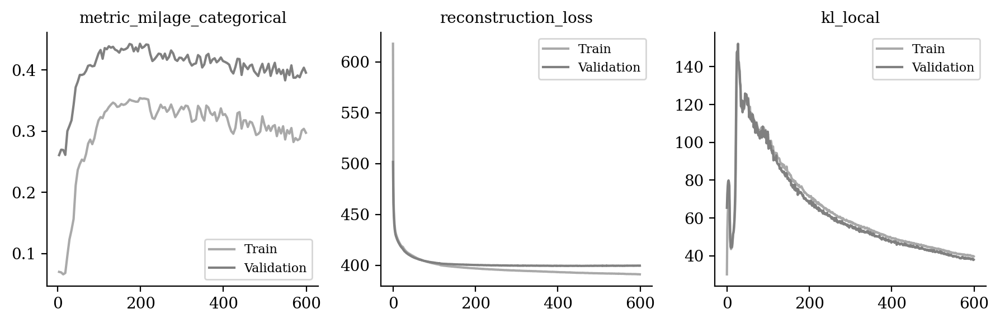

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

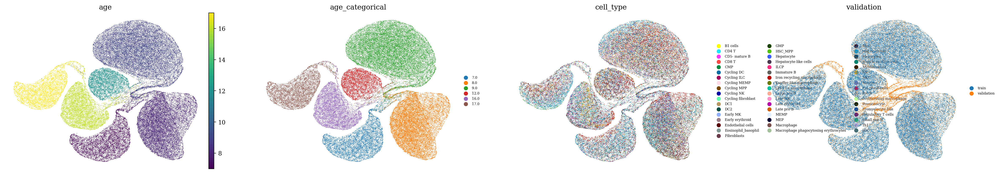

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

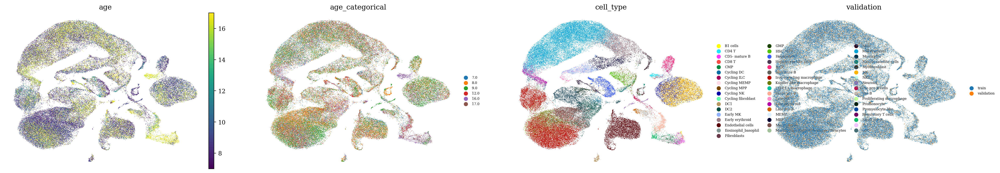

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

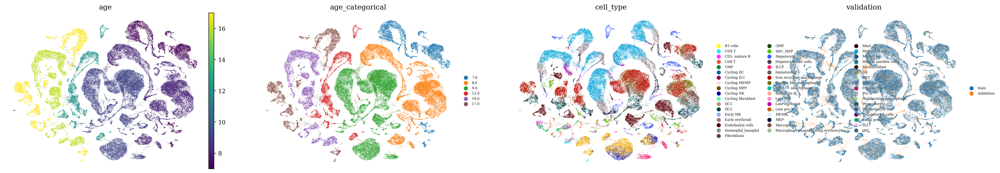

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )